<center> <b>Group R</b>
    


Afonso Gamito   |       20240752

Amine Raffali    |       20242055

Gonçalo Pacheco    |       20240695

Hassan Bhatti   |       20241023

João Sampaio      |       20240748

<hr>
<a class="anchor" id="libraries">
    
#  Libraries
    
</a>

In [289]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from math import ceil
import statistics
import scipy.stats as stats
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import STL
import xgboost as xgb
from pmdarima import auto_arima
from sklearn import metrics
import itertools
import re
import sklearn.metrics as metrics
from datetime import datetime
import locale
import sys
from statsmodels.tsa.stattools import adfuller
import pmdarima as pm
import time
import warnings
warnings.filterwarnings("ignore")


<hr>
<a class="anchor" id="Colors">
    
# Colors
</a>

In [ ]:

main_color= '#009490'

<hr>
<a class="anchor" id="Functions">
    
# Functions
</a>

In [291]:
# Creating a function to visualize trends and seasonality using the STL (Seasonal and Trend decomposition using Loess) method

def stl_decomposition(df, column):

    # Extract the column to be analyzed
    data = df[column]
    
    # Apply STL decomposition
    stl = STL(data, period=12)
    res = stl.fit()
    
    
    # Plot the results
    fig, axes = plt.subplots(2,2, sharex=True, figsize=(10,6), squeeze=True)  
    
    axes[0, 0].set_title(f'STL decomposition for {column}')
    axes[0, 0].plot(data.index, data.values, label='Original data', color=main_color)
    axes[0, 0].legend(loc='upper left')
    
    axes[0, 1].set_title('Seasonal component')
    axes[0, 1].plot(data.index, res.seasonal, color=main_color)
    
    axes[1, 0].set_title('Trend component')
    axes[1, 0].plot(data.index, res.trend, color=main_color)
    
    axes[1, 1].set_title('Residual component')
    axes[1, 1].plot(data.index, res.resid, color=main_color)
    
    plt.tight_layout()
    plt.show()

In [292]:
def hist_box_maker(df,titl, figx, figy):
    num_of_rows = len(df.columns)
    fig, axes = plt.subplots(num_of_rows, ceil((len(df.columns)*2)/num_of_rows), figsize=(figx, figy))
    temp = (list(df.columns)*2)
    temp.sort()
    # Iterate across axes objects and associate each histogram:
    i = 0 
    for ax, feat in zip(axes.flatten(), temp):
        if i%2 == 0:
            ax.hist(df[feat], bins = 50, color=main_color)
            ax.set_title(feat,x=-0.3)
            pltiswork=feat
        else:
            sns.boxplot(x=df[pltiswork], ax = ax, color=main_color)
        i+=1    
    title = titl
    plt.suptitle(title,y=0.90)
    plt.show()

In [293]:

def acf_pacf(df, column, lags=20):

    data = df[column]  # Extract column
    plt.style.use("ggplot")  # Set modern style

    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5), sharex=True)

    # Custom colors
    acf_color = "royalblue"
    pacf_color = "crimson"

    # Plot ACF
    plot_acf(data, ax=axes[0], lags=lags, color=acf_color)
    axes[0].set_title(f'Autocorrelation Function (ACF) - {column}', fontsize=12, fontweight="bold")

    # Plot PACF
    plot_pacf(data, ax=axes[1], lags=lags, color=pacf_color)
    axes[1].set_title(f'Partial Autocorrelation Function (PACF) - {column}', fontsize=12, fontweight="bold")

    plt.tight_layout()
    plt.show()


In [294]:
def plot_monthly_sales_by_product(df, product_type):


    df_melted = df.melt(id_vars='date', var_name='Product', value_name='Sales')


    df_filtered = df_melted[df_melted['Product'] == product_type]


    sales_by_month = df_filtered.groupby(pd.Grouper(key='date', freq='M')).sum()

    # Format the date string to display only the month and year
    sales_by_month.index = sales_by_month.index.strftime('%b %Y')

    sns.set_style("darkgrid")
    plt.figure(figsize=(15, 10))
    sns.barplot(x=sales_by_month.index, y='Sales', color= main_color, data=sales_by_month)
    plt.xticks(rotation=45)

    plt.title(f"Monthly Sales for {product_type}")
    plt.xlabel("Month")
    plt.ylabel("Sales")

    # Show the plot
    plt.show()


In [295]:


def plot_monthly_sales_by_product(df, product_type, main_color=main_color):
    # Melt the data to create a "long" format with separate rows for each product
    df_melted = df.melt(id_vars='date', var_name='Product', value_name='Sales')


    df_filtered = df_melted[df_melted['Product'] == product_type]

    sales_by_month = df_filtered.groupby(pd.Grouper(key='date', freq='M')).sum()

    sales_by_month.index = sales_by_month.index.strftime('%b %Y')


    sns.set_style("darkgrid")
    plt.figure(figsize=(15, 10))
    sns.lineplot(x=sales_by_month.index, y='Sales', color=main_color, data=sales_by_month)

    # Set the plot title and axis labels
    plt.title(f"Monthly Sales for {product_type}")
    plt.xlabel("Month")
    plt.ylabel("Sales")

    plt.xticks(rotation=45)

    # Show the plot
    plt.show()


In [296]:
# Function to create lag features
def create_lagged_features(data, n_in_start=1,n_in_end=8, n_out=1, dropnan=True, varNames=None):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = pd.DataFrame(data)
    cols, names = list(), list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in_end, n_in_start-1, -1):
        cols.append(df.shift(i))
        names += [(varNames[j]+'(t-%d)' % (i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
        if i == 0:
            names += [(varNames[j]+'(t)' ) for j in range(n_vars)]
        else:
            names += [(varNames[j]+'(t+%d)' % (i)) for j in range(n_vars)]
    # put it all together
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg

In [297]:
#function to check for stationarity using the Augmented Dickey-Fuller test and visualize the results
def stationarity_verification(df, product_column_name):

   
    plt.style.use("ggplot")  
    plt.figure(figsize=(12, 5)) 

    plt.title(f'Stationarity Check for {product_column_name}', fontsize=14, fontweight="bold")

    # Rolling Statistics
    plt.plot(df[product_column_name], label='Original Data', color='darkblue', alpha=0.8, linewidth=1.5)
    plt.plot(df[product_column_name].rolling(window=5).mean(), label='Rolling Mean', 
             color='limegreen', linestyle='--', linewidth=2)
    plt.plot(df[product_column_name].rolling(window=5).std(), label='Rolling Std Dev', 
             color='firebrick', linestyle=':', linewidth=2)

    plt.xlabel("Time", fontsize=12)
    plt.ylabel("Value", fontsize=12)
    plt.legend(fontsize=11, loc="best", frameon=True, shadow=True)
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.show()

    print('\nResults of Augmented Dickey-Fuller Test:')
    dftest = adfuller(df[product_column_name], autolag='AIC')

    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
    for key, value in dftest[4].items():
        dfoutput[f'Critical Value ({key})'] = value

    print(dfoutput)
    return dfoutput 

In [298]:
def plotTrainprediction(y_train, y_val=None, y_pred=None):
    plt.style.use("ggplot")  # Different style

    plt.figure(figsize=(12,5))  
    plt.title("Train, Validation and Prediction Sets for", fontsize=14, fontweight="bold")

    plt.plot(y_train, label="Training Set", color="royalblue", linestyle="-", marker="o", markersize=5)

    if y_val is not None:
        plt.plot(y_val, label="Validation Set", color="darkorange", linestyle="--", marker="s", markersize=5)


    if y_pred is not None:
          
        plt.plot(y_pred, label="Prediction Set", color="crimson", linestyle=":", marker="^", markersize=5)

    plt.xlabel("Time", fontsize=12)
    plt.ylabel("Value", fontsize=12)
    plt.legend(fontsize=11, loc="best", frameon=True, shadow=True)
    plt.grid(True, linestyle="--", alpha=0.6)

In [299]:
def plotTrainValidation(y_train, y_val=None, y_pred=None):
    plt.style.use("ggplot")  

    plt.figure(figsize=(12,5)) 
    plt.title("Train and Validation Sets", fontsize=14, fontweight="bold")

    plt.plot(y_train, label="Training Set", color="royalblue", linestyle="-", marker="o", markersize=5)

    if y_val is not None:
        plt.plot(y_val, label="Validation Set", color="darkorange", linestyle="--", marker="s", markersize=5)

    if y_pred is not None:
        plt.plot(y_pred, label="Prediction Set", color="crimson", linestyle=":", marker="^", markersize=5)

    plt.xlabel("Time", fontsize=12)
    plt.ylabel("Value", fontsize=12)
    plt.legend(fontsize=11, loc="best", frameon=True, shadow=True)
    plt.grid(True, linestyle="--", alpha=0.6)

In [300]:
def metricstable(metricsObj, yTrain=None, yPredTrain=None, yTest=None, 
                         yPredTest=None, set1="Train", set2="Test"):
    measures_list = ["MAE", "RMSE", "R^2", "MAPE (%)", "MAX Error"]
    if yTrain is not None:
        train_results = [
            np.round(metricsObj.mean_absolute_error(yTrain, yPredTrain),3),
            np.round(np.sqrt(metricsObj.mean_squared_error(yTrain, yPredTrain)),3),
            np.round(metricsObj.r2_score(yTrain, yPredTrain),3),
            np.round(metricsObj.mean_absolute_percentage_error(yTrain, yPredTrain),3),
            np.round(metricsObj.max_error(yTrain, yPredTrain),3),
        ]
    if yTest is not None:
        test_results = [
            np.round(metricsObj.mean_absolute_error(yTest, yPredTest),3),
            np.round(np.sqrt(metricsObj.mean_squared_error(yTest, yPredTest)),3),
            np.round(metricsObj.r2_score(yTest, yPredTest),3),
            np.round(metricsObj.mean_absolute_percentage_error(yTest, yPredTest),3),
            np.round(metricsObj.max_error(yTest, yPredTest),3)
        ]
    if (yTrain is not None) and (yTest is not None):
        resultsDF = pd.DataFrame(
            {"Measure": measures_list, set1: train_results, set2: test_results}
        )
    if (yTrain is None) and (yTest is not None):
        resultsDF = pd.DataFrame(
            {"Measure": measures_list, set2: test_results}
        )
    if (yTrain is not None) and (yTest is None):
        resultsDF = pd.DataFrame(
            {"Measure": measures_list, set1: train_results}
        )

    return resultsDF

In [301]:
def xgboostModel_predict_months(xgboost, X_train, y_train, months_to_predict):
    predictions = []
    
    X_train.index = pd.to_datetime(X_train.index)
    y_train.index = pd.to_datetime(y_train.index)


    X_train_copy = X_train.copy()
    y_train_copy = y_train.copy()
    
    for i in range(months_to_predict):

        last_date = y_train_copy.index[-1]
        
        new_date = last_date + pd.DateOffset(months=1)

        row_to_input = X_train_copy.iloc[-1:].copy()  
        row_to_input.index = [new_date]  

        # make prediction
        xgboost.fit(X_train_copy, y_train_copy)
        prediction = xgboost.predict(row_to_input)[0]
        predictions.append(prediction)

        # update the training data
        X_train_copy = pd.concat([X_train_copy, row_to_input])
        y_train_copy.loc[new_date] = prediction  # Evitar KeyError
        
    return X_train_copy, y_train_copy, predictions


In [302]:
class ProductsEnsemble:
 
    def __init__(self, estimators, suez_prophet): 

        
        self.estimators = estimators
    def fit_predict_all(self, X_train_list, y_train_list, X_test_list, y_test_list):

        predictions_list = []
        
        for ((name, estimator), X_train, y_train, X_test, y_test) in zip(
            self.estimators, X_train_list, y_train_list, X_test_list, y_test_list):
            
            forecasts = {}
            
            if 'mean' in estimator:
                predictions = np.full(len(y_test), np.mean(y_train))
                forecasts['mean'] = predictions

            if 'median' in estimator:
                predictions = np.full(len(y_test), np.median(y_train))
                forecasts['median'] = predictions

            if 'arima' in estimator:
                # Fit ARIMA and predict
                arima = auto_arima(y_train, start_p=1, start_q=1, trace=False, stationary=True,
                                stepwise=True, error_action='ignore', suppress_warnings=True)
                predictions = arima.predict(n_periods=10)  # Force 10-month prediction
                forecasts['arima'] = predictions

            if 'arima_w_reg' in estimator:
                regressors_arima = [regressor for regressor in X_train.columns if "GCK" not in regressor]
                arima_w_reg = auto_arima(y_train, X_train[regressors_arima], start_p=1, start_q=1,
                                        stationary=True, trace=False, stepwise=True,
                                        error_action='ignore', suppress_warnings=True)
                predictions = arima_w_reg.predict(n_periods=10, X=X_test[regressors_arima])
                forecasts['arima_w_reg'] = predictions

            if 'xgboost' in estimator:
                values = estimator.split("(")
                values = values[1].split(")")[0]
                n_estimators, max_depth, learning_rate = values.split(",")

                xgboost = xgb.XGBRegressor(n_estimators=int(n_estimators),
                                        max_depth=int(max_depth),
                                        learning_rate=float(learning_rate))

                # Ensure the model predicts for all 10 months
                _, _, predictions = xgboostModel_predict_months(xgboost, X_train, y_train, 10)
                forecasts['xgboost'] = predictions

            if 'ensemble' in estimator:
                predictions = sum(forecasts[forecast] for forecast in forecasts.keys()) / len(forecasts.keys())
            else:
                predictions = list(forecasts.values())[0]

            predictions_list.append(pd.DataFrame(predictions, index=pd.date_range(start=y_test.index[0], periods=10, freq='M')))

        return predictions_list


<hr>
<a class="anchor" id="importing">
    
# Data Importing
    
</a>

In [303]:
# Load data 
df = pd.read_csv('data/Case2_Sales data.csv', delimiter=';', header=0, encoding="utf-8")

test = pd.read_csv('data/Case2_Test Set Template.csv', delimiter=';', header=0, encoding="utf-8")

data_market = pd.read_excel('data/Case2_Market data.xlsx',header=None)


In [304]:
# Display all columns when printing a DataFrame
pd.set_option('display.max_columns',None)

<hr>
<a class="anchor" id="heading3">
    
# Market Data Reshaping
    
</a>

In [305]:
data_market.head(4)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47
0,NaN,China,China,France,France,Germany,Germany,Italy,Italy,Japan,Japan,Switzerland,Switzerland,United Kingdom,United Kingdom,United States,United States,Europe,Europe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Producer Prices,Producer Prices,Producer Prices,Producer Prices,Producer Prices,Producer Prices,production index,production index,production index,production index,production index,production index,production index,production index,production index,production index,production index,production index,production index,production index,production index,production index
1,Index 2010=100 (if not otherwise noted),Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,World: Price of Base Metals,World: Price of Energy,World: Price of Metals & Minerals,World: Price of Natural gas index,"World: Price of Crude oil, average",World: Price of Copper,United States: EUR in LCU,United States: Electrical equipment,United Kingdom: Electrical equipment,Italy: Electrical equipment,France: Electrical equipment,Germany: Electrical equipment,China: Electrical equipment,United States: Machinery and equipment n.e.c.,World: Machinery and equipment n.e.c.,Switzerland: Machinery and equipment n.e.c.,United Kingdom: Machinery and equipment n.e.c.,Italy: Machinery and equipment n.e.c.,Japan: Machinery and equipment n.e.c.,France: Machinery and equipment n.e.c.,Germany: Machinery and equipment n.e.c.,United States: Electrical equipment,World: Electrical equipment,Switzerland: Electrical equipment,United Kingdom: Electrical equipment,Italy: Electrical equipment,Japan: Electrical equipment,France: Electrical equipment,Germany: Electrical equipment
2,date,MAB_ELE_PRO156,MAB_ELE_SHP156,MAB_ELE_PRO250,MAB_ELE_SHP250,MAB_ELE_PRO276,MAB_ELE_SHP276,MAB_ELE_PRO380,MAB_ELE_SHP380,MAB_ELE_PRO392,MAB_ELE_SHP392,MAB_ELE_PRO756,MAB_ELE_SHP756,MAB_ELE_PRO826,MAB_ELE_SHP826,MAB_ELE_PRO840,MAB_ELE_SHP840,MAB_ELE_PRO1100,MAB_ELE_SHP1100,RohiBASEMET1000_org,RohiENERGY1000_org,RohiMETMIN1000_org,RohiNATGAS1000_org,RohCRUDE_PETRO1000_org,RohCOPPER1000_org,WKLWEUR840_org,PRI27840_org,PRI27826_org,PRI27380_org,PRI27250_org,PRI27276_org,PRI27156_org,PRO28840_org,PRO281000_org,PRO28756_org,PRO28826_org,PRO28380_org,PRO28392_org,PRO28250_org,PRO28276_org,PRO27840_org,PRO271000_org,PRO27756_org,PRO27826_org,PRO27380_org,PRO27392_org,PRO27250_org,PRO27276_org
3,2004m2,16.940704,16.940704,112.091273,83.458866,82.623037,79.452532,124.289603,86.560493,109.33401,110.495272,91.221862,89.987275,111.353812,73.601265,107.6014,79.24023,97.122911,80.09853,54.039811,44.123338,48.747945,87.076974,39.639458,36.623832,1.2646,78.969864,80.757423,93.020027,NaN,93.230453,NaN,102.491722,97.597374,97.1,106.191977,116.790276,110.890034,118.274109,80.82901,117.723991,NaN,81.1,120.706516,141.510864,106.161262,102.077057,85.9132


In [306]:
data_market.replace("",np.NaN,inplace=True)

In [307]:
data_market = data_market.applymap(lambda x: x.strip() if isinstance(x, str) else x)


In [308]:
data_market

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47
0,NaN,China,China,France,France,Germany,Germany,Italy,Italy,Japan,Japan,Switzerland,Switzerland,United Kingdom,United Kingdom,United States,United States,Europe,Europe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Producer Prices,Producer Prices,Producer Prices,Producer Prices,Producer Prices,Producer Prices,production index,production index,production index,production index,production index,production index,production index,production index,production index,production index,production index,production index,production index,production index,production index,production index
1,Index 2010=100 (if not otherwise noted),Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,Production Index Machinery & Electricals,Shipments Index Machinery & Electricals,World: Price of Base Metals,World: Price of Energy,World: Price of Metals & Minerals,World: Price of Natural gas index,"World: Price of Crude oil, average",World: Price of Copper,United States: EUR in LCU,United States: Electrical equipment,United Kingdom: Electrical equipment,Italy: Electrical equipment,France: Electrical equipment,Germany: Electrical equipment,China: Electrical equipment,United States: Machinery and equipment n.e.c.,World: Machinery and equipment n.e.c.,Switzerland: Machinery and equipment n.e.c.,United Kingdom: Machinery and equipment n.e.c.,Italy: Machinery and equipment n.e.c.,Japan: Machinery and equipment n.e.c.,France: Machinery and equipment n.e.c.,Germany: Machinery and equipment n.e.c.,United States: Electrical equipment,World: Electrical equipment,Switzerland: Electrical equipment,United Kingdom: Electrical equipment,Italy: Electrical equipment,Japan: Electrical equipment,France: Electrical equipment,Germany: Electrical equipment
2,date,MAB_ELE_PRO156,MAB_ELE_SHP156,MAB_ELE_PRO250,MAB_ELE_SHP250,MAB_ELE_PRO276,MAB_ELE_SHP276,MAB_ELE_PRO380,MAB_ELE_SHP380,MAB_ELE_PRO392,MAB_ELE_SHP392,MAB_ELE_PRO756,MAB_ELE_SHP756,MAB_ELE_PRO826,MAB_ELE_SHP826,MAB_ELE_PRO840,MAB_ELE_SHP840,MAB_ELE_PRO1100,MAB_ELE_SHP1100,RohiBASEMET1000_org,RohiENERGY1000_org,RohiMETMIN1000_org,RohiNATGAS1000_org,RohCRUDE_PETRO1000_org,RohCOPPER1000_org,WKLWEUR840_org,PRI27840_org,PRI27826_org,PRI27380_org,PRI27250_org,PRI27276_org,PRI27156_org,PRO28840_org,PRO281000_org,PRO28756_org,PRO28826_org,PRO28380_org,PRO28392_org,PRO28250_org,PRO28276_org,PRO27840_org,PRO271000_org,PRO27756_org,PRO27826_org,PRO27380_org,PRO27392_org,PRO27250_org,PRO27276_org
3,2004m2,16.940704,16.940704,112.091273,83.458866,82.623037,79.452532,124.289603,86.560493,109.33401,110.495272,91.221862,89.987275,111.353812,73.601265,107.6014,79.24023,97.122911,80.09853,54.039811,44.123338,48.747945,87.076974,39.639458,36.623832,1.2646,78.969864,80.757423,93.020027,NaN,93.230453,NaN,102.491722,97.597374,97.1,106.191977,116.790276,110.890034,118.274109,80.82901,117.723991,NaN,81.1,120.706516,141.510864,106.161262,102.077057,85.9132
4,2004m3,23.711852,23.711852,136.327976,106.168192,100.556582,97.012918,143.411662,106.344544,140.884616,144.686166,85.866287,79.883583,127.558608,84.047595,110.187364,98.619024,113.783904,96.015929,54.666162,47.588957,49.256157,87.192705,42.592034,39.931055,1.2262,79.673569,80.962135,93.540268,NaN,93.335678,NaN,105.62748,113.224892,91.195116,121.625075,139.288391,141.176853,148.121841,102.130104,1

In [309]:
pd.DataFrame(data_market.iloc[0:3,:].T).rename(columns={0:"Row 1",1:"Row 2",3:"Row 3"})

,Row 1,Row 2,2
0,NaN,Index 2010=100 (if not otherwise noted),date
1,China,Production Index Machinery & Electricals,MAB_ELE_PRO156
2,China,Shipments Index Machinery & Electricals,MAB_ELE_SHP156
3,France,Production Index Machinery & Electricals,MAB_ELE_PRO250
4,France,Shipments Index Machinery & Electricals,MAB_ELE_SHP250
5,Germany,Production Index Machinery & Electricals,MAB_ELE_PRO276
6,Germany,Shipments Index Machinery & Electricals,MAB_ELE_SHP276
7,Italy,Production Index Machinery & Electricals,MAB_ELE_PRO380
8,Italy,Shipments Index Machinery & Electricals,MAB_ELE_SHP380
9,Japan,Production Index Machinery & Electricals,MAB_ELE_PRO392


In [310]:
#From columns 1 to 18, location is on the first row and the index on the second.
location_on_first_row_columns=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18]

#From columns 19 to 47, location is joined to the second row through ":".
location_on_second_row_columns=np.arange(19,48)
producer_prices_columns=[26,27,28,29,30,31]
production_indexes_columns=[32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47]
#Eur in lcu will be replaced by EUR/USD
eur_in_lcu = 25

new_row=[]
for each_column in data_market.columns:
    
    if each_column in location_on_first_row_columns:
        new_row.append(data_market.iloc[1,each_column].title()+"_"+data_market.iloc[0,each_column].title())
        
    if each_column in location_on_second_row_columns:
        location=data_market.iloc[1,each_column].split(": ")[0].title()
        index=data_market.iloc[1,each_column].split(": ")[1].title()
        
        if each_column in producer_prices_columns:
            index="Producer Prices "+index
            
        if each_column in production_indexes_columns:
            index="Production Index "+index
            
        if each_column==eur_in_lcu:
            location="World"
            index="EUR/USD"
            
        new_row.append(index+"_"+location)

In [311]:
print(len(new_row))
print(len(data_market.columns[2:]))

47
46


In [312]:
# Replace unnecessary third row with the new one.
data_market.iloc[2,1:]=new_row
# Define the new row as columns and deleted the older ones.
data_market.columns=data_market.iloc[2,:]
data_market.drop([0,1,2],inplace=True)

# Map the date column, in datetime type
data_market['date'] = pd.to_datetime(data_market['date'].str.split('m', expand=True)[0] + '-' +
                                     data_market['date'].str.split('m', expand=True)[1] + '-1',
                                     format="%Y-%m-%d") + pd.offsets.MonthEnd(1)

#Set the date column as index
data_market.set_index(keys="date",drop=True,inplace=True)
data_market.columns.name = ''
# Map all the values to numeric, since they are values.
market_df = data_market.apply(pd.to_numeric)
#Reorder Columns by name
market_df = market_df.reindex(sorted(market_df.columns), axis=1)

In [313]:
data_market.head(4)

,Production Index Machinery & Electricals_China,Shipments Index Machinery & Electricals_China,Production Index Machinery & Electricals_France,Shipments Index Machinery & Electricals_France,Production Index Machinery & Electricals_Germany,Shipments Index Machinery & Electricals_Germany,Production Index Machinery & Electricals_Italy,Shipments Index Machinery & Electricals_Italy,Production Index Machinery & Electricals_Japan,Shipments Index Machinery & Electricals_Japan,Production Index Machinery & Electricals_Switzerland,Shipments Index Machinery & Electricals_Switzerland,Production Index Machinery & Electricals_United Kingdom,Shipments Index Machinery & Electricals_United Kingdom,Production Index Machinery & Electricals_United States,Shipments Index Machinery & Electricals_United States,Production Index Machinery & Electricals_Europe,Shipments Index Machinery & Electricals_Europe,Price Of Base Metals_World,Price Of Energy_World,Price Of Metals & Minerals_World,Price Of Natural Gas Index_World,"Price Of Crude Oil, Average_World",Price Of Copper_World,EUR/USD_World,Producer Prices Electrical Equipment_United States,Producer Prices Electrical Equipment_United Kingdom,Producer Prices Electrical Equipment_Italy,Producer Prices Electrical Equipment_France,Producer Prices Electrical Equipment_Germany,Producer Prices Electrical Equipment_China,Production Index Machinery And Equipment N.E.C._United States,Production Index Machinery And Equipment N.E.C._World,Production Index Machinery And Equipment N.E.C._Switzerland,Production Index Machinery And Equipment N.E.C._United Kingdom,Production Index Machinery And Equipment N.E.C._Italy,Production Index Machinery And Equipment N.E.C._Japan,Production Index Machinery And Equipment N.E.C._France,Production Index Machinery And Equipment N.E.C._Germany,Production Index Electrical Equipment_United States,Production Index Electrical Equipment_World,Production Index Electrical Equipment_Switzerland,Production Index Electrical Equipment_United Kingdom,Production Index Electrical Equipment_Italy,Production Index Electrical Equipment_Japan,Production Index Electrical Equipment_France,Production Index Electrical Equipment_Germany
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2004-02-29,16.940704,16.940704,112.091273,83.458866,82.623037,79.452532,124.289603,86.560493,109.33401,110.495272,91.221862,89.987275,111.353812,73.601265,107.6014,79.24023,97.122911,80.09853,54.039811,44.123338,48.747945,87.076974,39.639458,36.623832,1.2646,78.969864,80.757423,93.020027,NaN,93.230453,NaN,102.491722,97.597374,97.1,106.191977,116.790276,110.890034,118.274109,80.82901,117.723991,NaN,81.1,120.706516,141.510864,106.161262,102.077057,85.9132
2004-03-31,23.711852,23.711852,136.327976,106.168192,100.556582,97.012918,143.411662,106.344544,140.884616,144.686166,85.866287,79.883583,127.558608,84.047595,110.187364,98.619024,113.783904,96.015929,54.666162,47.588957,49.256157,87.192705,42.592034,39.931055,1.2262,79.673569,80.962135,93.540268,NaN,93.335678,NaN,105.62748,113.224892,91.195116,121.625075,139.288391,141.176853,148.121841,102.130104,119.220779,NaN,76.690307,138.30955,152.880234,140.288741,117.225685,97.670815
2004-04-30,24.435235,24.435235,117.791806,92.007646,89.653203,84.932358,129.083828,95.579673,105.853579,102.655769,85.622508,79.740802,108.732297,73.026027,108.166564,89.774031,101.715199,85.167236,54.872715,47.779013,49.423751,91.379923,42.650637,39.134854,1.1985,80.337639,80.757423,93.852425,NaN,93.440903,NaN,103.484955,100.16909,93.793535,104.965505,125.289566,105.648765,125.482231,90.961426,117.441124,NaN,71.552403,115.55733,137.796875,106.271197,105.335777,87.253983
2004-05-31,23.708115,23.708115,109.002541,85.696486,86.880571,82.372794,135.590391,100.087039,101.864777,100.305285,85.378729,79.598021,110.6452,74.591883,108.425887,87.463813,101.275727,84.485767,51.230356,53.590898,46.468392,99.04452,47.517121,36.278433,1.2007,80.798828,80.757423,93.852425,NaN,93.546127,NaN,103.643944,99.581436,96.391954

In [314]:
data_market.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 219 entries, 2004-02-29 to 2022-04-30
Data columns (total 47 columns):
 #   Column                                                          Non-Null Count  Dtype 
---  ------                                                          --------------  ----- 
 0   Production Index Machinery & Electricals_China                  219 non-null    object
 1   Shipments Index Machinery & Electricals_China                   219 non-null    object
 2   Production Index Machinery & Electricals_France                 219 non-null    object
 3   Shipments Index Machinery & Electricals_France                  219 non-null    object
 4   Production Index Machinery & Electricals_Germany                219 non-null    object
 5   Shipments Index Machinery & Electricals_Germany                 219 non-null    object
 6   Production Index Machinery & Electricals_Italy                  219 non-null    object
 7   Shipments Index Machinery & Electricals_Ita

<hr>
<a class="anchor" id="heading4">
    
# Sales Data Reshaping
    
</a>

In [315]:
print(df.info())
df.tail(3)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9802 entries, 0 to 9801
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   DATE        9802 non-null   object
 1   Mapped_GCK  9802 non-null   object
 2   Sales_EUR   9802 non-null   object
dtypes: object(3)
memory usage: 229.9+ KB
None


,DATE,Mapped_GCK,Sales_EUR
9799,12.08.2019,#12,0
9800,28.08.2019,#8,"43763,91"
9801,27.08.2019,#8,0


In [316]:
df.replace("",np.NaN,inplace=True)

In [317]:
df = df.applymap(lambda x: x.strip() if isinstance(x, str) else x)

In [318]:

df['Mapped_GCK'] = "GCK_"+df['Mapped_GCK'].str.replace('#', '')

df['Sales_EUR'] = df['Sales_EUR'].str.replace(',', '.')

In [319]:

df['date'] = pd.to_datetime(df['DATE'], format='%d.%m.%Y') 
df=df.pivot(index="date",columns="Mapped_GCK",values="Sales_EUR")

In [320]:

df = df.apply(pd.to_numeric)
#Reorder Columns by name
desired_order = ['GCK_1', 'GCK_3', 'GCK_4', 'GCK_5', 'GCK_6', 'GCK_8', 'GCK_9', 
                 'GCK_11', 'GCK_12', 'GCK_13', 'GCK_14', 'GCK_16', 'GCK_20', 'GCK_36']
df = df[desired_order]

In [321]:
df=df.resample('M').sum()

In [322]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 43 entries, 2018-10-31 to 2022-04-30
Freq: ME
Data columns (total 14 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   GCK_1   43 non-null     float64
 1   GCK_3   43 non-null     float64
 2   GCK_4   43 non-null     float64
 3   GCK_5   43 non-null     float64
 4   GCK_6   43 non-null     float64
 5   GCK_8   43 non-null     float64
 6   GCK_9   43 non-null     float64
 7   GCK_11  43 non-null     float64
 8   GCK_12  43 non-null     float64
 9   GCK_13  43 non-null     float64
 10  GCK_14  43 non-null     float64
 11  GCK_16  43 non-null     float64
 12  GCK_20  43 non-null     float64
 13  GCK_36  43 non-null     float64
dtypes: float64(14)
memory usage: 5.0 KB


In [323]:
df.tail()

Mapped_GCK,GCK_1,GCK_3,GCK_4,GCK_5,GCK_6,GCK_8,GCK_9,GCK_11,GCK_12,GCK_13,GCK_14,GCK_16,GCK_20,GCK_36
date,,,,,,,,,,,,,,
2021-12-31,33950069.83,12376414.58,199188.75,8656479.64,190074.96,2655036.78,14935.2,2645689.71,322647.82,24868.86,17427.60,271111.39,156.00,48933.50
2022-01-31,37942942.06,13754291.32,283630.81,7731408.33,157670.31,1208090.29,2064.7,1054580.98,147680.18,37972.81,2820.00,91021.89,0.00,6014.39
2022-02-28,36293076.33,15665217.47,245306.13,7675455.55,391088.30,1239171.41,901.5,964672.32,312165.52,33449.25,4410.00,45696.76,589.50,29869.50
2022-03-31,40220407.03,14320304.55,406399.83,14739187.18,316132.21,1873520.38,4452.6,2284958.40,343523.42,12149.40,46100.24,98729.91,2885.08,2564.85
2022-04-30,41053203.12,11999374.51,302057.04,8884607.53,333705.61,1336220.96,3285.0,1126268.66,178141.00,17020.04,1846.20,134071.24,6280.63,17029.47


<hr>
<a class="anchor" id="heading5">
    
# 5. EDA
    
</a>

<a class="anchor" id="market_df_exploration">
    
## 5.1. Market Data
    
</a>

In [324]:
data_market.head(4)

,Production Index Machinery & Electricals_China,Shipments Index Machinery & Electricals_China,Production Index Machinery & Electricals_France,Shipments Index Machinery & Electricals_France,Production Index Machinery & Electricals_Germany,Shipments Index Machinery & Electricals_Germany,Production Index Machinery & Electricals_Italy,Shipments Index Machinery & Electricals_Italy,Production Index Machinery & Electricals_Japan,Shipments Index Machinery & Electricals_Japan,Production Index Machinery & Electricals_Switzerland,Shipments Index Machinery & Electricals_Switzerland,Production Index Machinery & Electricals_United Kingdom,Shipments Index Machinery & Electricals_United Kingdom,Production Index Machinery & Electricals_United States,Shipments Index Machinery & Electricals_United States,Production Index Machinery & Electricals_Europe,Shipments Index Machinery & Electricals_Europe,Price Of Base Metals_World,Price Of Energy_World,Price Of Metals & Minerals_World,Price Of Natural Gas Index_World,"Price Of Crude Oil, Average_World",Price Of Copper_World,EUR/USD_World,Producer Prices Electrical Equipment_United States,Producer Prices Electrical Equipment_United Kingdom,Producer Prices Electrical Equipment_Italy,Producer Prices Electrical Equipment_France,Producer Prices Electrical Equipment_Germany,Producer Prices Electrical Equipment_China,Production Index Machinery And Equipment N.E.C._United States,Production Index Machinery And Equipment N.E.C._World,Production Index Machinery And Equipment N.E.C._Switzerland,Production Index Machinery And Equipment N.E.C._United Kingdom,Production Index Machinery And Equipment N.E.C._Italy,Production Index Machinery And Equipment N.E.C._Japan,Production Index Machinery And Equipment N.E.C._France,Production Index Machinery And Equipment N.E.C._Germany,Production Index Electrical Equipment_United States,Production Index Electrical Equipment_World,Production Index Electrical Equipment_Switzerland,Production Index Electrical Equipment_United Kingdom,Production Index Electrical Equipment_Italy,Production Index Electrical Equipment_Japan,Production Index Electrical Equipment_France,Production Index Electrical Equipment_Germany
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2004-02-29,16.940704,16.940704,112.091273,83.458866,82.623037,79.452532,124.289603,86.560493,109.33401,110.495272,91.221862,89.987275,111.353812,73.601265,107.6014,79.24023,97.122911,80.09853,54.039811,44.123338,48.747945,87.076974,39.639458,36.623832,1.2646,78.969864,80.757423,93.020027,NaN,93.230453,NaN,102.491722,97.597374,97.1,106.191977,116.790276,110.890034,118.274109,80.82901,117.723991,NaN,81.1,120.706516,141.510864,106.161262,102.077057,85.9132
2004-03-31,23.711852,23.711852,136.327976,106.168192,100.556582,97.012918,143.411662,106.344544,140.884616,144.686166,85.866287,79.883583,127.558608,84.047595,110.187364,98.619024,113.783904,96.015929,54.666162,47.588957,49.256157,87.192705,42.592034,39.931055,1.2262,79.673569,80.962135,93.540268,NaN,93.335678,NaN,105.62748,113.224892,91.195116,121.625075,139.288391,141.176853,148.121841,102.130104,119.220779,NaN,76.690307,138.30955,152.880234,140.288741,117.225685,97.670815
2004-04-30,24.435235,24.435235,117.791806,92.007646,89.653203,84.932358,129.083828,95.579673,105.853579,102.655769,85.622508,79.740802,108.732297,73.026027,108.166564,89.774031,101.715199,85.167236,54.872715,47.779013,49.423751,91.379923,42.650637,39.134854,1.1985,80.337639,80.757423,93.852425,NaN,93.440903,NaN,103.484955,100.16909,93.793535,104.965505,125.289566,105.648765,125.482231,90.961426,117.441124,NaN,71.552403,115.55733,137.796875,106.271197,105.335777,87.253983
2004-05-31,23.708115,23.708115,109.002541,85.696486,86.880571,82.372794,135.590391,100.087039,101.864777,100.305285,85.378729,79.598021,110.6452,74.591883,108.425887,87.463813,101.275727,84.485767,51.230356,53.590898,46.468392,99.04452,47.517121,36.278433,1.2007,80.798828,80.757423,93.852425,NaN,93.546127,NaN,103.643944,99.581436,96.391954

In [325]:
market_df.isna().sum()[market_df.isna().sum()>0]


Producer Prices Electrical Equipment_China                     23
Producer Prices Electrical Equipment_France                    35
Producer Prices Electrical Equipment_United Kingdom            18
Production Index Electrical Equipment_Switzerland               1
Production Index Electrical Equipment_World                    11
Production Index Machinery & Electricals_Switzerland            1
Production Index Machinery And Equipment N.E.C._Switzerland     1
Shipments Index Machinery & Electricals_Switzerland             1
Shipments Index Machinery & Electricals_United Kingdom         18
Shipments Index Machinery & Electricals_United States           1
dtype: int64

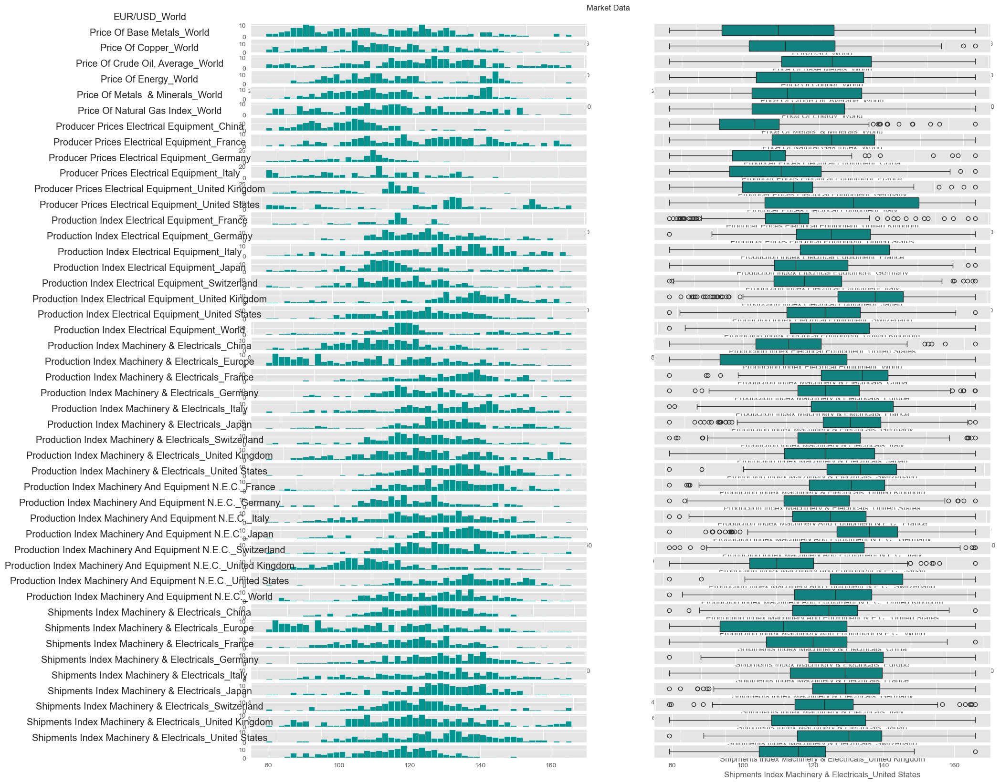

In [326]:

hist_box_maker(market_df,"Market Data", 20, 20)

In [327]:
market_df[market_df['Producer Prices Electrical Equipment_United Kingdom'].isna()].index

DatetimeIndex(['2020-11-30', '2020-12-31', '2021-01-31', '2021-02-28',
               '2021-03-31', '2021-04-30', '2021-05-31', '2021-06-30',
               '2021-07-31', '2021-08-31', '2021-09-30', '2021-10-31',
               '2021-11-30', '2021-12-31', '2022-01-31', '2022-02-28',
               '2022-03-31', '2022-04-30'],
              dtype='datetime64[ns]', name='date', freq=None)

<Axes: title={'center': 'Producer Prices Electrical Equipment United Kingdom'}, xlabel='date'>

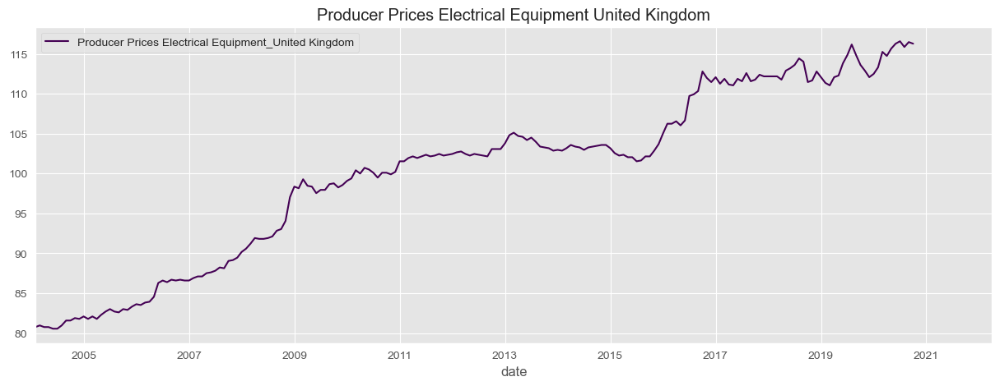

In [328]:
#plot all values
market_df.plot(y="Producer Prices Electrical Equipment_United Kingdom",cmap='viridis',figsize=(15,5),title="Producer Prices Electrical Equipment United Kingdom")

In [329]:
market_df[market_df['Producer Prices Electrical Equipment_France'].isna()].index

DatetimeIndex(['2004-02-29', '2004-03-31', '2004-04-30', '2004-05-31',
               '2004-06-30', '2004-07-31', '2004-08-31', '2004-09-30',
               '2004-10-31', '2004-11-30', '2004-12-31', '2005-01-31',
               '2005-02-28', '2005-03-31', '2005-04-30', '2005-05-31',
               '2005-06-30', '2005-07-31', '2005-08-31', '2005-09-30',
               '2005-10-31', '2005-11-30', '2005-12-31', '2006-01-31',
               '2006-02-28', '2006-03-31', '2006-04-30', '2006-05-31',
               '2006-06-30', '2006-07-31', '2006-08-31', '2006-09-30',
               '2006-10-31', '2006-11-30', '2006-12-31'],
              dtype='datetime64[ns]', name='date', freq=None)

<Axes: title={'center': 'Producer Prices Electrical Equipment France'}, xlabel='date'>

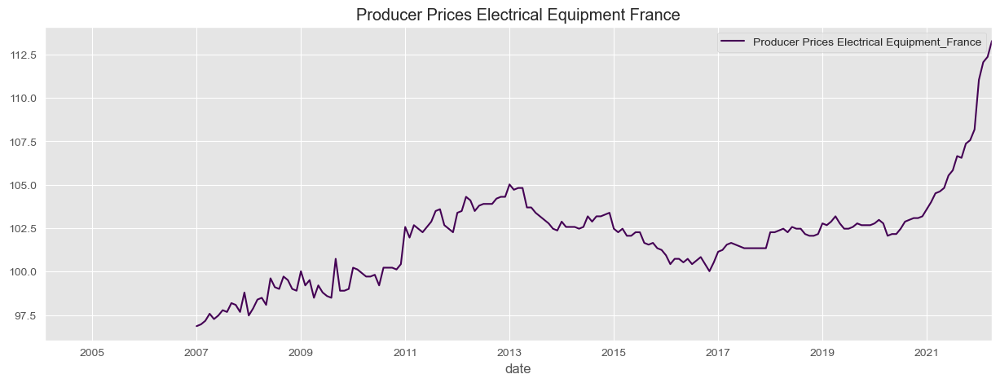

In [330]:
market_df.plot(y="Producer Prices Electrical Equipment_France",cmap='viridis',figsize=(15,5),title="Producer Prices Electrical Equipment France")

In [331]:
market_df[market_df['Producer Prices Electrical Equipment_United Kingdom'].isna()].index

DatetimeIndex(['2020-11-30', '2020-12-31', '2021-01-31', '2021-02-28',
               '2021-03-31', '2021-04-30', '2021-05-31', '2021-06-30',
               '2021-07-31', '2021-08-31', '2021-09-30', '2021-10-31',
               '2021-11-30', '2021-12-31', '2022-01-31', '2022-02-28',
               '2022-03-31', '2022-04-30'],
              dtype='datetime64[ns]', name='date', freq=None)

<Axes: title={'center': 'Producer Prices Electrical Equipment United Kingdom'}, xlabel='date'>

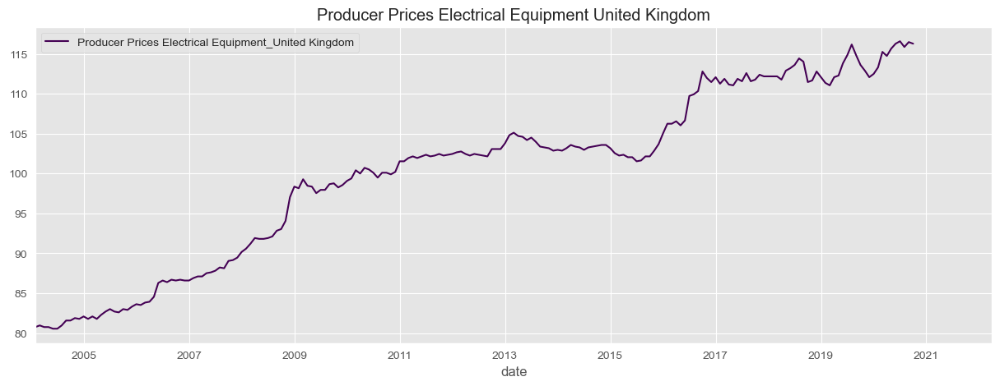

In [332]:
#plot all values
market_df.plot(y="Producer Prices Electrical Equipment_United Kingdom",cmap='viridis',figsize=(15,5),title="Producer Prices Electrical Equipment United Kingdom")

In [333]:
market_df[market_df['Production Index Electrical Equipment_Switzerland'].isna()].index

DatetimeIndex(['2022-04-30'], dtype='datetime64[ns]', name='date', freq=None)

<Axes: title={'center': 'Production Index Electrical Equipment Switzerland'}, xlabel='date'>

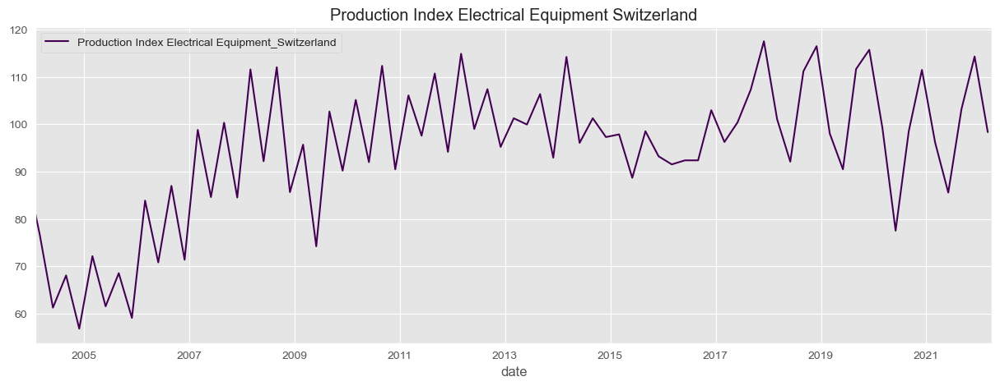

In [334]:
market_df.plot(y="Production Index Electrical Equipment_Switzerland",cmap='viridis',figsize=(15,5),title="Production Index Electrical Equipment Switzerland")

In [335]:
market_df[market_df['Production Index Electrical Equipment_World'].isna()].index

DatetimeIndex(['2004-02-29', '2004-03-31', '2004-04-30', '2004-05-31',
               '2004-06-30', '2004-07-31', '2004-08-31', '2004-09-30',
               '2004-10-31', '2004-11-30', '2004-12-31'],
              dtype='datetime64[ns]', name='date', freq=None)

<Axes: title={'center': 'Production Index Electrical Equipment World'}, xlabel='date'>

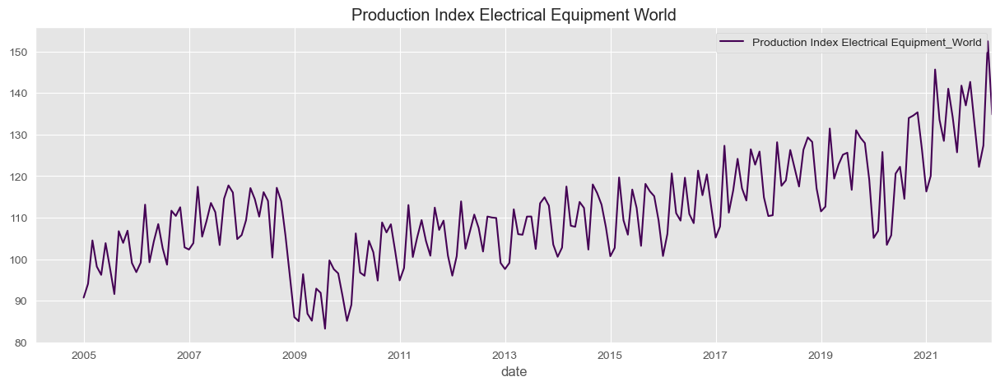

In [336]:
market_df.plot(y="Production Index Electrical Equipment_World",cmap='viridis',figsize=(15,5),title="Production Index Electrical Equipment World")

In [337]:
market_df[market_df['Production Index Machinery & Electricals_Switzerland'].isna()].index

DatetimeIndex(['2022-04-30'], dtype='datetime64[ns]', name='date', freq=None)

<Axes: title={'center': 'Production Index Machinery & Electricals Switzerland'}, xlabel='date'>

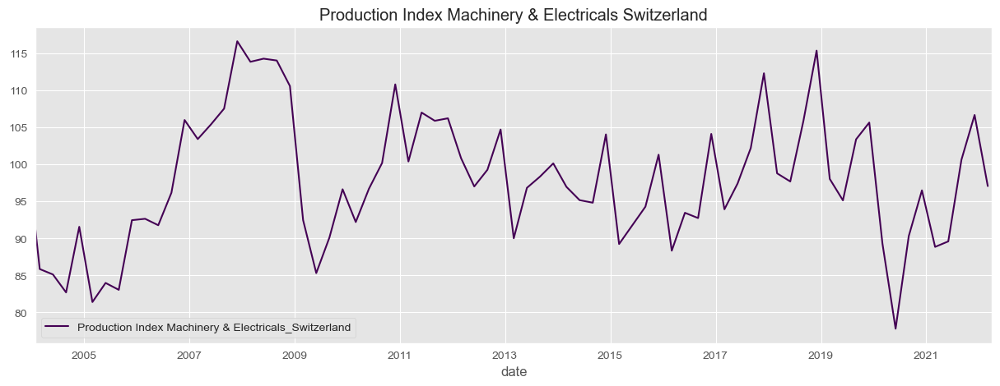

In [338]:
#plot all values
market_df.plot(y="Production Index Machinery & Electricals_Switzerland",cmap='viridis',figsize=(15,5),title="Production Index Machinery & Electricals Switzerland")

In [339]:
market_df[market_df['Production Index Machinery And Equipment N.E.C._Switzerland'].isna()].index

DatetimeIndex(['2022-04-30'], dtype='datetime64[ns]', name='date', freq=None)

<Axes: title={'center': 'Production Index Machinery And Equipment N.E.C. Switzerland'}, xlabel='date'>

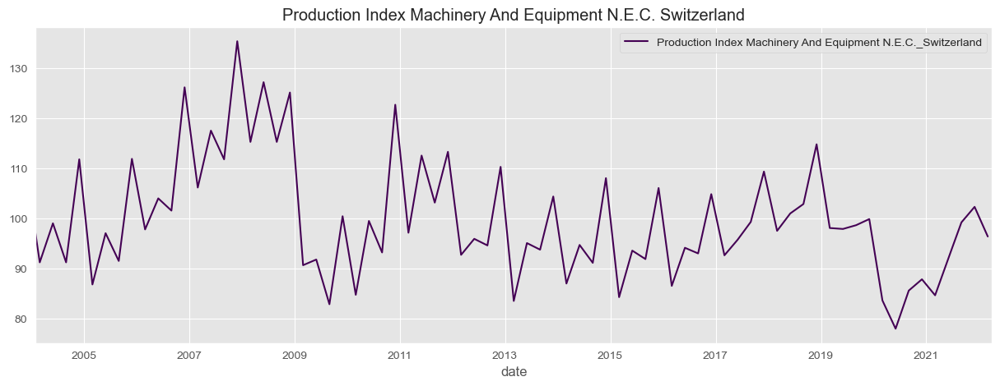

In [340]:
market_df.plot(y="Production Index Machinery And Equipment N.E.C._Switzerland",cmap='viridis',figsize=(15,5),title="Production Index Machinery And Equipment N.E.C. Switzerland")

In [341]:
market_df[market_df['Shipments Index Machinery & Electricals_Switzerland'].isna()].index

DatetimeIndex(['2022-04-30'], dtype='datetime64[ns]', name='date', freq=None)

<Axes: title={'center': 'Shipments Index Machinery & Electricals Switzerland'}, xlabel='date'>

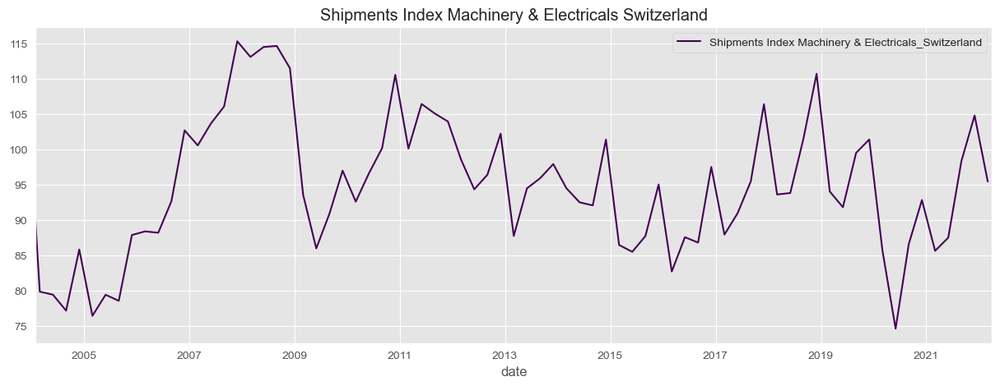

In [342]:
market_df.plot(y="Shipments Index Machinery & Electricals_Switzerland",cmap='viridis',figsize=(15,5),title="Shipments Index Machinery & Electricals Switzerland")

In [343]:
market_df[market_df['Shipments Index Machinery & Electricals_United Kingdom'].isna()].index

DatetimeIndex(['2020-11-30', '2020-12-31', '2021-01-31', '2021-02-28',
               '2021-03-31', '2021-04-30', '2021-05-31', '2021-06-30',
               '2021-07-31', '2021-08-31', '2021-09-30', '2021-10-31',
               '2021-11-30', '2021-12-31', '2022-01-31', '2022-02-28',
               '2022-03-31', '2022-04-30'],
              dtype='datetime64[ns]', name='date', freq=None)

<Axes: title={'center': 'Shipments Index Machinery & Electricals United Kingdom'}, xlabel='date'>

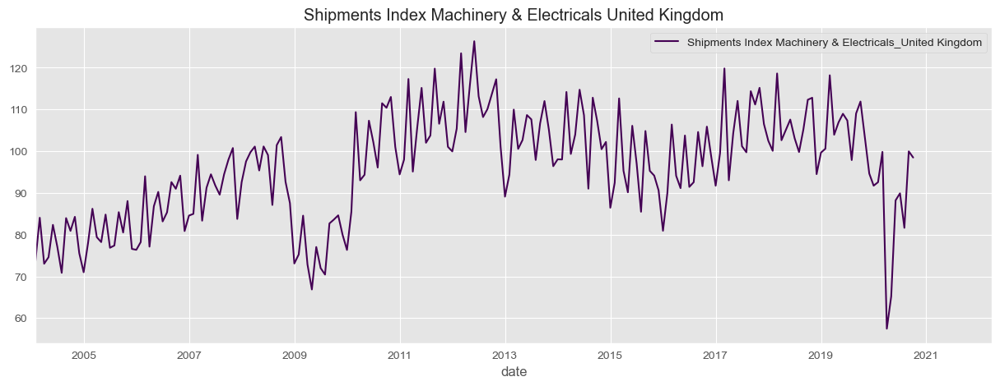

In [344]:
market_df.plot(y="Shipments Index Machinery & Electricals_United Kingdom",cmap='viridis',figsize=(15,5),title="Shipments Index Machinery & Electricals United Kingdom")

In [345]:
market_df[market_df['Shipments Index Machinery & Electricals_United States'].isna()].index

DatetimeIndex(['2022-04-30'], dtype='datetime64[ns]', name='date', freq=None)

<Axes: title={'center': 'Shipments Index Machinery & Electricals United States'}, xlabel='date'>

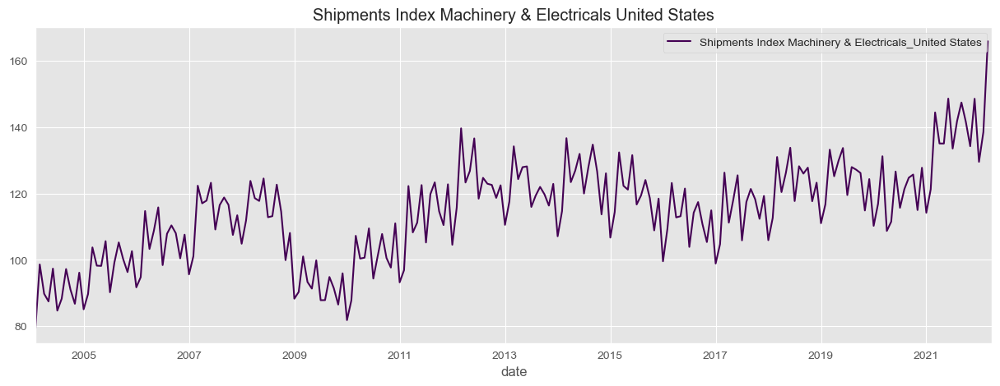

In [346]:
market_df.plot(y="Shipments Index Machinery & Electricals_United States",cmap='viridis',figsize=(15,5),title="Shipments Index Machinery & Electricals United States")

In [347]:
stats = market_df.describe().T
duplicate_stats = stats.duplicated(keep=False)
same_stats_columns = stats[duplicate_stats]
same_stats_columns

,count,mean,std,min,25%,50%,75%,max
,,,,,,,,
Production Index Machinery & Electricals_China,219.0,138.303637,78.883209,16.940704,68.47774,133.50769,198.473934,329.413367
Shipments Index Machinery & Electricals_China,219.0,138.303637,78.883209,16.940704,68.47774,133.50769,198.473934,329.413367


In [348]:

market_df[market_df.duplicated()]

,EUR/USD_World,Price Of Base Metals_World,Price Of Copper_World,"Price Of Crude Oil, Average_World",Price Of Energy_World,Price Of Metals & Minerals_World,Price Of Natural Gas Index_World,Producer Prices Electrical Equipment_China,Producer Prices Electrical Equipment_France,Producer Prices Electrical Equipment_Germany,Producer Prices Electrical Equipment_Italy,Producer Prices Electrical Equipment_United Kingdom,Producer Prices Electrical Equipment_United States,Production Index Electrical Equipment_France,Production Index Electrical Equipment_Germany,Production Index Electrical Equipment_Italy,Production Index Electrical Equipment_Japan,Production Index Electrical Equipment_Switzerland,Production Index Electrical Equipment_United Kingdom,Production Index Electrical Equipment_United States,Production Index Electrical Equipment_World,Production Index Machinery & Electricals_China,Production Index Machinery & Electricals_Europe,Production Index Machinery & Electricals_France,Production Index Machinery & Electricals_Germany,Production Index Machinery & Electricals_Italy,Production Index Machinery & Electricals_Japan,Production Index Machinery & Electricals_Switzerland,Production Index Machinery & Electricals_United Kingdom,Production Index Machinery & Electricals_United States,Production Index Machinery And Equipment N.E.C._France,Production Index Machinery And Equipment N.E.C._Germany,Production Index Machinery And Equipment N.E.C._Italy,Production Index Machinery And Equipment N.E.C._Japan,Production Index Machinery And Equipment N.E.C._Switzerland,Production Index Machinery And Equipment N.E.C._United Kingdom,Production Index Machinery And Equipment N.E.C._United States,Production Index Machinery And Equipment N.E.C._World,Shipments Index Machinery & Electricals_China,Shipments Index Machinery & Electricals_Europe,Shipments Index Machinery & Electricals_France,Shipments Index Machinery & Electricals_Germany,Shipments Index Machinery & Electricals_Italy,Shipments Index Machinery & Electricals_Japan,Shipments Index Machinery & Electricals_Switzerland,Shipments Index Machinery & Electricals_United Kingdom,Shipments Index Machinery & Electricals_United States
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


In [349]:
market_df

,EUR/USD_World,Price Of Base Metals_World,Price Of Copper_World,"Price Of Crude Oil, Average_World",Price Of Energy_World,Price Of Metals & Minerals_World,Price Of Natural Gas Index_World,Producer Prices Electrical Equipment_China,Producer Prices Electrical Equipment_France,Producer Prices Electrical Equipment_Germany,Producer Prices Electrical Equipment_Italy,Producer Prices Electrical Equipment_United Kingdom,Producer Prices Electrical Equipment_United States,Production Index Electrical Equipment_France,Production Index Electrical Equipment_Germany,Production Index Electrical Equipment_Italy,Production Index Electrical Equipment_Japan,Production Index Electrical Equipment_Switzerland,Production Index Electrical Equipment_United Kingdom,Production Index Electrical Equipment_United States,Production Index Electrical Equipment_World,Production Index Machinery & Electricals_China,Production Index Machinery & Electricals_Europe,Production Index Machinery & Electricals_France,Production Index Machinery & Electricals_Germany,Production Index Machinery & Electricals_Italy,Production Index Machinery & Electricals_Japan,Production Index Machinery & Electricals_Switzerland,Production Index Machinery & Electricals_United Kingdom,Production Index Machinery & Electricals_United States,Production Index Machinery And Equipment N.E.C._France,Production Index Machinery And Equipment N.E.C._Germany,Production Index Machinery And Equipment N.E.C._Italy,Production Index Machinery And Equipment N.E.C._Japan,Production Index Machinery And Equipment N.E.C._Switzerland,Production Index Machinery And Equipment N.E.C._United Kingdom,Production Index Machinery And Equipment N.E.C._United States,Production Index Machinery And Equipment N.E.C._World,Shipments Index Machinery & Electricals_China,Shipments Index Machinery & Electricals_Europe,Shipments Index Machinery & Electricals_France,Shipments Index Machinery & Electricals_Germany,Shipments Index Machinery & Electricals_Italy,Shipments Index Machinery & Electricals_Japan,Shipments Index Machinery & Electricals_Switzerland,Shipments Index Machinery & Electricals_United Kingdom,Shipments Index Machinery & Electricals_United States
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2004-02-29,1.2646,54.039811,36.623832,39.639458,44.123338,48.747945,87.076974,NaN,NaN,93.230453,93.020027,80.757423,78.969864,102.077057,85.913200,141.510864,106.161262,81.100000,120.706516,117.723991,NaN,16.940704,97.122911,112.091273,82.623037,124.289603,109.334010,91.221862,111.353812,107.601400,118.274109,80.829010,116.790276,110.890034,97.100000,106.191977,102.491722,97.597374,16.940704,80.098530,83.458866,79.452532,86.560493,110.495272,89.987275,73.601265,79.240230
2004-03-31,1.2262,54.666162,39.931055,42.592034,47.588957,49.256157,87.192705,NaN,NaN,93.335678,93.540268,80.962135,79.673569,117.225685,97.670815,152.880234,140.288741,76.690307,138.309550,119.220779,NaN,23.711852,113.783904,136.327976,100.556582,143.411662,140.884616,85.866287,127.558608,110.187364,148.121841,102.130104,139.288391,141.176853,91.195116,121.625075,105.627480,113.224892,23.711852,96.015929,106.168192,97.012918,106.344544,144.686166,79.883583,84.047595,98.619024
2004-04-30,1.1985,54.872715,39.134854,42.650637,47.779013,49.423751,91.379923,NaN,NaN,93.440903,93.852425,80.757423,80.337639,105.335777,87.253983,137.796875,106.271197,71.552403,115.557330,117.441124,NaN,24.435235,101.715199,117.791806,89.653203,129.083828,105.853579,85.622508,108.732297,108.166564,125.482231,90.961426,125.289566,105.648765,93.793535,104.965505,103.484955,100.169090,24.435235,85.167236,92.007646,84.932358,95.579673,102.655769,79.740802,73.026027,89.774031
2004-05-31,1.2007,51.230356,36.278433,47.517121,53.590898,46.468392,99.044520,NaN,NaN,93.546127,93.852425,80.757423,80.798828,96.616508,84.675552,143.860535,101.608710,66.414500,119.269534,117.899216,NaN,23.708115,101.275727,109.002541,86.880571,135.590391,101.864777,85.378729,110.645200,108.425887,116.649750,88.08290

<a class="anchor" id="sales_exploration">
    
## 5.2. Sales Data
    
</a>

In [350]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 43 entries, 2018-10-31 to 2022-04-30
Freq: ME
Data columns (total 14 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   GCK_1   43 non-null     float64
 1   GCK_3   43 non-null     float64
 2   GCK_4   43 non-null     float64
 3   GCK_5   43 non-null     float64
 4   GCK_6   43 non-null     float64
 5   GCK_8   43 non-null     float64
 6   GCK_9   43 non-null     float64
 7   GCK_11  43 non-null     float64
 8   GCK_12  43 non-null     float64
 9   GCK_13  43 non-null     float64
 10  GCK_14  43 non-null     float64
 11  GCK_16  43 non-null     float64
 12  GCK_20  43 non-null     float64
 13  GCK_36  43 non-null     float64
dtypes: float64(14)
memory usage: 5.0 KB


In [351]:
df.head()

Mapped_GCK,GCK_1,GCK_3,GCK_4,GCK_5,GCK_6,GCK_8,GCK_9,GCK_11,GCK_12,GCK_13,GCK_14,GCK_16,GCK_20,GCK_36
date,,,,,,,,,,,,,,
2018-10-31,36098918.79,8089465.96,397760.69,2499061.19,369231.60,586052.74,3219.32,1021303.50,28686.33,27666.10,5770.0,333196.87,4563.14,6474.60
2018-11-30,5140760.00,11863001.51,371322.42,8993944.04,473046.96,526292.77,1875.90,1898844.80,1070.00,68180.00,17130.0,1377694.32,5798.14,21617.61
2018-12-31,37889612.12,8736859.39,430100.96,6947507.31,999472.69,271490.71,0.00,1226122.00,17880.60,15655.18,0.0,4762524.66,918.65,13924.52
2019-01-31,27728148.35,10705300.63,484173.88,8233205.07,598874.10,381400.15,1487.00,2216391.74,21484.00,27198.29,1686.4,942957.19,2398.04,15444.39
2019-02-28,34793163.53,10167796.86,620031.80,6879250.99,542037.52,368475.57,3234.28,610456.60,34214.74,32638.63,19196.3,257765.04,620.66,8051.15


<a class="anchor" id="subtitle6.2.1">
    
### 6.2.1. Missing Values 
    
</a>

In [352]:
df.isna().sum()
#There are no missing values

Mapped_GCK
GCK_1     0
GCK_3     0
GCK_4     0
GCK_5     0
GCK_6     0
GCK_8     0
GCK_9     0
GCK_11    0
GCK_12    0
GCK_13    0
GCK_14    0
GCK_16    0
GCK_20    0
GCK_36    0
dtype: int64

<a class="anchor" id="subtitle6.2.2">
    
### .Duplicated Columns/GCK Sales
    
</a>

In [353]:
# Checking columns with same descriptive statistics
describe_df=df.describe().T
describe_df[describe_df.duplicated(keep=False)]
#There are no GCK with the same sales.

,count,mean,std,min,25%,50%,75%,max
Mapped_GCK,,,,,,,,


<a class="anchor" id="subtitle6.2.3">
    
### Duplicated Values
    
</a>

In [354]:
df.duplicated(keep=False).sum()

0

In [355]:
df[df.duplicated(keep=False)]

Mapped_GCK,GCK_1,GCK_3,GCK_4,GCK_5,GCK_6,GCK_8,GCK_9,GCK_11,GCK_12,GCK_13,GCK_14,GCK_16,GCK_20,GCK_36
date,,,,,,,,,,,,,,


<a class="anchor" id="subtitle6.2.4">
    
###  Outlier Detection
    
</a>

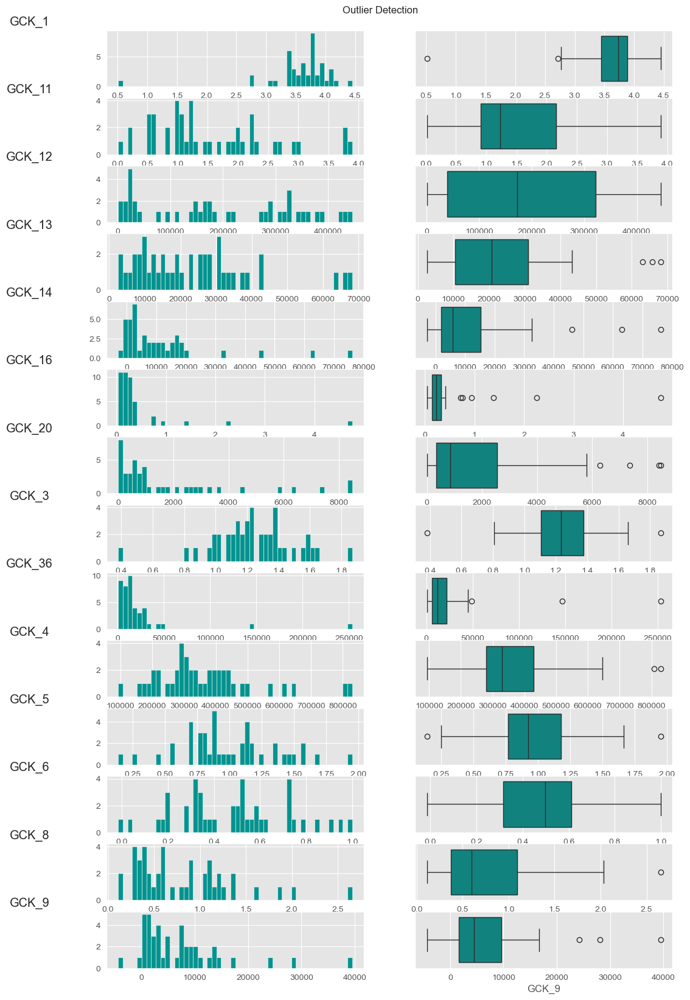

In [356]:
hist_box_maker(df,"Outlier Detection",12,20)


<a class="anchor" id="subtitle6.2.5">
    
### 6.2.5. Descriptive Statistics
    
</a>

In [357]:
df.describe(include='all').T


,count,mean,std,min,25%,50%,75%,max
Mapped_GCK,,,,,,,,
GCK_1,43.0,3.591177e+07,5.905117e+06,5140760.00,3.440896e+07,37323903.07,3.888867e+07,44483013.86
GCK_3,43.0,1.240566e+07,2.577332e+06,3804319.74,1.105907e+07,12317479.75,1.377567e+07,18686819.85
GCK_4,43.0,3.634234e+05,1.557109e+05,93226.32,2.797995e+05,329430.96,4.281611e+05,829442.33
GCK_5,43.0,9.990585e+06,3.731564e+06,1405295.36,7.703432e+06,9232237.68,1.180077e+07,19524640.52
GCK_6,43.0,4.800440e+05,2.422862e+05,-15202.96,3.160555e+05,499147.73,6.119871e+05,999472.69
GCK_8,43.0,8.109586e+05,5.436111e+05,111791.34,3.749379e+05,599831.93,1.092310e+06,2655036.78
GCK_9,43.0,7.173175e+03,8.231269e+03,-4358.10,1.626700e+03,4488.09,9.583200e+03,39510.75
GCK_11,43.0,1.532589e+06,9.811598e+05,18200.00,9.035992e+05,1226122.00,2.161184e+06,3891447.76
GCK_12,43.0,1.925462e+05,1.410168e+05,1070.00,3.923521e+04,172712.88,3.217951e+05,445648.06


<a class="anchor" id="STATIONARITY">
    
### Stationarity  and ACF and PACF Analysis
    
</a>

<a class="anchor" id="GCK_1">
    
#### GCK_1
    
</a>


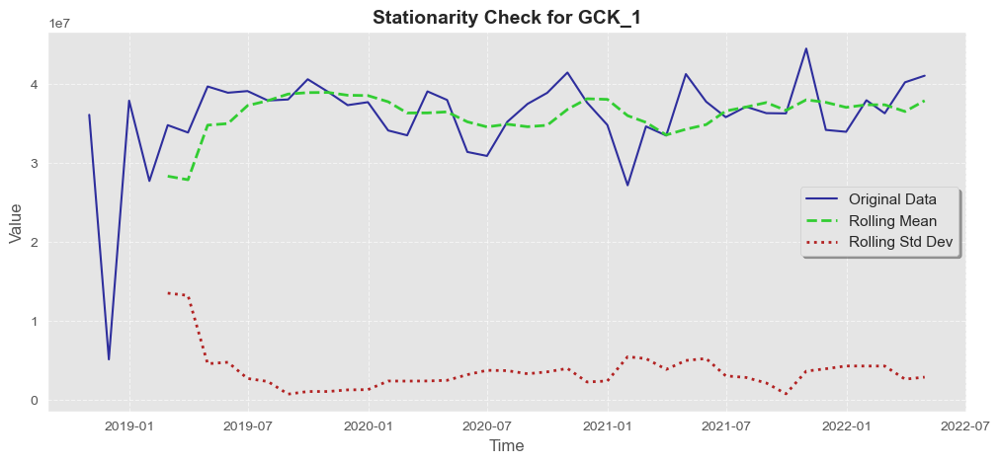


Results of Augmented Dickey-Fuller Test:
Test Statistic                -6.002443e+00
p-value                        1.645124e-07
#Lags Used                     0.000000e+00
Number of Observations Used    4.200000e+01
Critical Value (1%)           -3.596636e+00
Critical Value (5%)           -2.933297e+00
Critical Value (10%)          -2.604991e+00
dtype: float64


Test Statistic                -6.002443e+00
p-value                        1.645124e-07
#Lags Used                     0.000000e+00
Number of Observations Used    4.200000e+01
Critical Value (1%)           -3.596636e+00
Critical Value (5%)           -2.933297e+00
Critical Value (10%)          -2.604991e+00
dtype: float64

In [358]:


stationarity_verification (df, 'GCK_1')

#Since p-value is less than a significance level of 1%, we reject the null hypotheses, therefore, the data is stationary. 
#Therefore, product 1 does not have seasonality and trend

#The rolling mean and rolling std are approximately constant over time.

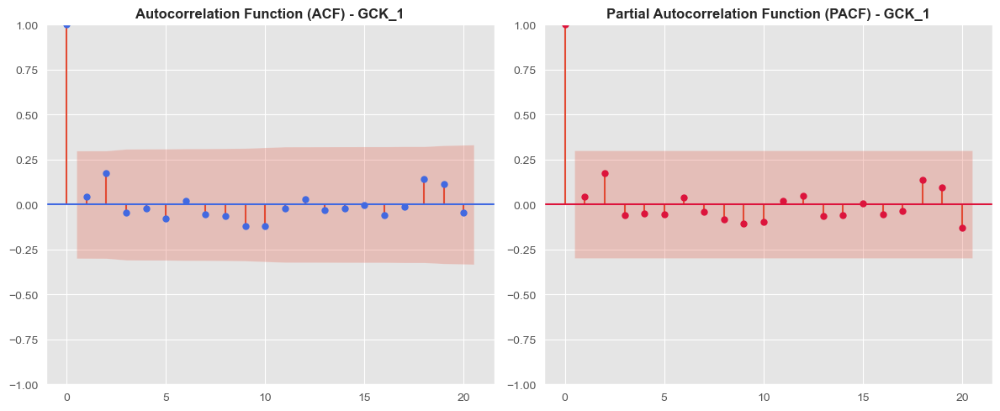

In [359]:

acf_pacf(df, 'GCK_1') 

# According to the graphs there is no autocorrection for produtct 1, so we cant use lag variables to predict

**Product 3**

<a class="anchor" id="GCK_3">
    
#### GCK_3
    
</a>


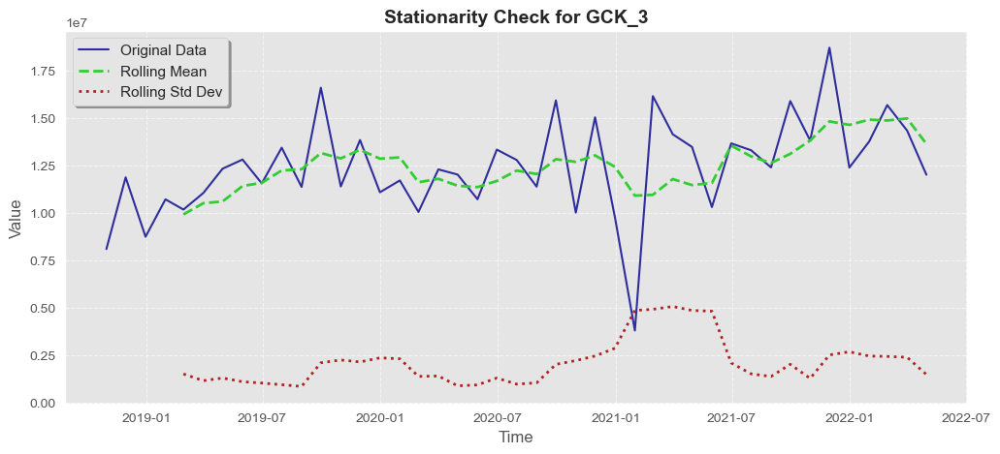


Results of Augmented Dickey-Fuller Test:
Test Statistic                -6.590291e+00
p-value                        7.142768e-09
#Lags Used                     0.000000e+00
Number of Observations Used    4.200000e+01
Critical Value (1%)           -3.596636e+00
Critical Value (5%)           -2.933297e+00
Critical Value (10%)          -2.604991e+00
dtype: float64


Test Statistic                -6.590291e+00
p-value                        7.142768e-09
#Lags Used                     0.000000e+00
Number of Observations Used    4.200000e+01
Critical Value (1%)           -3.596636e+00
Critical Value (5%)           -2.933297e+00
Critical Value (10%)          -2.604991e+00
dtype: float64

In [360]:
stationarity_verification (df, 'GCK_3')

# Since p-value is less than a significance level of 1%, we reject the null hypotheses, therefore, the data 
#is stationary. Therefore, product 3 does not have seasonality and trend

# The rolling mean and rolling std are approximately constant over time.

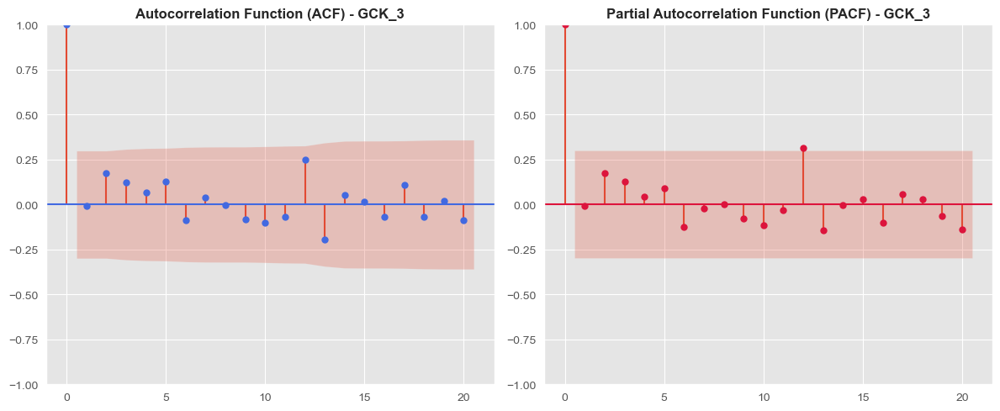

In [361]:

acf_pacf(df, 'GCK_3')

# According to the graphs there is no total autocorrelation for product 3 as well as partial
#(except only one lag value - 12)

<a class="anchor" id="GCK_34">
    
#### GCK_4
    
</a>


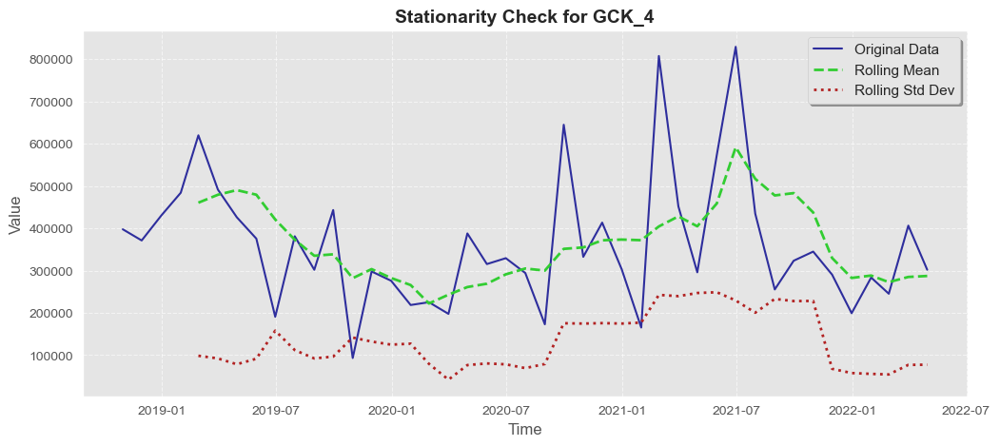


Results of Augmented Dickey-Fuller Test:
Test Statistic                 -5.319293
p-value                         0.000005
#Lags Used                      0.000000
Number of Observations Used    42.000000
Critical Value (1%)            -3.596636
Critical Value (5%)            -2.933297
Critical Value (10%)           -2.604991
dtype: float64


Test Statistic                 -5.319293
p-value                         0.000005
#Lags Used                      0.000000
Number of Observations Used    42.000000
Critical Value (1%)            -3.596636
Critical Value (5%)            -2.933297
Critical Value (10%)           -2.604991
dtype: float64

In [362]:

stationarity_verification (df, 'GCK_4')

#Since p-value is less than a significance level of 1%, we reject the null hypotheses, therefore, the data is stationary. 
#Therefore, product 4 does not have seasonality and trend

#The rolling mean and rolling std are not constant over time.

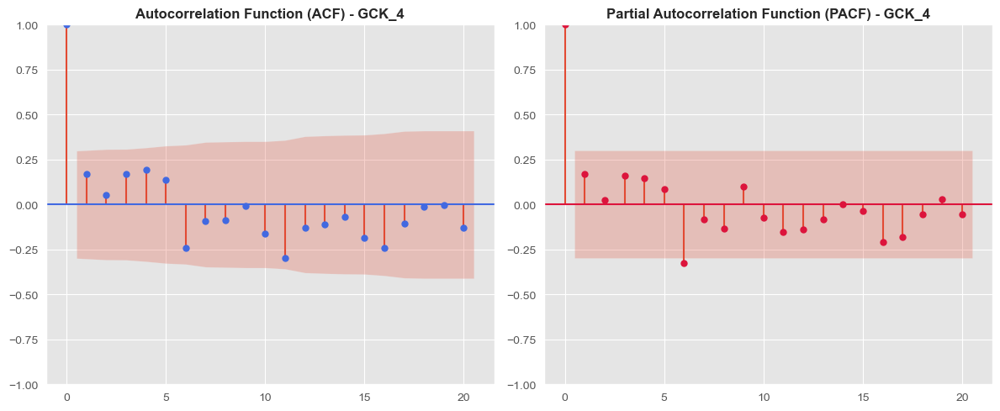

In [363]:

acf_pacf(df, 'GCK_4')

# According to the graphs there is no total autocorrelation for product 4 as well as partial
#(except 6 lag values (6,16,17,18,19,20))

<a class="anchor" id="subtitle6.1.3">
    
#### GCK_5
    
</a>


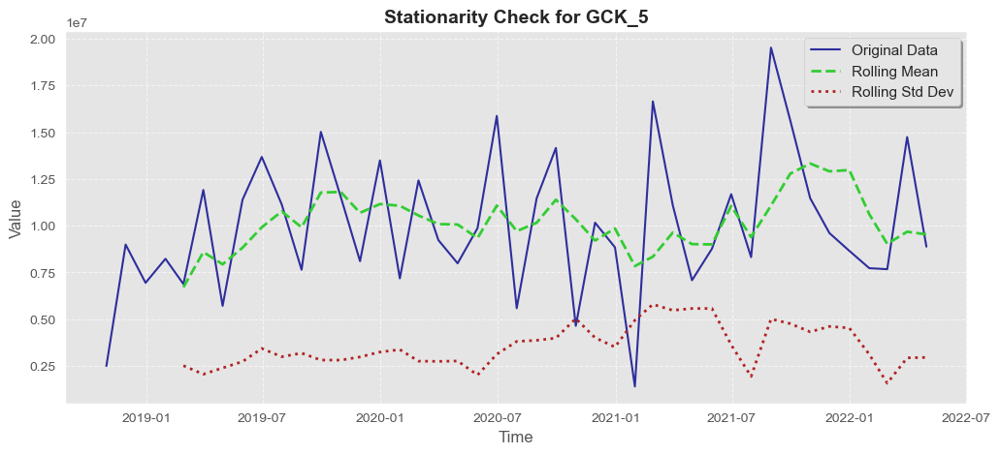


Results of Augmented Dickey-Fuller Test:
Test Statistic                -7.636228e+00
p-value                        1.949175e-11
#Lags Used                     0.000000e+00
Number of Observations Used    4.200000e+01
Critical Value (1%)           -3.596636e+00
Critical Value (5%)           -2.933297e+00
Critical Value (10%)          -2.604991e+00
dtype: float64


Test Statistic                -7.636228e+00
p-value                        1.949175e-11
#Lags Used                     0.000000e+00
Number of Observations Used    4.200000e+01
Critical Value (1%)           -3.596636e+00
Critical Value (5%)           -2.933297e+00
Critical Value (10%)          -2.604991e+00
dtype: float64

In [364]:
stationarity_verification (df, 'GCK_5')

#Since p-value is less than a significance level of 1%, we reject the null hypotheses, therefore, the data is stationarity 
#Therefore, product 5 does not have seasonality 

#Both rolling mean and rolling std are approximately constant over time, which confirms the stationarity hypothesis

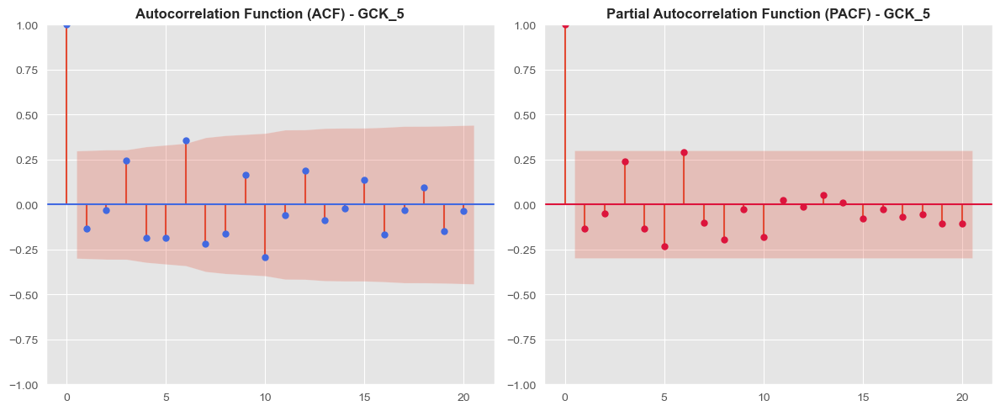

In [365]:

acf_pacf(df, 'GCK_5')

# # According to the graphs there is no total autocorrelation for product 5 as well as partial
#(except 1 lag value for both (6))

<a class="anchor" id="GCK_6">
    
### GCK_6
    
</a>


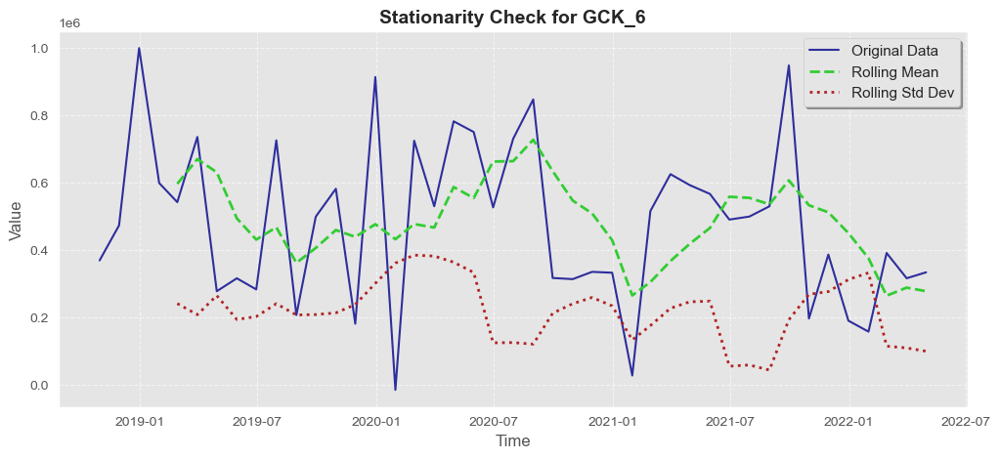


Results of Augmented Dickey-Fuller Test:
Test Statistic                 -3.477762
p-value                         0.008577
#Lags Used                      1.000000
Number of Observations Used    41.000000
Critical Value (1%)            -3.600983
Critical Value (5%)            -2.935135
Critical Value (10%)           -2.605963
dtype: float64


Test Statistic                 -3.477762
p-value                         0.008577
#Lags Used                      1.000000
Number of Observations Used    41.000000
Critical Value (1%)            -3.600983
Critical Value (5%)            -2.935135
Critical Value (10%)           -2.605963
dtype: float64

In [366]:

stationarity_verification (df, 'GCK_6')

#Since p-value is less than a significance level of 1%, we reject the null hypotheses, therefore, the data is stationarity 
#Therefore, product 6 does not have seasonality 

#Both rolling mean and rolling std are not constant over time

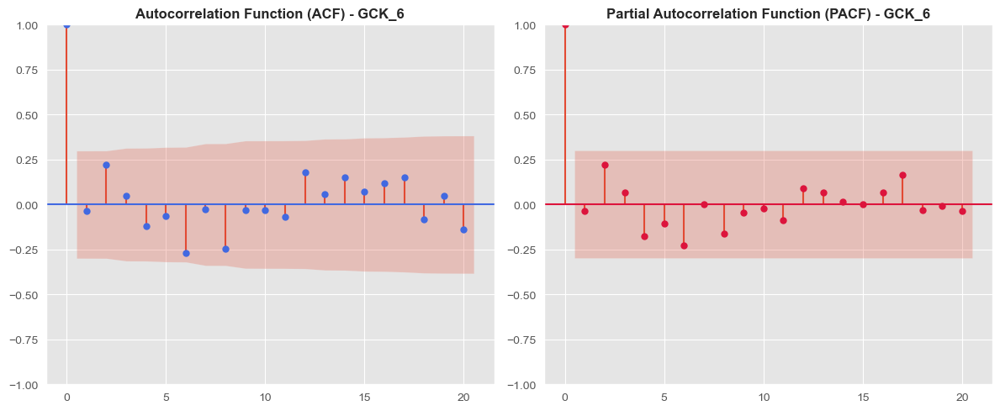

In [367]:

acf_pacf(df, 'GCK_6')

# According to the graphs there is no total autocorrelation for product 6 as well as partial
#(except only one lag values (17))

<a class="anchor" id="GCK_8">
    
### GCK_8
    
</a>


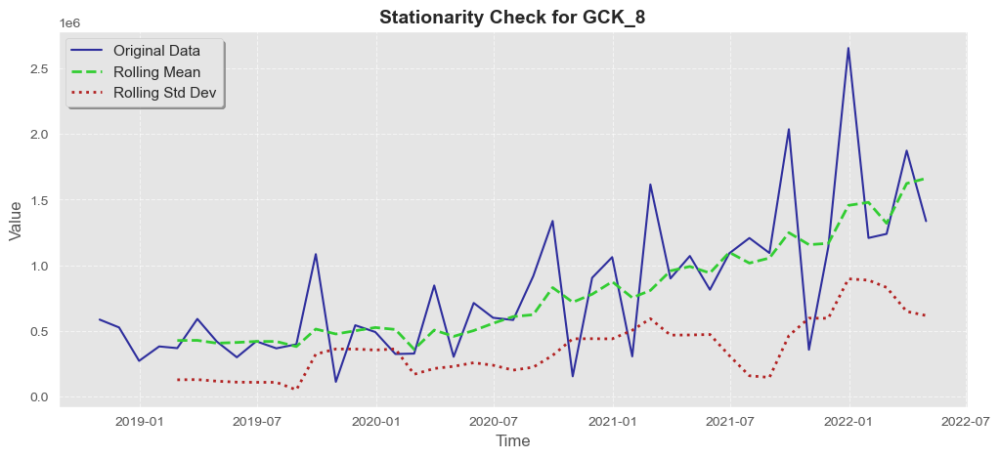


Results of Augmented Dickey-Fuller Test:
Test Statistic                  2.340859
p-value                         0.998980
#Lags Used                      6.000000
Number of Observations Used    36.000000
Critical Value (1%)            -3.626652
Critical Value (5%)            -2.945951
Critical Value (10%)           -2.611671
dtype: float64


Test Statistic                  2.340859
p-value                         0.998980
#Lags Used                      6.000000
Number of Observations Used    36.000000
Critical Value (1%)            -3.626652
Critical Value (5%)            -2.945951
Critical Value (10%)           -2.611671
dtype: float64

In [368]:

stationarity_verification (df,'GCK_8')

# Since p-value is clearly higher than a significance level of 1%, we do not reject the null hypotheses, 
#therefore, the data is not stationary.
# The product 8 seems to have seasonality and trend patterns

# Both rolling mean and rolling std are increasing over time

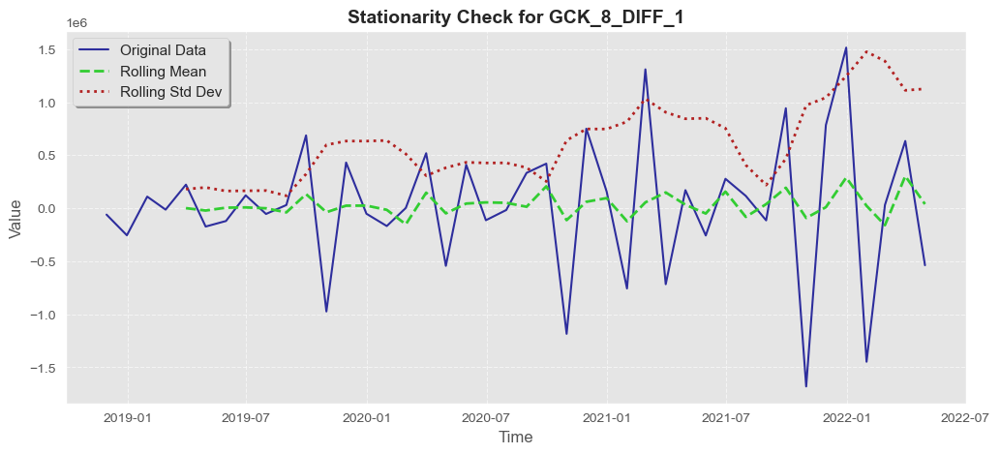


Results of Augmented Dickey-Fuller Test:
Test Statistic                 -4.873763
p-value                         0.000039
#Lags Used                      5.000000
Number of Observations Used    36.000000
Critical Value (1%)            -3.626652
Critical Value (5%)            -2.945951
Critical Value (10%)           -2.611671
dtype: float64


Test Statistic                 -4.873763
p-value                         0.000039
#Lags Used                      5.000000
Number of Observations Used    36.000000
Critical Value (1%)            -3.626652
Critical Value (5%)            -2.945951
Critical Value (10%)           -2.611671
dtype: float64

In [369]:

df_temp = df.copy()
df_temp['GCK_8_DIFF_1'] = df_temp['GCK_8'].diff() 
df_temp['GCK_8_DIFF_1']=df_temp['GCK_8_DIFF_1'].dropna()
GCK_8_DIFF_1 = df_temp['GCK_8_DIFF_1'].dropna()
GCK_8_DIFF_1 = pd.DataFrame(GCK_8_DIFF_1)
stationarity_verification(GCK_8_DIFF_1,'GCK_8_DIFF_1') #Considering the p-value we obtained (<0.05), there is
#statistical evidence suggesting that the series is stationary

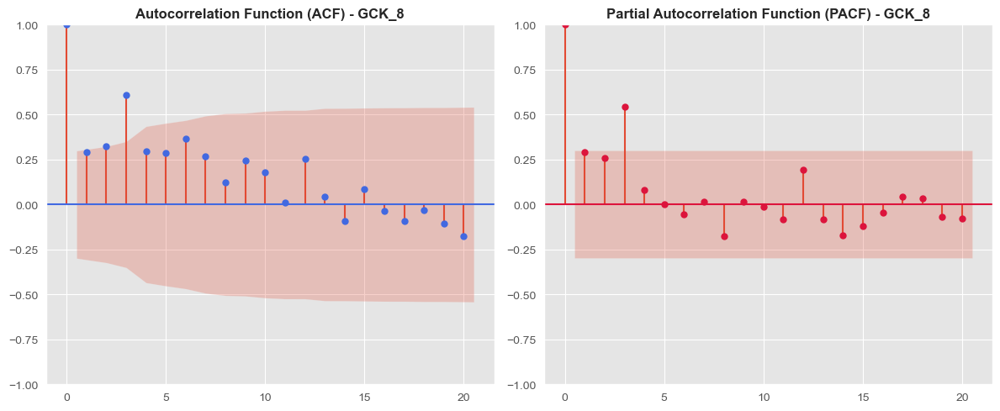

In [370]:

acf_pacf(df, 'GCK_8')

# According to the graphs there is total and partial autocorrection for produtct 8, so we can use lag 3 to predict
#and seem to have seasonality

<a class="anchor" id="9">
    
#### GCK_9
    
</a>


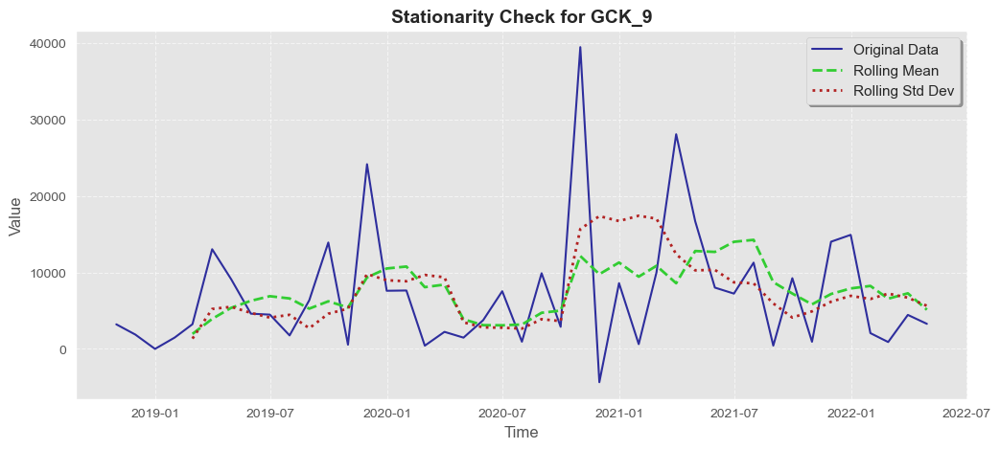


Results of Augmented Dickey-Fuller Test:
Test Statistic                -7.013494e+00
p-value                        6.825988e-10
#Lags Used                     0.000000e+00
Number of Observations Used    4.200000e+01
Critical Value (1%)           -3.596636e+00
Critical Value (5%)           -2.933297e+00
Critical Value (10%)          -2.604991e+00
dtype: float64


Test Statistic                -7.013494e+00
p-value                        6.825988e-10
#Lags Used                     0.000000e+00
Number of Observations Used    4.200000e+01
Critical Value (1%)           -3.596636e+00
Critical Value (5%)           -2.933297e+00
Critical Value (10%)          -2.604991e+00
dtype: float64

In [371]:
#Verifying stationarity for product 9

stationarity_verification (df,'GCK_9')

#Since p-value is less than a significance level of 1%, we reject the null hypotheses, therefore, the data is stationarity 
#Therefore, product 9 does not have seasonality 

#Both rolling mean and rolling std are not constant over time

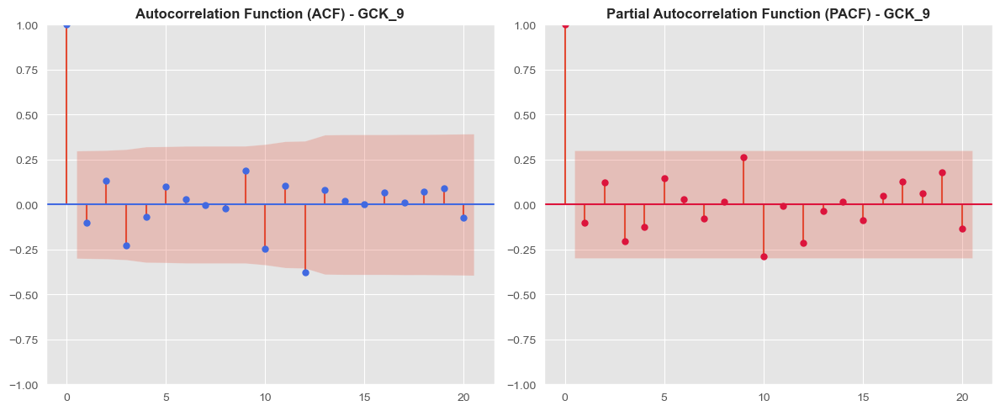

In [372]:

acf_pacf(df, 'GCK_9')

# According to the graphs there is no total autocorrelation for product 9 as well as partial
#(except 5 lag values (9,10,12,19,20) for PACF and only one lag for ACF (12))v

<a class="anchor" id="GCK_11">
    
#### GCK_11
    
</a>


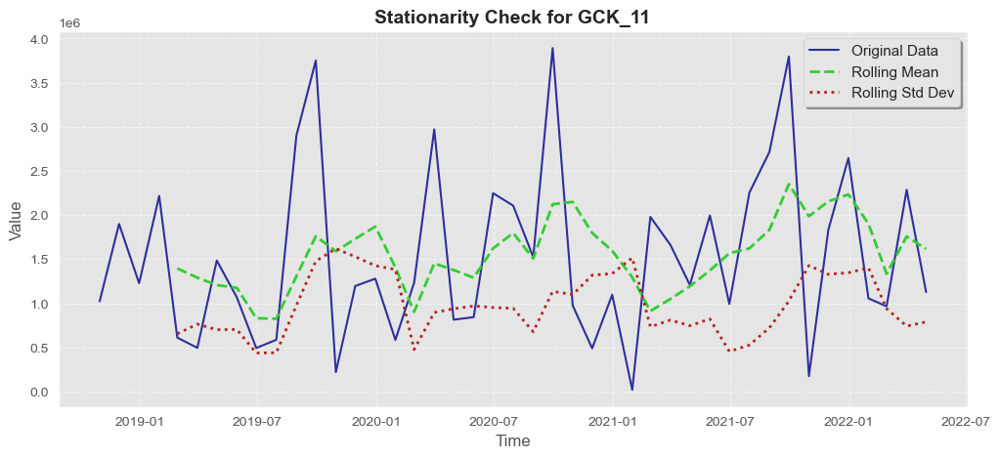


Results of Augmented Dickey-Fuller Test:
Test Statistic                 -5.577923
p-value                         0.000001
#Lags Used                      1.000000
Number of Observations Used    41.000000
Critical Value (1%)            -3.600983
Critical Value (5%)            -2.935135
Critical Value (10%)           -2.605963
dtype: float64


Test Statistic                 -5.577923
p-value                         0.000001
#Lags Used                      1.000000
Number of Observations Used    41.000000
Critical Value (1%)            -3.600983
Critical Value (5%)            -2.935135
Critical Value (10%)           -2.605963
dtype: float64

In [373]:

stationarity_verification (df,'GCK_11')

#Since p-value is less than a significance level of 1%, we reject the null hypotheses, therefore, the data is stationarity 
#Therefore, product 11 does not have seasonality 

#Both rolling mean and rolling std are not constant over time

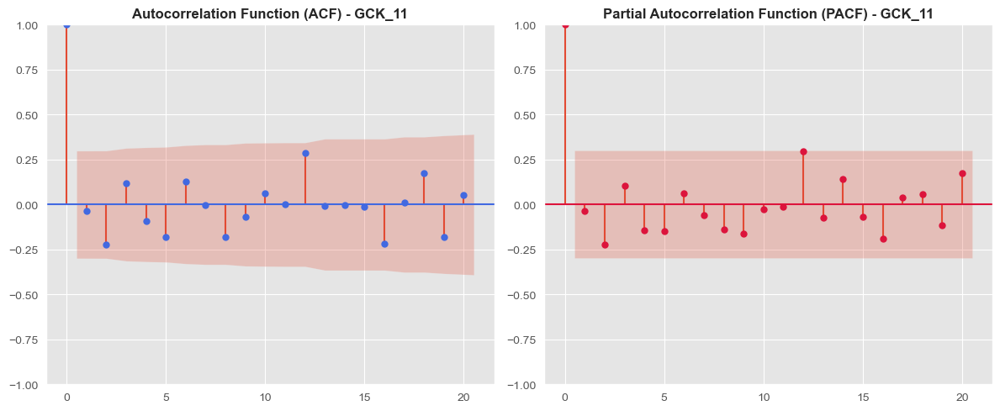

In [374]:

acf_pacf(df, 'GCK_11')

# According to the graphs there is no autocorrection for product 11, so we cannot use lag variables to predict?

<a class="anchor" id="GCK_12">
    
#### GCK_12
    
</a>


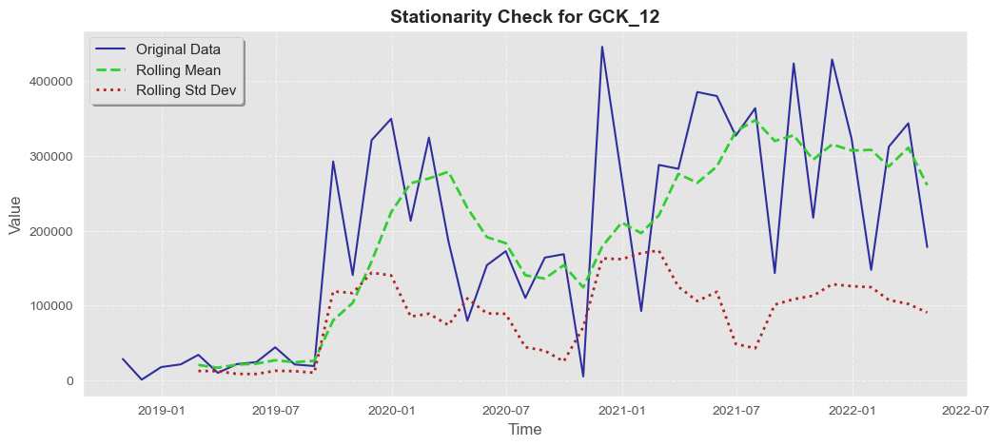


Results of Augmented Dickey-Fuller Test:
Test Statistic                 -3.869337
p-value                         0.002272
#Lags Used                      0.000000
Number of Observations Used    42.000000
Critical Value (1%)            -3.596636
Critical Value (5%)            -2.933297
Critical Value (10%)           -2.604991
dtype: float64


Test Statistic                 -3.869337
p-value                         0.002272
#Lags Used                      0.000000
Number of Observations Used    42.000000
Critical Value (1%)            -3.596636
Critical Value (5%)            -2.933297
Critical Value (10%)           -2.604991
dtype: float64

In [375]:

stationarity_verification (df,'GCK_12')

#Since p-value is less than a significance level of 1%, we reject the null hypotheses, therefore, the data is stationarity 

# The product 12 seems to have seasonality and trend patterns

# Both rolling mean and rolling std are increasing over time

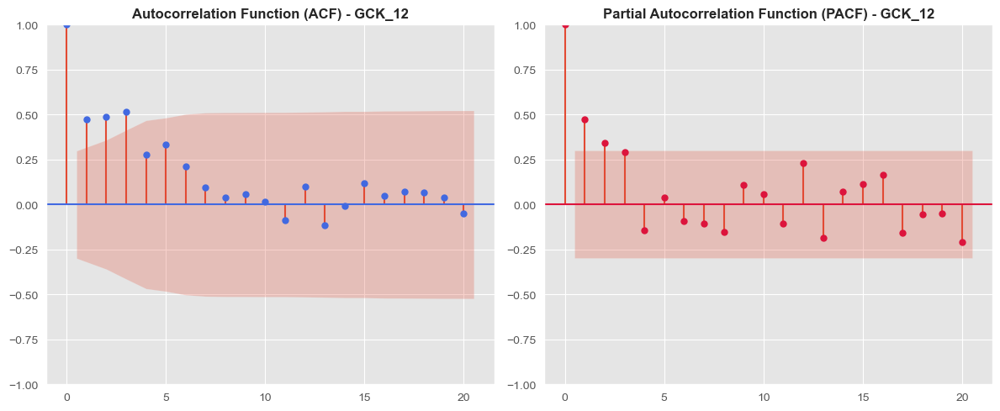

In [376]:

acf_pacf(df, 'GCK_12')

# According to the graphs there is a signficant pattern for product 12 indicantion the possible use of an ARMA(3,3)

<a class="anchor" id="GCK_13">
    
#### GCK_13
    
</a>


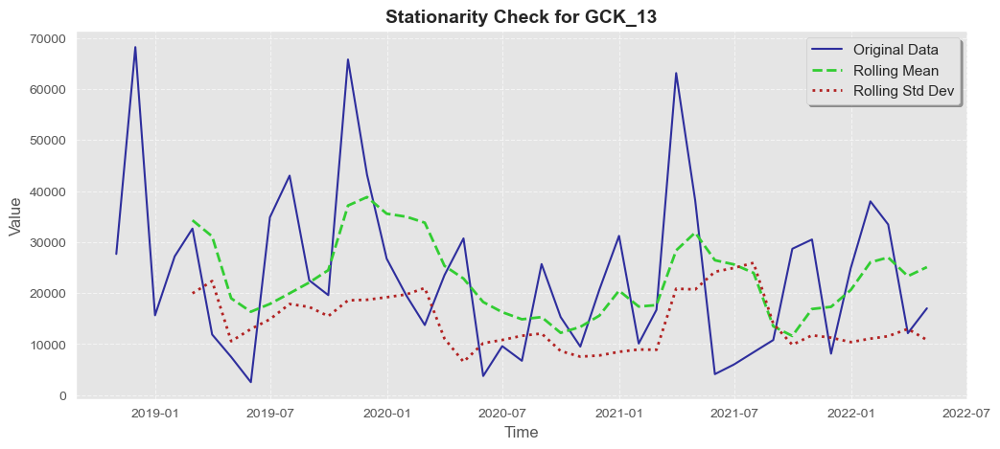


Results of Augmented Dickey-Fuller Test:
Test Statistic                 -3.254199
p-value                         0.017054
#Lags Used                      2.000000
Number of Observations Used    40.000000
Critical Value (1%)            -3.605565
Critical Value (5%)            -2.937069
Critical Value (10%)           -2.606986
dtype: float64


Test Statistic                 -3.254199
p-value                         0.017054
#Lags Used                      2.000000
Number of Observations Used    40.000000
Critical Value (1%)            -3.605565
Critical Value (5%)            -2.937069
Critical Value (10%)           -2.606986
dtype: float64

In [377]:

stationarity_verification (df,'GCK_13')

# Since p-value is higher than a significance level of 1%, we do not reject the null hypotheses, 
#therefore, the data is not stationary.
# The product 13 seems to have seasonality and trend patterns

# Both rolling mean and rolling std are increasing over time

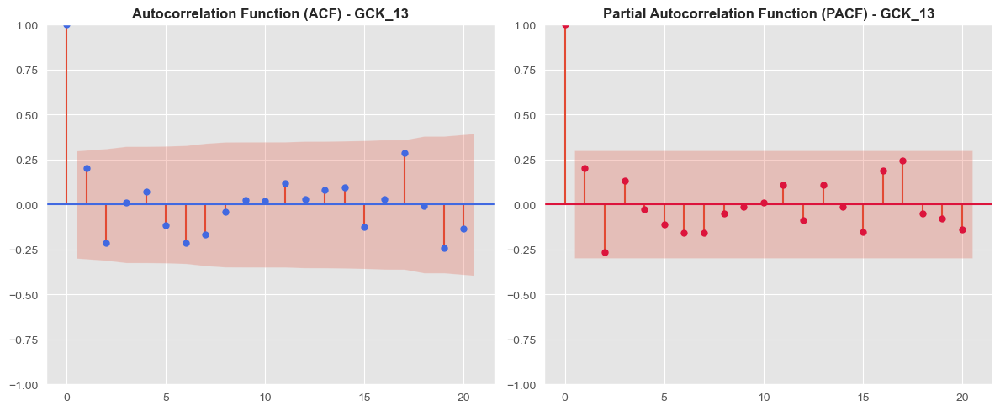

In [378]:

acf_pacf(df_temp, 'GCK_13')

# According to the graphs there is total and partial autocorrection for produtct 13, so we can use lag 3 to predict
#and seem to have seasonality

<a class="anchor" id="subtitle6.1.3">
    
#### GCK_14
    
</a>


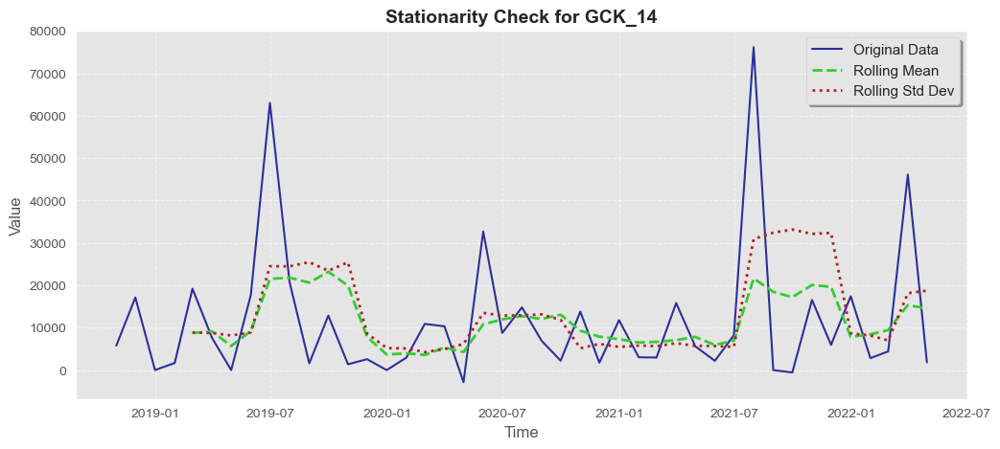


Results of Augmented Dickey-Fuller Test:
Test Statistic                -6.871822e+00
p-value                        1.508840e-09
#Lags Used                     0.000000e+00
Number of Observations Used    4.200000e+01
Critical Value (1%)           -3.596636e+00
Critical Value (5%)           -2.933297e+00
Critical Value (10%)          -2.604991e+00
dtype: float64


Test Statistic                -6.871822e+00
p-value                        1.508840e-09
#Lags Used                     0.000000e+00
Number of Observations Used    4.200000e+01
Critical Value (1%)           -3.596636e+00
Critical Value (5%)           -2.933297e+00
Critical Value (10%)          -2.604991e+00
dtype: float64

In [379]:

stationarity_verification (df,'GCK_14')

#Since p-value is less than a significance level of 1%, we reject the null hypotheses, therefore, the data is stationarity 
#Therefore, product 14 does not have seasonality 

#Both rolling mean and rolling std are constant over time

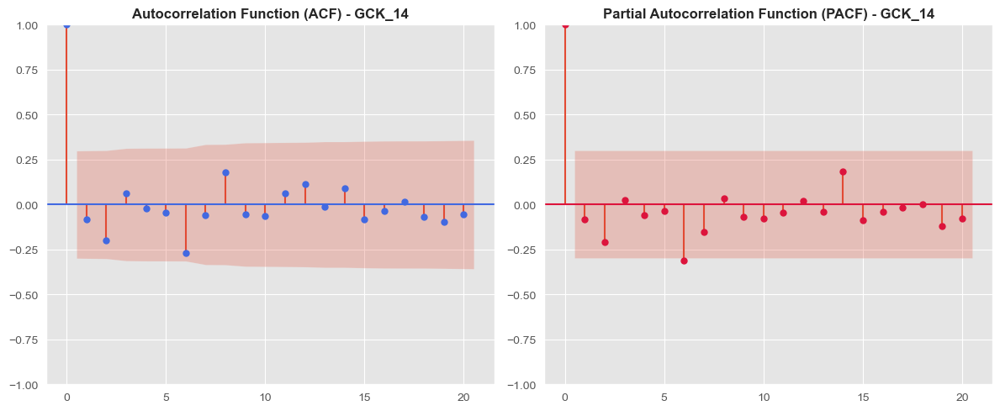

In [380]:

acf_pacf(df, 'GCK_14')

# According to the graphs there is no total autocorrelation for product 14 as well as partial, except only one lag values (6)

<a class="anchor" id="GCK_16">
    
#### GCK_16
    
</a>


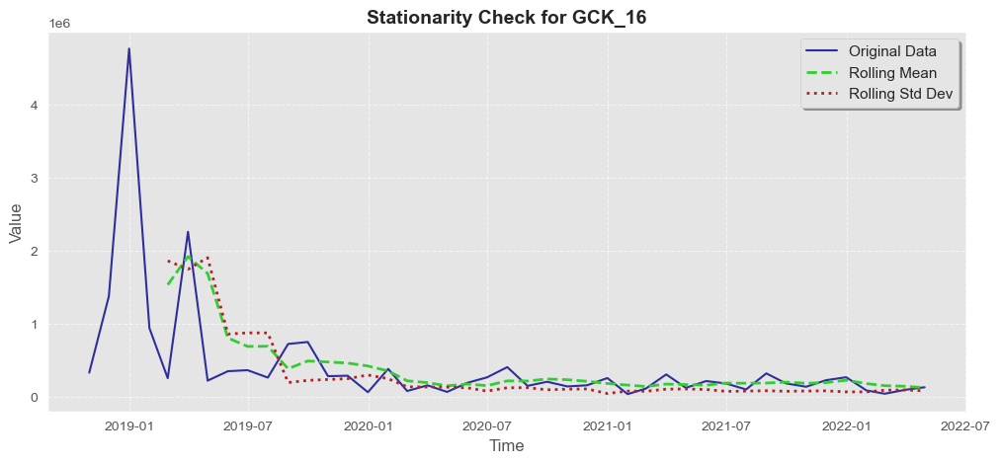


Results of Augmented Dickey-Fuller Test:
Test Statistic                -6.367204e+00
p-value                        2.393585e-08
#Lags Used                     9.000000e+00
Number of Observations Used    3.300000e+01
Critical Value (1%)           -3.646135e+00
Critical Value (5%)           -2.954127e+00
Critical Value (10%)          -2.615968e+00
dtype: float64


Test Statistic                -6.367204e+00
p-value                        2.393585e-08
#Lags Used                     9.000000e+00
Number of Observations Used    3.300000e+01
Critical Value (1%)           -3.646135e+00
Critical Value (5%)           -2.954127e+00
Critical Value (10%)          -2.615968e+00
dtype: float64

In [381]:

stationarity_verification (df,'GCK_16')

#Since p-value is less than a significance level of 5%, we reject the null hypotheses, therefore, the data is stationarity 
#Therefore, product 16 does not have seasonality 

#Both rolling mean and rolling std are aproximadetely constant over time

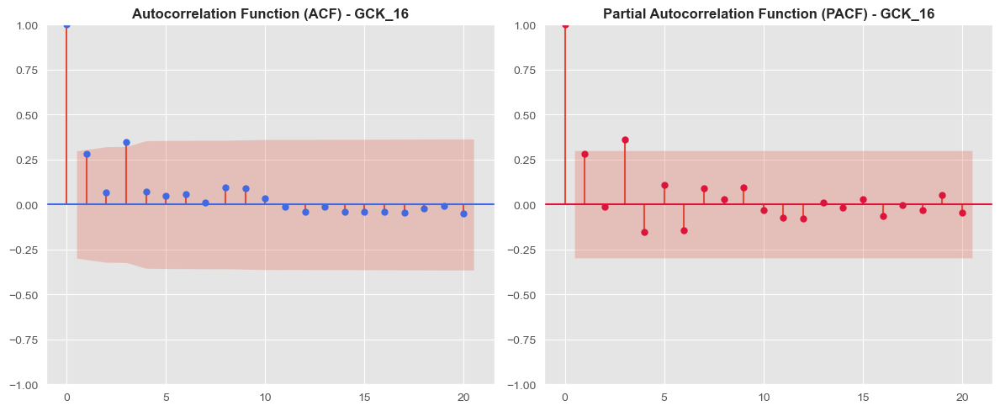

In [382]:

acf_pacf(df, 'GCK_16')

# According to the graphs there is no total autocorrelation for product 16 as well as partial
#(except only 1 lag value for PACF and ACF (3))

<a class="anchor" id="GCK_20">
    
#### GCK_20
    
</a>


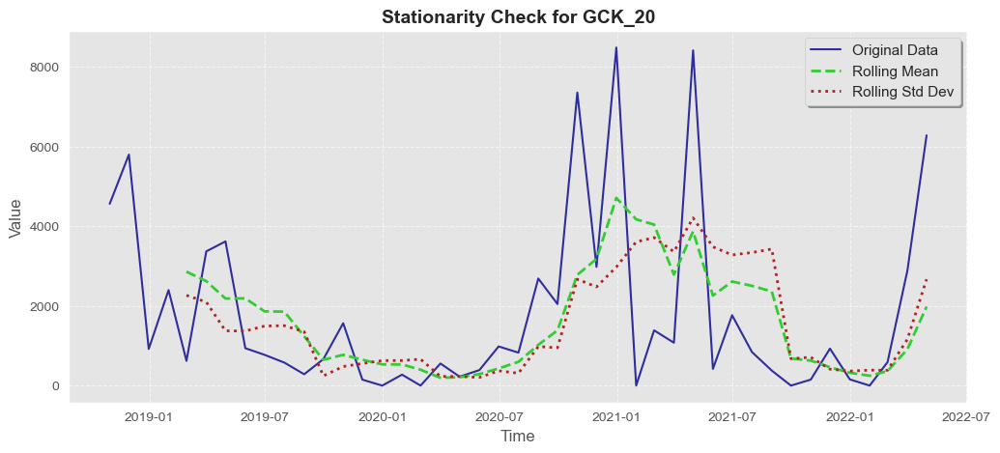


Results of Augmented Dickey-Fuller Test:
Test Statistic                 -3.125179
p-value                         0.024745
#Lags Used                      1.000000
Number of Observations Used    41.000000
Critical Value (1%)            -3.600983
Critical Value (5%)            -2.935135
Critical Value (10%)           -2.605963
dtype: float64


Test Statistic                 -3.125179
p-value                         0.024745
#Lags Used                      1.000000
Number of Observations Used    41.000000
Critical Value (1%)            -3.600983
Critical Value (5%)            -2.935135
Critical Value (10%)           -2.605963
dtype: float64

In [383]:

stationarity_verification (df,'GCK_20')

#Since p-value is less than a significance level of 1%, we reject the null hypotheses, therefore, the data is stationarity 
#Therefore, product 20 does not have seasonality 

#Both rolling mean and rolling std are not constant over time

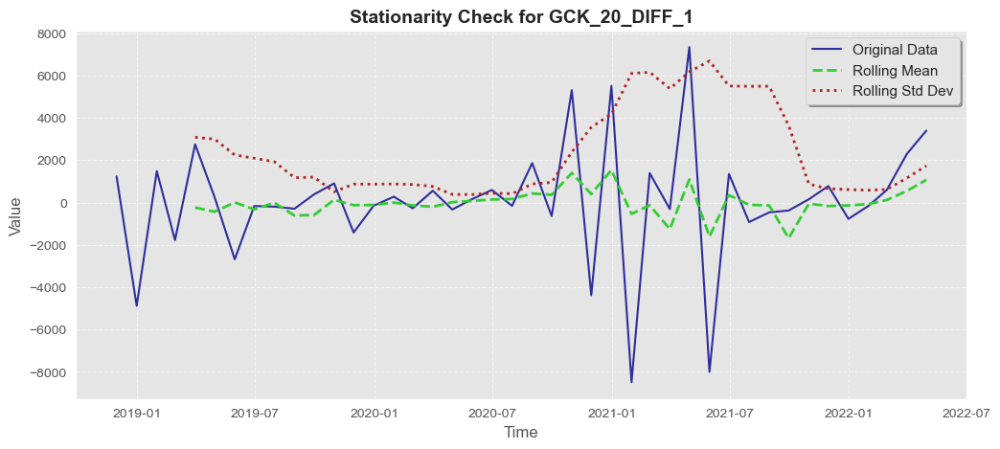


Results of Augmented Dickey-Fuller Test:
Test Statistic                 -5.456595
p-value                         0.000003
#Lags Used                      2.000000
Number of Observations Used    39.000000
Critical Value (1%)            -3.610400
Critical Value (5%)            -2.939109
Critical Value (10%)           -2.608063
dtype: float64


Test Statistic                 -5.456595
p-value                         0.000003
#Lags Used                      2.000000
Number of Observations Used    39.000000
Critical Value (1%)            -3.610400
Critical Value (5%)            -2.939109
Critical Value (10%)           -2.608063
dtype: float64

In [384]:

df_temp=df.copy()
df_temp['GCK_20_DIFF_1'] = df_temp['GCK_20'].diff() 
df_temp['GCK_20_DIFF_1']=df_temp['GCK_20_DIFF_1'].dropna()
GCK_20_DIFF_1 = df_temp['GCK_20_DIFF_1'].dropna()
GCK_20_DIFF_1 = pd.DataFrame(GCK_20_DIFF_1)
stationarity_verification(GCK_20_DIFF_1,'GCK_20_DIFF_1') 
#Considering the p-value we obtained (<0.05), there is
#statistical evidence suggesting that the series is stationary

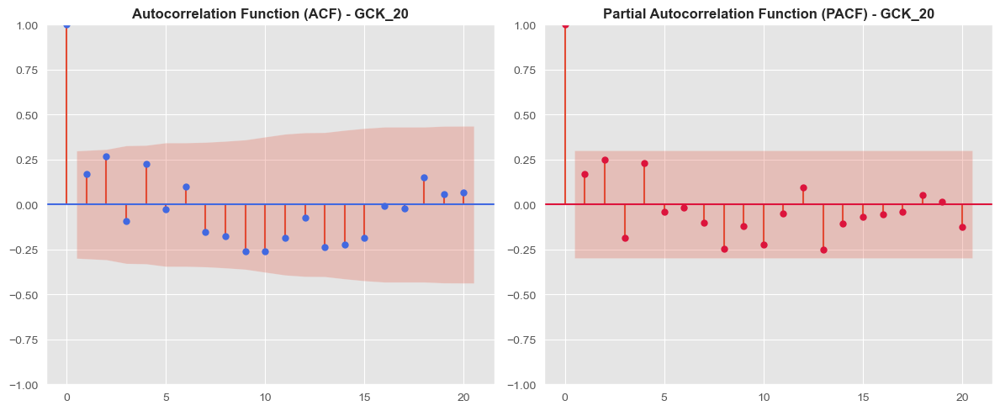

In [385]:

acf_pacf(df_temp, 'GCK_20')

# According to the graphs there is no total autocorrelation for product 20 as well as partial
#(except only 4 lag values for PACF (8,10,13,20))

<a class="anchor" id="GCK_36">
    
#### GCK_36
    
</a>


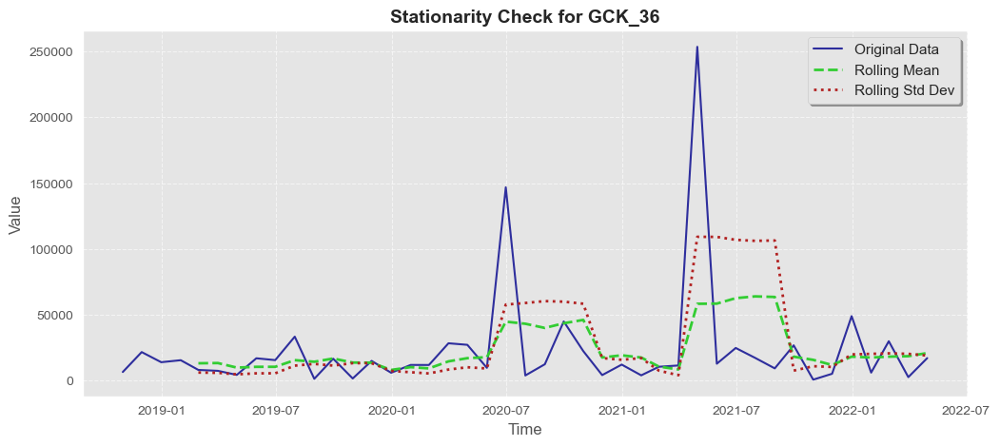


Results of Augmented Dickey-Fuller Test:
Test Statistic                -7.000027e+00
p-value                        7.362686e-10
#Lags Used                     0.000000e+00
Number of Observations Used    4.200000e+01
Critical Value (1%)           -3.596636e+00
Critical Value (5%)           -2.933297e+00
Critical Value (10%)          -2.604991e+00
dtype: float64


Test Statistic                -7.000027e+00
p-value                        7.362686e-10
#Lags Used                     0.000000e+00
Number of Observations Used    4.200000e+01
Critical Value (1%)           -3.596636e+00
Critical Value (5%)           -2.933297e+00
Critical Value (10%)          -2.604991e+00
dtype: float64

In [386]:

stationarity_verification (df,'GCK_36')

#Since p-value is less than a significance level of 5%, we reject the null hypotheses, therefore, the data is stationarity 
#Therefore, product 36 does not have seasonality 

#Both rolling mean and rolling std are not constant over time

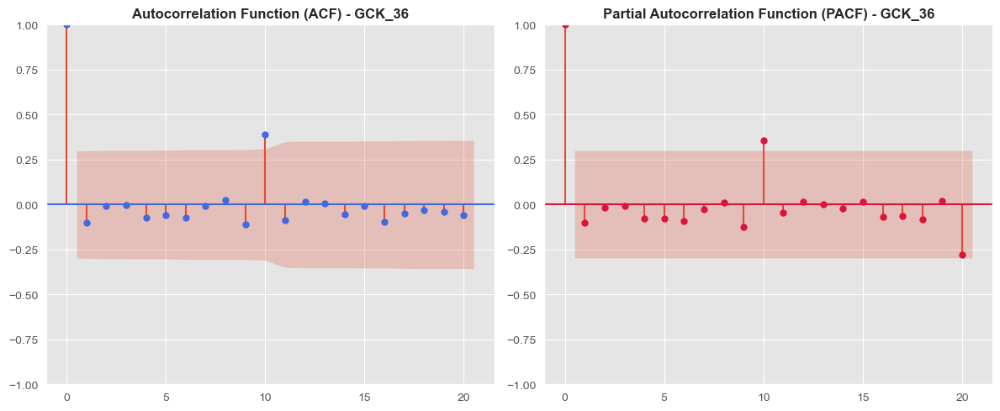

In [387]:

acf_pacf(df, 'GCK_36')

# According to the graphs there is no total autocorrelation for product 20 as well as partial
#(except only 4 lag values for PACF (8,10,13,20))

<a class="anchor" id="subtitle6.2.7">
    
###  STL Decomposition
    
</a>

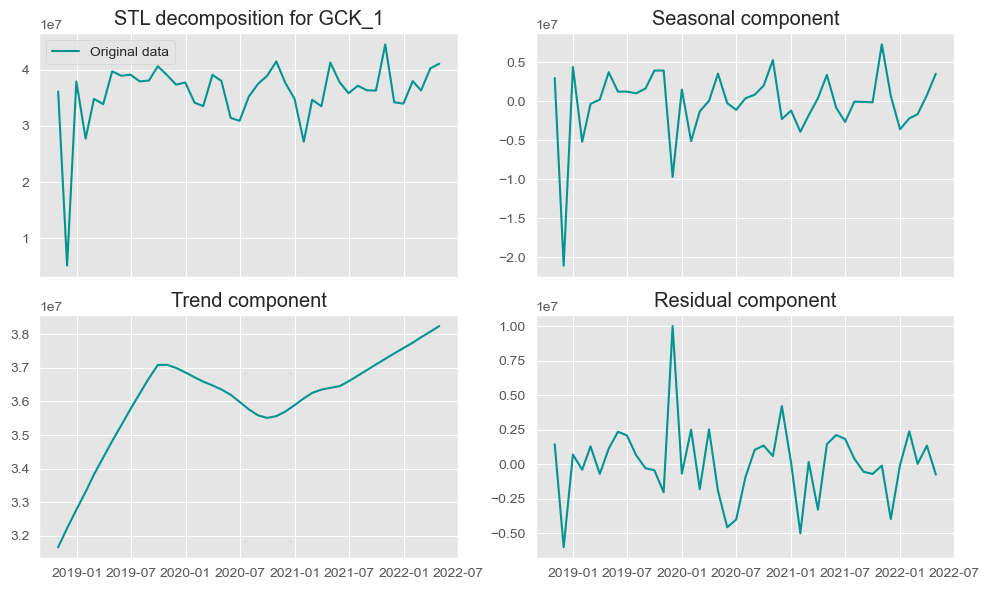

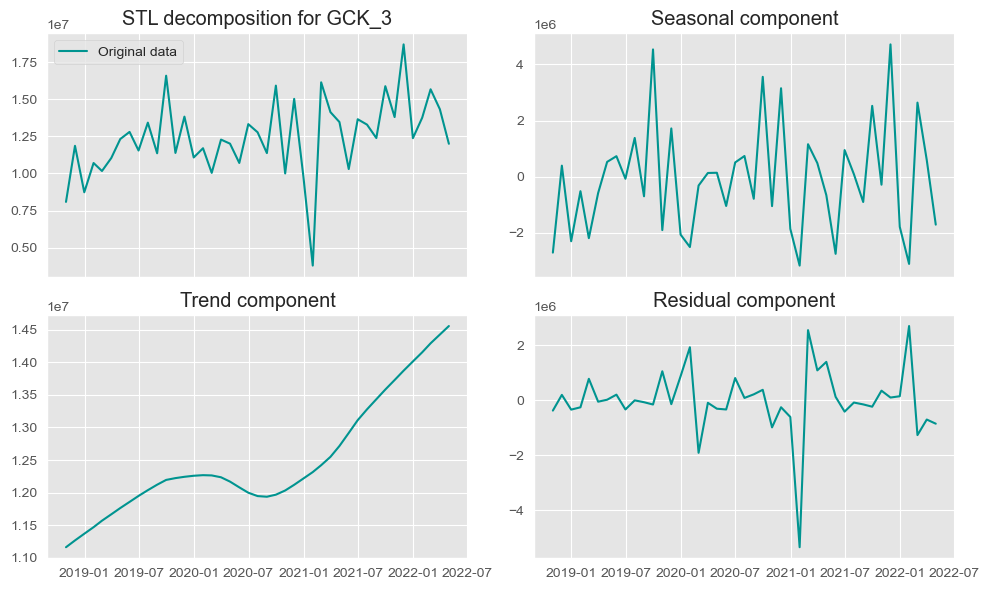

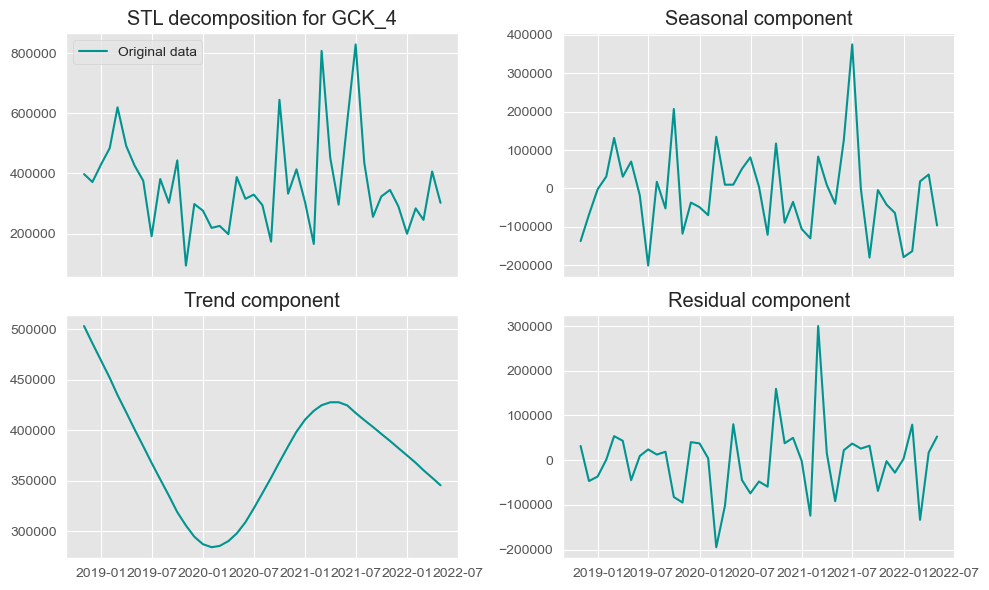

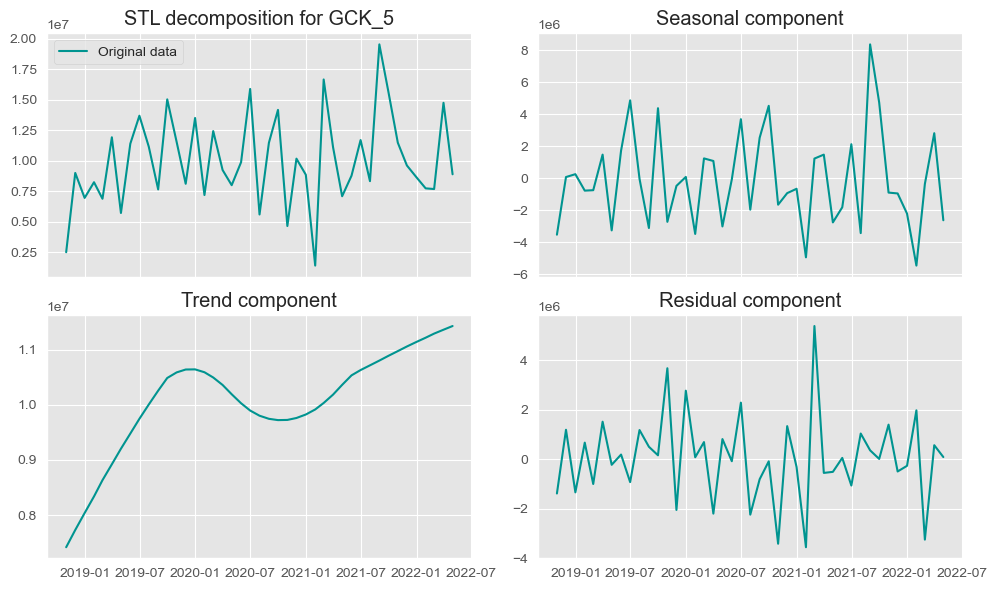

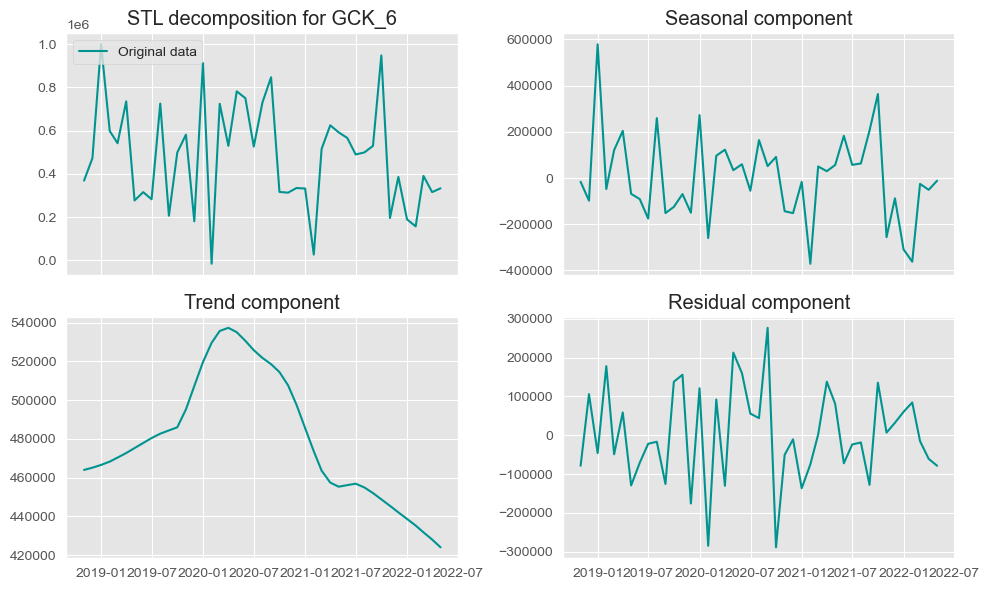

...

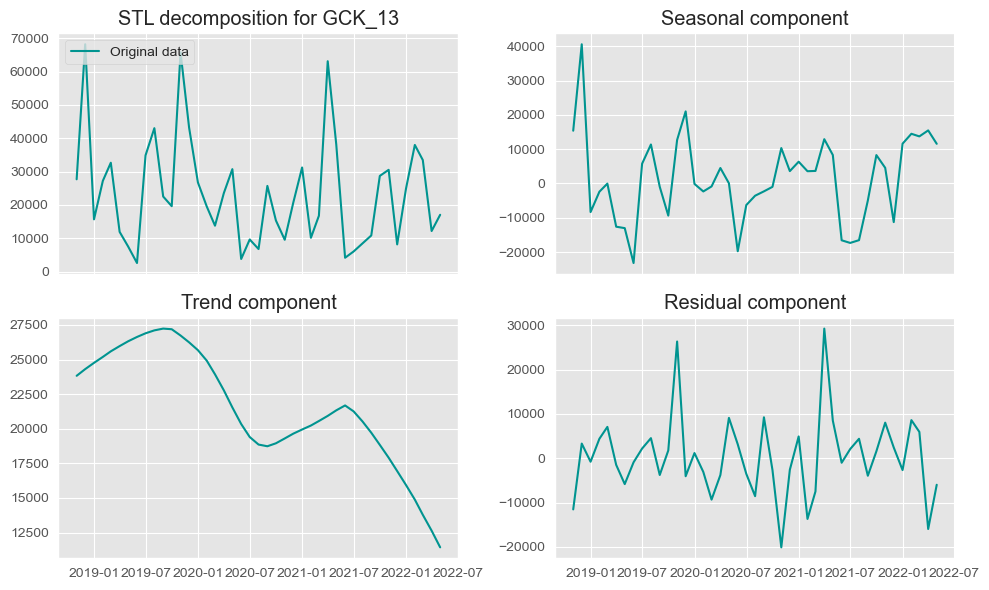

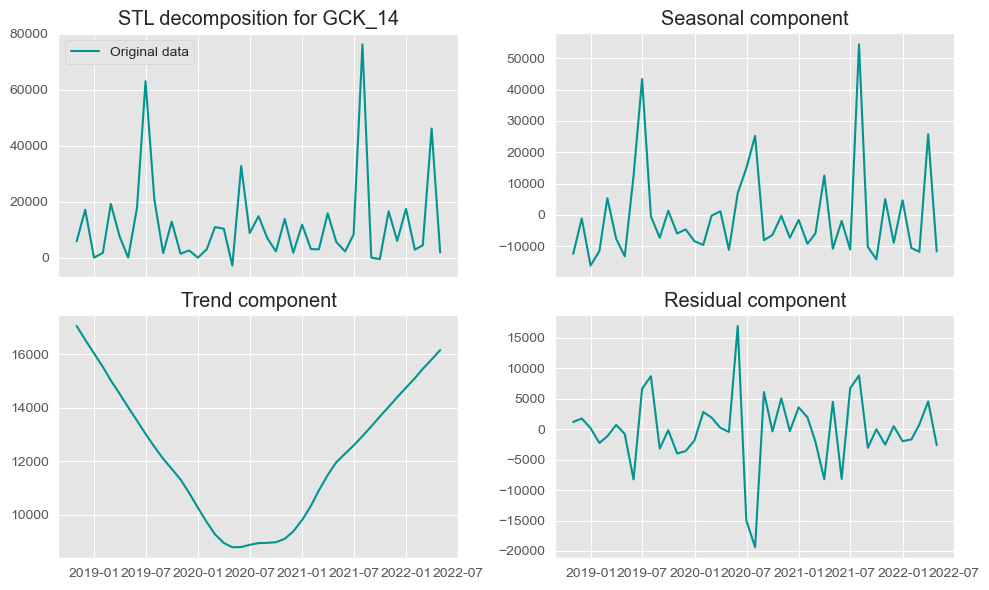

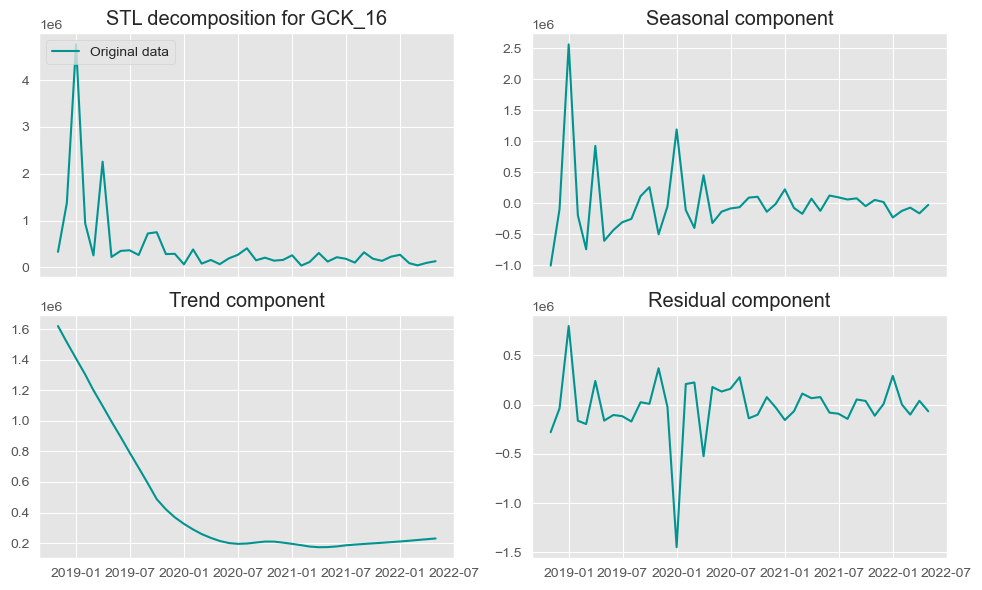

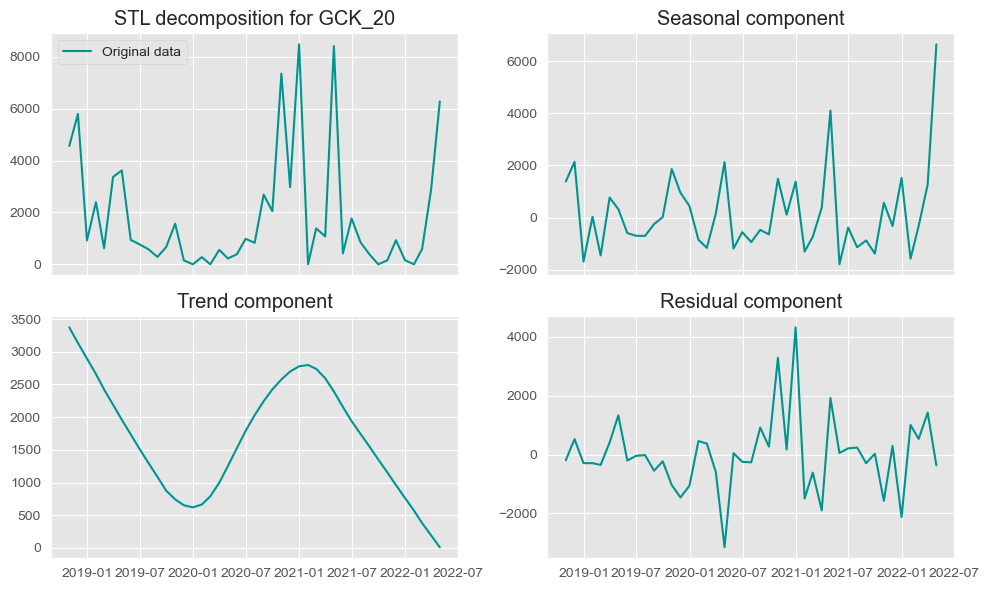

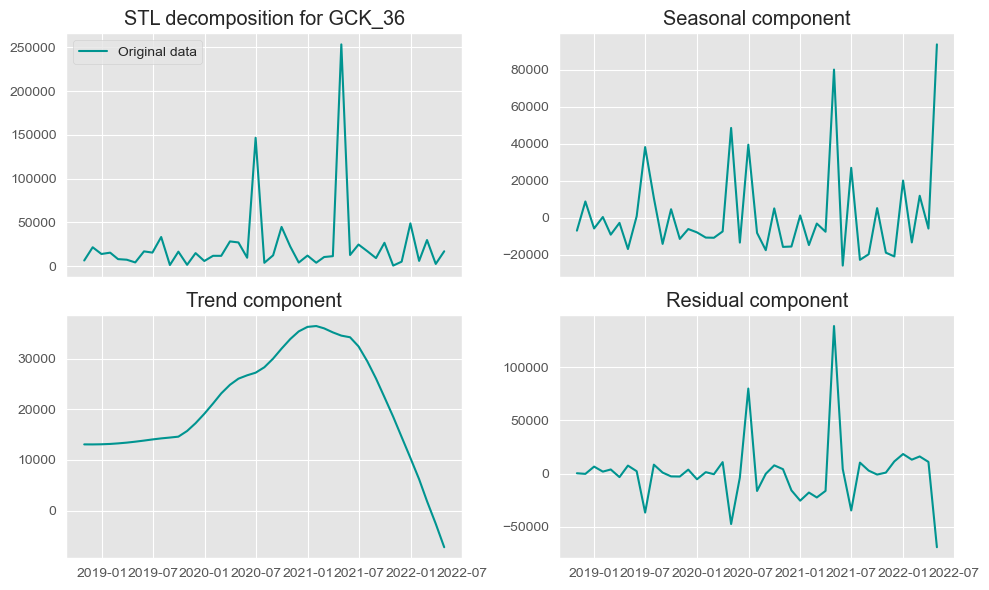

In [388]:
# Plot Trend and Seasonality Plots for each Product Category
for col in df.columns:
    stl_decomposition(df, col)

**Total Sales by Month & Product**

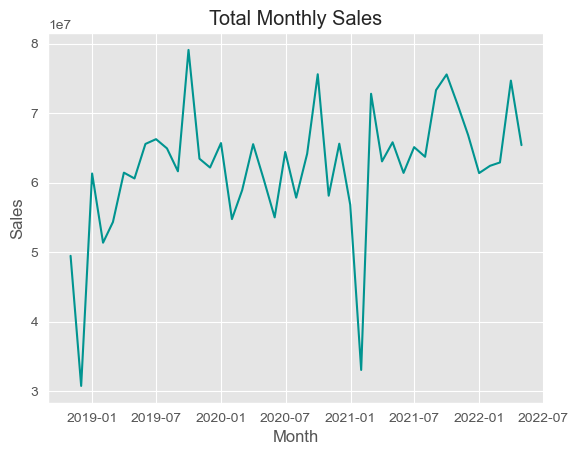

In [389]:
# Calculate total monthly sales
monthly_sales = df.sum(axis=1)

# Create a line chart
plt.plot(monthly_sales.index, monthly_sales,color=main_color)

# Set the plot title and axis labels
plt.title("Total Monthly Sales")
plt.xlabel("Month")
plt.ylabel("Sales")

# Show the plot
plt.show()

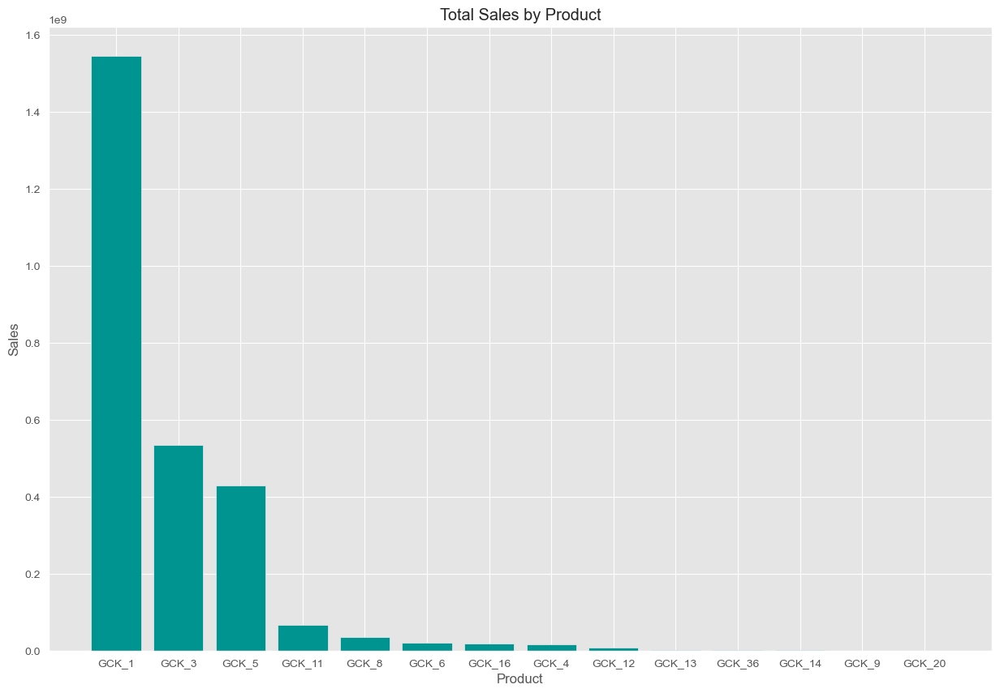

In [390]:
# Calculate total sales by product
total_sales_by_product = df.sum(axis=0).sort_values(ascending=False)

# Create a bar chart
plt.figure(figsize=(15, 10))
plt.bar(total_sales_by_product.index, total_sales_by_product,color=main_color)

# Set the plot title and axis labels
plt.title("Total Sales by Product")
plt.xlabel("Product")
plt.ylabel("Sales")

# Show the plot
plt.show()

Product group 1, 3 and 5 are the top three products with the highest accumulated sales.

In [391]:
# Convert the index to a column of dates
df.reset_index(inplace=True)

df_melted = df.melt(id_vars='date', var_name='Product', value_name='Sales')

# Create a pivot table to get the sales for each product by month
df_pivot = df_melted.pivot(index="date", columns="Product", values="Sales")

In [392]:
df.describe(include='all')

Mapped_GCK,date,GCK_1,GCK_3,GCK_4,GCK_5,GCK_6,GCK_8,GCK_9,GCK_11,GCK_12,GCK_13,GCK_14,GCK_16,GCK_20,GCK_36
count,43,4.300000e+01,4.300000e+01,43.000000,4.300000e+01,43.000000,4.300000e+01,43.000000,4.300000e+01,43.000000,43.000000,43.000000,4.300000e+01,43.000000,43.000000
mean,2020-07-30 18:25:06.976744192,3.591177e+07,1.240566e+07,363423.371163,9.990585e+06,480043.964884,8.109586e+05,7173.174651,1.532589e+06,192546.193488,23468.765349,11484.233953,4.277018e+05,1821.554884,23223.579302
min,2018-10-31 00:00:00,5.140760e+06,3.804320e+06,93226.320000,1.405295e+06,-15202.960000,1.117913e+05,-4358.100000,1.820000e+04,1070.000000,2550.310000,-2851.450000,4.036008e+04,0.000000,674.000000
25%,2019-09-15 00:00:00,3.440896e+07,1.105907e+07,279799.480000,7.703432e+06,316055.490000,3.749379e+05,1626.700000,9.035992e+05,39235.210000,10466.465000,2015.025000,1.375541e+05,330.810000,6244.495000
50%,2020-07-31 00:00:00,3.732390e+07,1.231748e+07,329430.960000,9.232238e+06,499147.730000,5.998319e+05,4488.090000,1.226122e+06,172712.880000,20663.640000,5951.850000,2.245019e+05,842.930000,12377.770000
75%,2021-06-15 00:00:00,3.888867e+07,1.377567e+07,428161.150000,1.180077e+07,611987.120000,1.092310e+06,9583.200000,2.161184e+06,321795.050000,30966.410000,15305.890000,3.283725e+05,2543.020000,21995.050000
max,2022-04-30 00:00:00,4.448301e+07,1.868682e+07,829442.330000,1.952464e+07,999472.690000,2.655037e+06,39510.750000,3.891448e+06,445648.060000,68180.000000,76161.440000,4.762525e+06,8485.600000,253519.040000
std,NaN,5.905117e+06,2.577332e+06,155710.914233,3.731564e+06,242286.217600,5.436111e+05,8231.269282,9.811598e+05,141016.785899,16140.161949,16116.168947,7.824899e+05,2307.900214,42651.283687


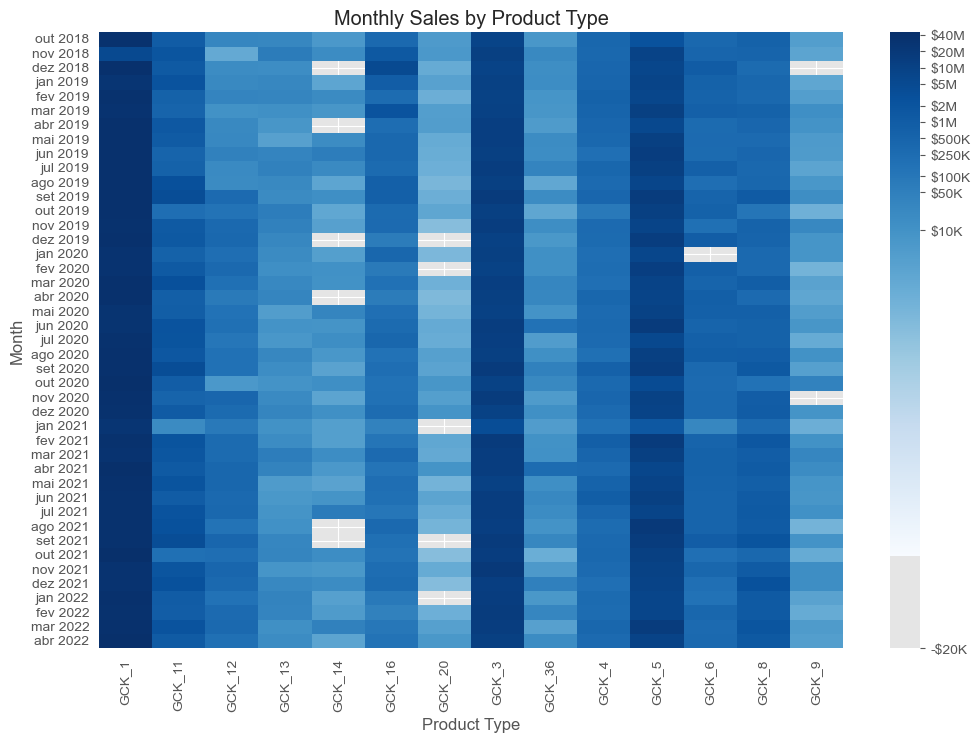

In [393]:
fig, ax = plt.subplots(figsize=(12, 8))
if df_pivot.values.min() < 0:
    vmin = 0.01
else:
    vmin = None

heatmap = sns.heatmap(df_pivot, cmap="Blues", ax=ax, norm=matplotlib.colors.LogNorm(vmin=vmin, vmax=df_pivot.max().max()), fmt=".1f")

# Format the date labels
date_labels = [d.strftime('%b %Y') for d in df_pivot.index]
ax.set_yticklabels(date_labels)

# Set the colorbar ticks
corr = heatmap.collections[0].colorbar
corr.set_ticks([2e-4, 10000, 50000, 100000, 250000, 500000, 1000000, 2000000, 5000000, 10000000, 20000000, 40000000])
corr.set_ticklabels(['-$20K', '$10K', '$50K', '$100K', '$250K', '$500K', '$1M', '$2M', '$5M', '$10M', '$20M', '$40M'])

plt.title("Monthly Sales by Product Type")
plt.xlabel("Product Type")
plt.ylabel("Month")
plt.show()

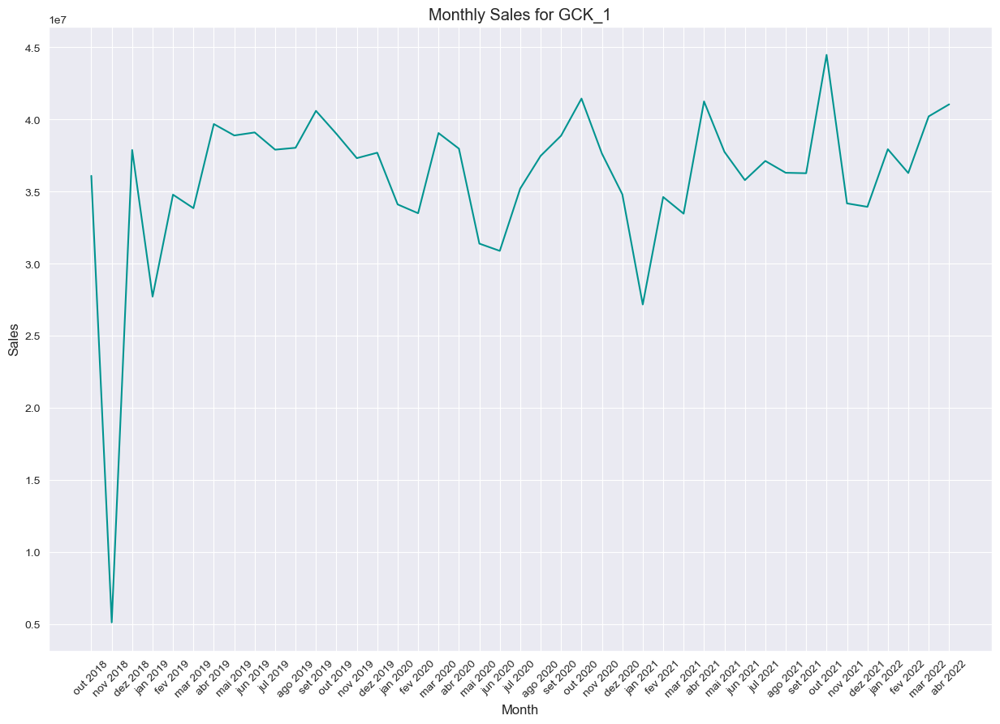

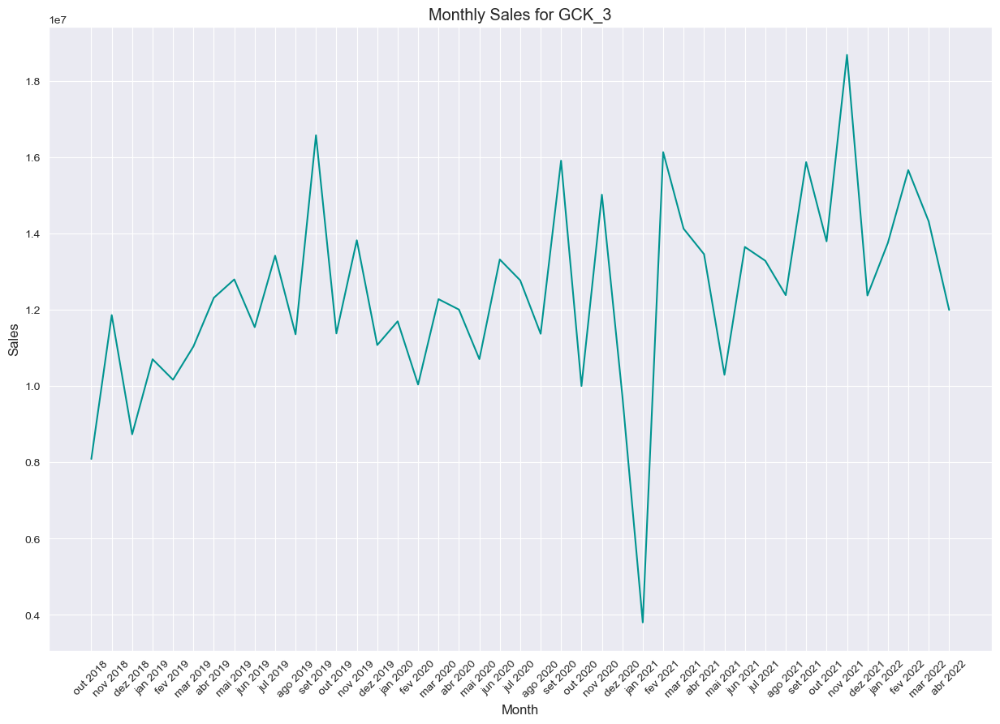

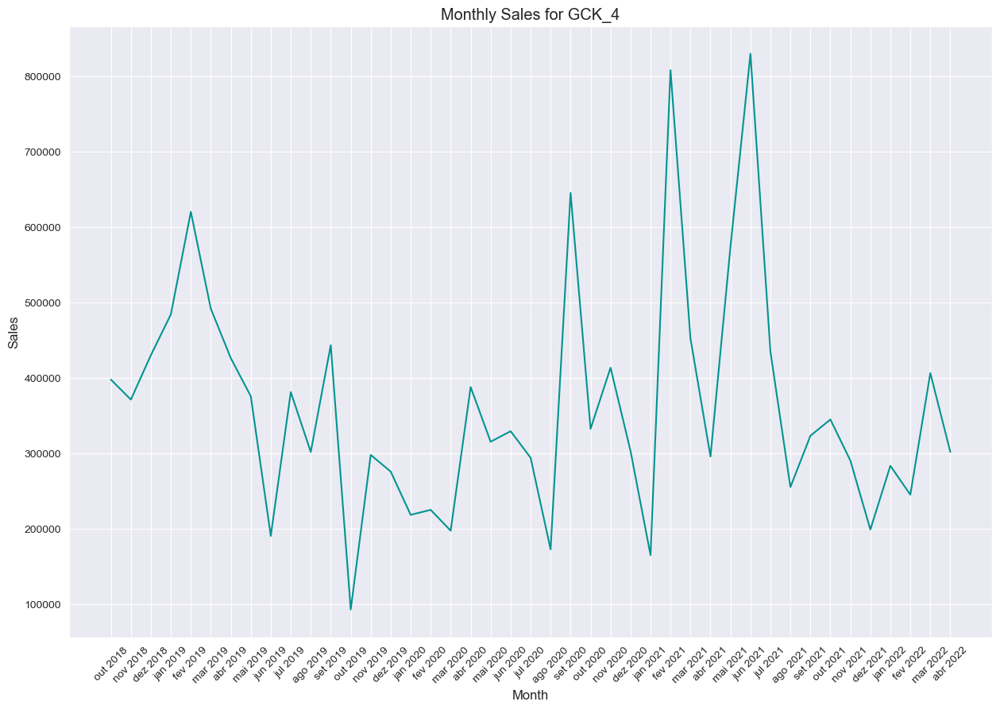

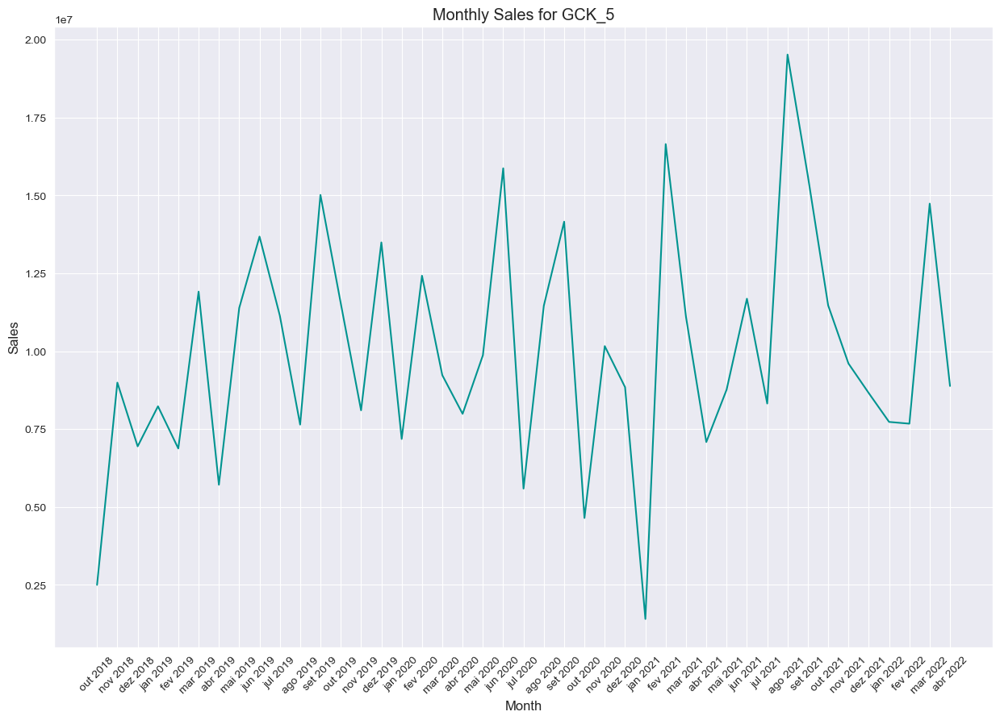

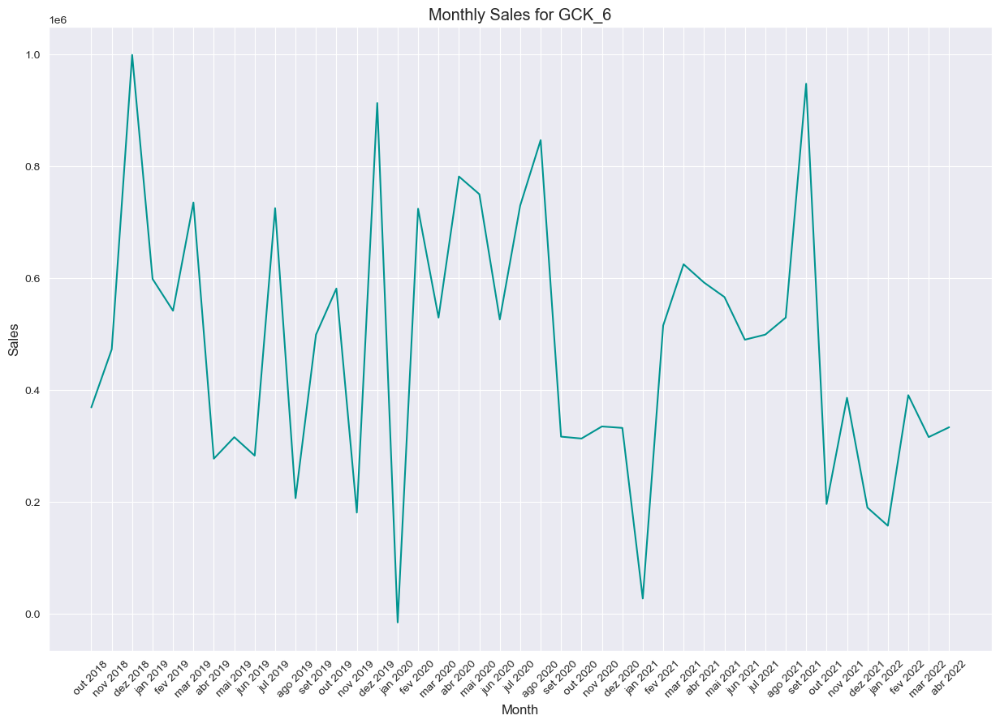

...

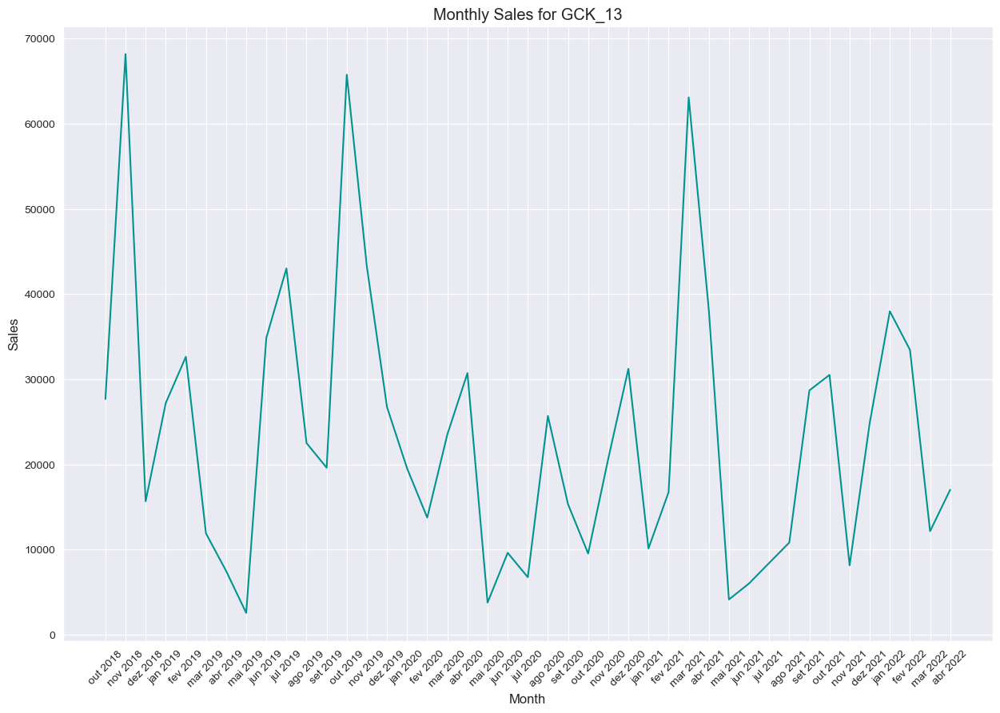

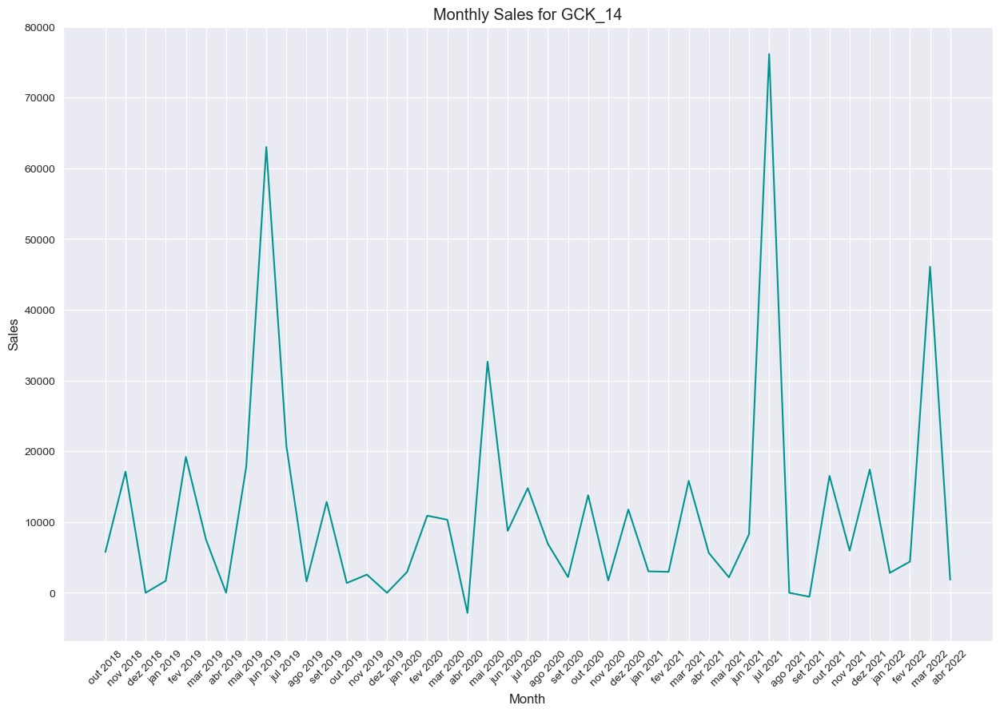

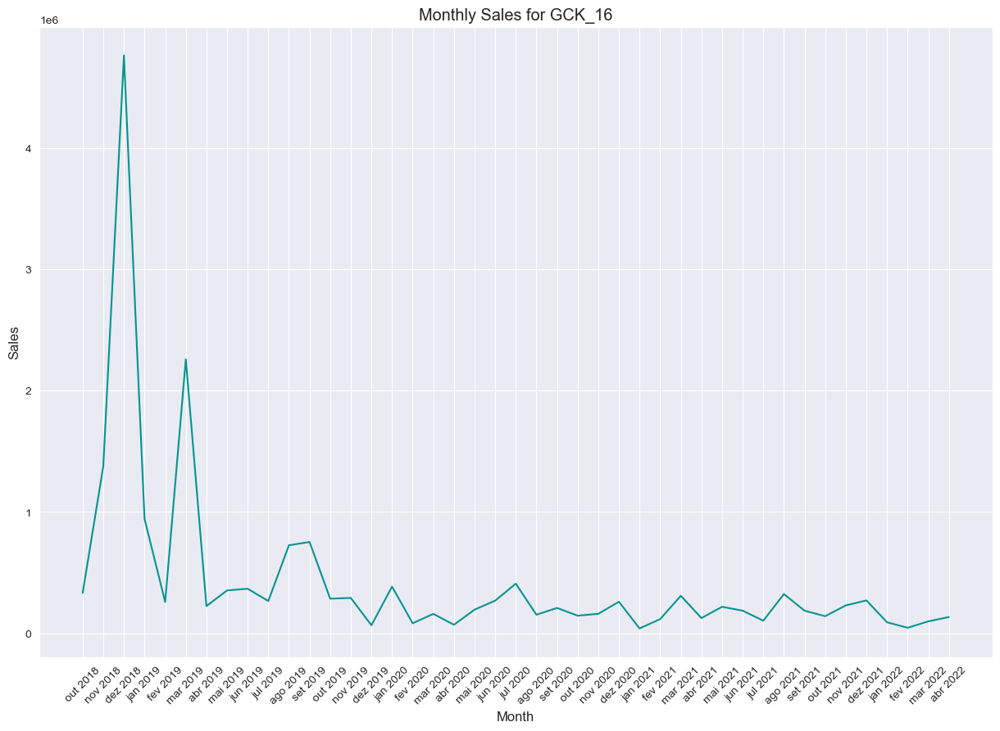

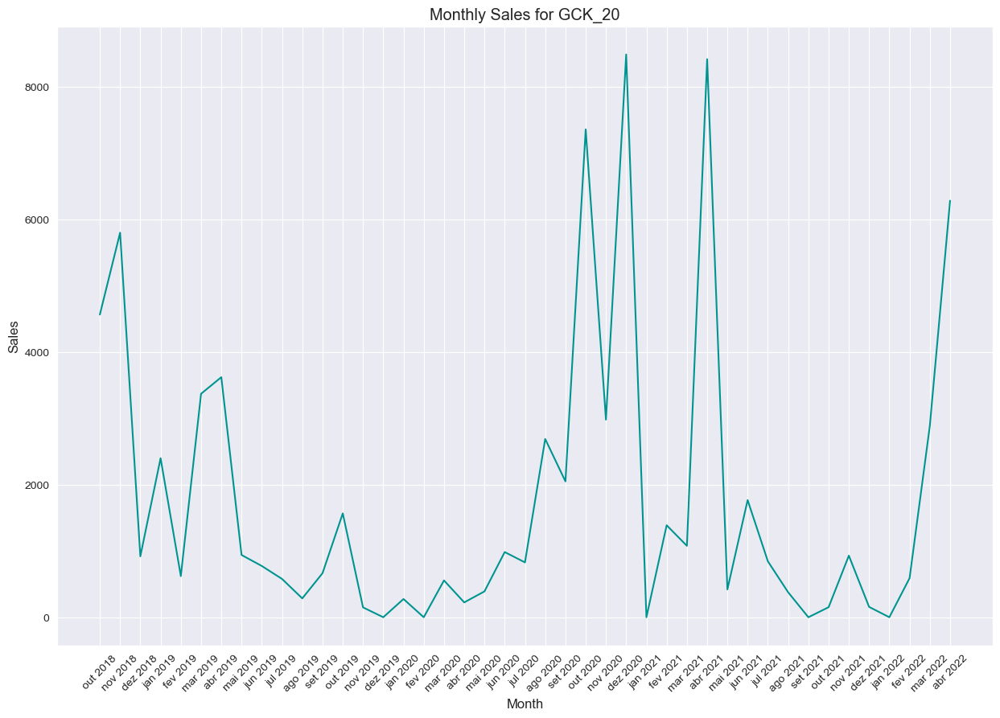

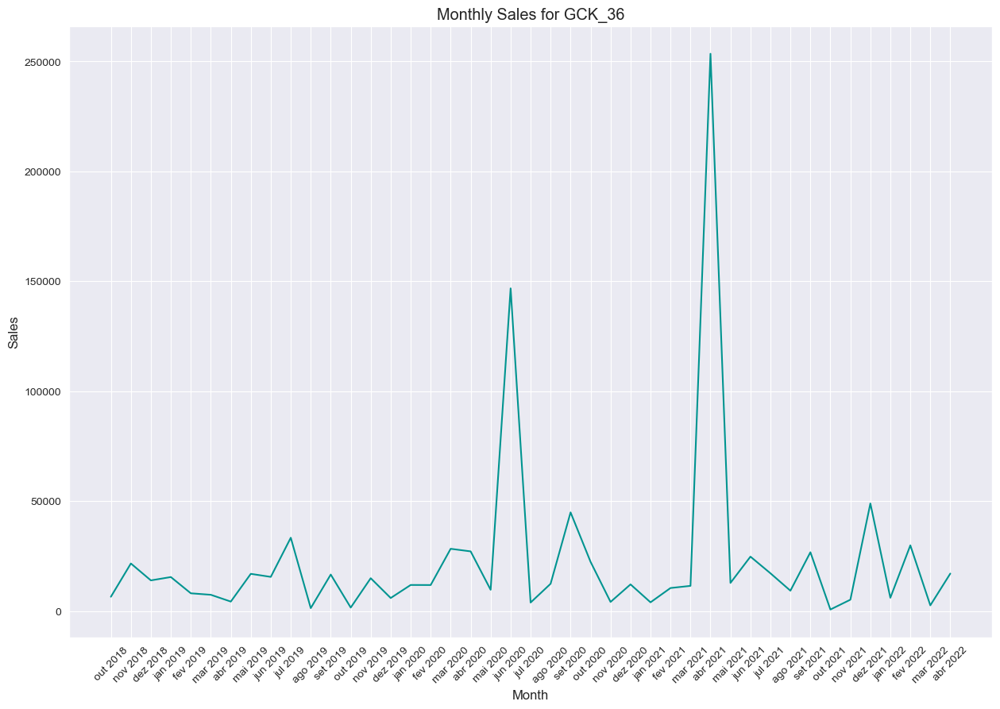

In [ ]:
# Get a list of all unique product types
product_types = df.columns.tolist()[1:]

# Plot each product type once
for product_type in product_types:
    plot_monthly_sales_by_product(df, product_type)

In [125]:
# Set the 'date' column as the index
df.set_index('date', inplace=True)

<hr>
<a class="anchor" id="preprocessing">
    
# Data Preprocessing
    
</a>

<a class="anchor" id="Inconsistencies">
    
##  Fixing Inconsistencies
    
</a>

**Different date ranges**

In [126]:
# Filter the information according to dataset timeline October 2018 - February 2023
# If useful for analysis separete timelines accordingly (Train & Test)
new_index = pd.date_range(start=df.index.min(), end='2023-03-01', freq='M')

**Removing duplicated index**

In [ ]:
columns_to_drop=['Shipments Index Machinery & Electricals_China']
market_df.drop(columns_to_drop,axis=1,inplace=True)

<a class="anchor" id="nans">
    
## Missing Values Treatment
    
</a>

In [ ]:
#Verifying only after 2016-12-31 because it is the minimum date used to get lag variables.
market_df[market_df.index>=pd.to_datetime('2016-12-31')].isna().\
sum()[market_df[market_df.index>=pd.to_datetime('2016-12-31')].isna().sum()>0]

# Columns with more than 1 missing value will be eliminated being that 
# using a predicted value to predict another will result in a higher bias.

# Regarding the ones with only one missing value, it will be filled with the previous one,
# as it should be a reasonable approximation, because these indexes do not vary 
# considerably from month to month


Producer Prices Electrical Equipment_United Kingdom            18
Production Index Electrical Equipment_Switzerland               1
Production Index Machinery & Electricals_Switzerland            1
Production Index Machinery And Equipment N.E.C._Switzerland     1
Shipments Index Machinery & Electricals_Switzerland             1
Shipments Index Machinery & Electricals_United Kingdom         18
Shipments Index Machinery & Electricals_United States           1
dtype: int64

In [ ]:
columns_to_drop=['Producer Prices Electrical Equipment_United Kingdom',
                 'Shipments Index Machinery & Electricals_United Kingdom']
market_df.drop(columns_to_drop,axis=1,inplace=True)

In [ ]:
columns_to_fill = market_df.isna().sum()[market_df.isna().sum()==1].index

In [ ]:
#Replace each NaN with the last existing value.
for column in columns_to_fill:
    index_to_fill=market_df[market_df[column].isna()].index.values[0]
    index_before = market_df[market_df.index < index_to_fill].index[-1]
    market_df.loc[market_df.index==index_to_fill,column]= market_df.loc[index_before,column]

<a class="anchor" id="outliers">
    
## Outliers Treatment
    
</a>

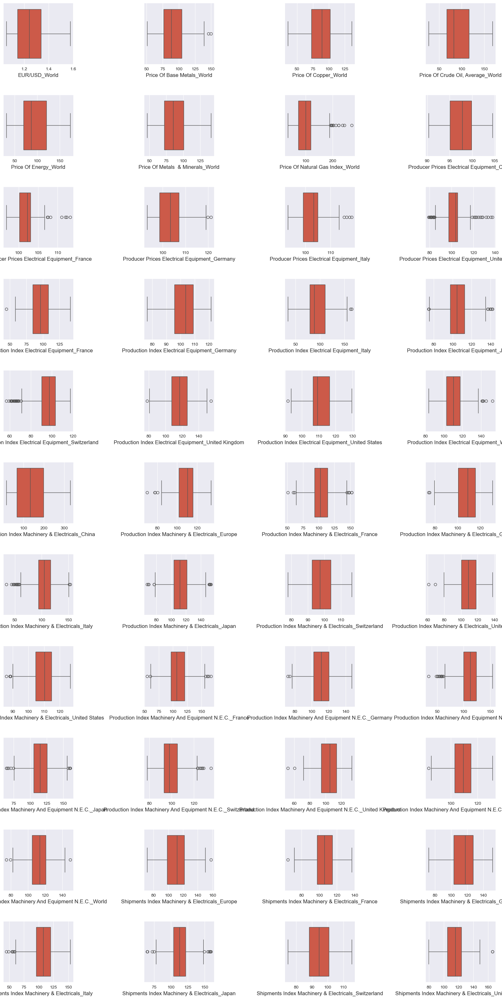

In [ ]:
# Do boxplots on all numeric variables
numerical_market =market_df.select_dtypes(include=[np.number]).columns.tolist()

#lenght of the columns
len(numerical_market)

fig, ax = plt.subplots(11, 4, figsize=(20, 40))
for var, subplot in zip(market_df[numerical_market], ax.flatten()):
    sns.boxplot(x=market_df[var], ax=subplot)
    plt.subplots_adjust(wspace=1, hspace=0.5)

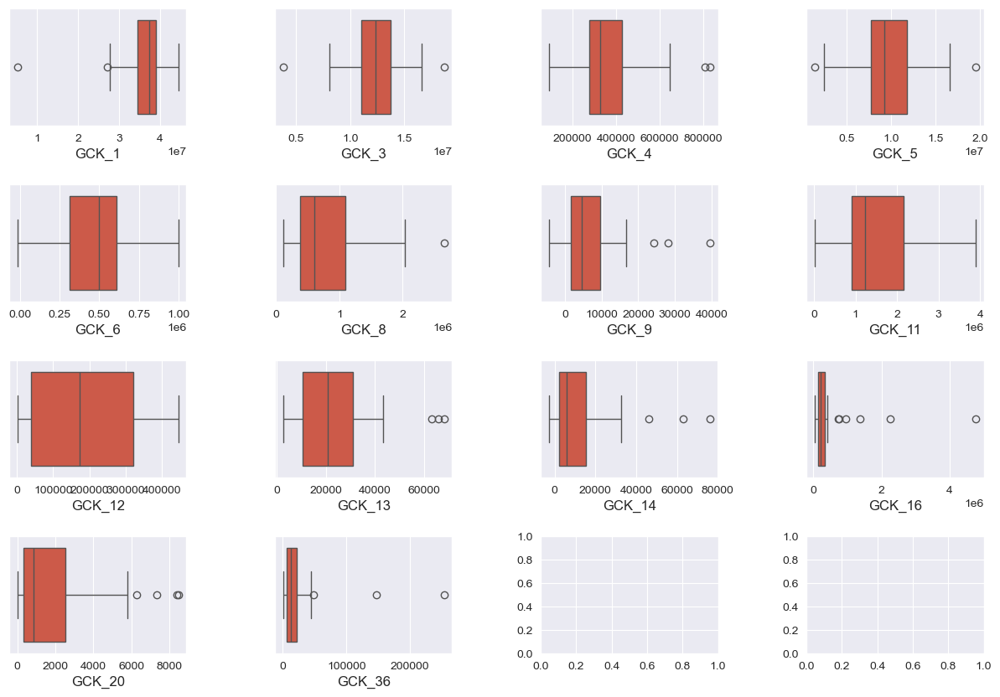

In [134]:
# Do boxplots on all numeric variables
numerical_df =df.select_dtypes(include=[np.number]).columns.tolist()

#lenght of the columns

fig, ax = plt.subplots(4, 4, figsize=(15, 10))
for var, subplot in zip(df[numerical_df], ax.flatten()):
    sns.boxplot(x=df[var], ax=subplot)

plt.subplots_adjust(wspace=0.5, hspace=0.5)

In [136]:
# selected_metric_features = df.columns.tolist()
# # Creating box plots for each metric feature
# for feature in selected_metric_features:
#     plt.figure(figsize=(10, 6))
#     sns.boxplot(x=df[feature])
#     plt.title(f'Box Plot of {feature}')
#     plt.xlabel(feature)
#     plt.show()

In [137]:
# df_outliers = df.copy()


# filters = (
#     (df_outliers['GCK_1']>=3e7) 
#     &
#     (df_outliers['GCK_3']>=0.8e7) 
#     &
#     (df_outliers['GCK_3']<=1.8e7)
#     &
#     (df_outliers['GCK_4']<=700000)
#     &
#     (df_outliers['GCK_8']<=2.5e6)
#     &
#     (df_outliers['GCK_13']<=60000)
#     &
#     (df_outliers['GCK_16']<=4e6)
#     &
#     (df_outliers['GCK_20']<=8000)
#     &
#     (df_outliers['GCK_36']<=100000) 
# )

# df_outliers = df_outliers[filters]

# print('Percentage of data kept after removing outliers:', np.round(df_outliers.shape[0] / df.shape[0], 4), '%')



In [138]:
# df=df_outliers.copy()

In [139]:
# features_outliers = ['GCK_1', 'GCK_3', 'GCK_4', 'GCK_8', 'GCK_13', 'GCK_16', 'GCK_20', 'GCK_36']
    
# # Creating box plots for each metric feature
# for feature in selected_metric_features:
#     plt.figure(figsize=(10, 6))
#     sns.boxplot(x=df[feature])
#     plt.title(f'Box Plot of {feature}')
#     plt.xlabel(feature)
#     plt.show()

<a class="anchor" id="FS">
    
## Feature Engineering
    
</a>

** Suez Canal Obstruction (probable vacation days)**

In [140]:
suez_df=pd.DataFrame({
  'Obstruction': 'Suez Canal Obstruction',
  'df': pd.to_datetime(['2021-03-21', '2021-03-22', '2021-03-23', '2021-03-24', '2021-03-25','2021-03-28'])
})
suez_prophet = suez_df.sort_values(by='df')
suez_prophet.head(3)

,Obstruction,df
0,Suez Canal Obstruction,2021-03-21
1,Suez Canal Obstruction,2021-03-22
2,Suez Canal Obstruction,2021-03-23


<a class="anchor" id="lag">
    
### Converting to Lag Variables
    
</a>

**Market Data**

In [ ]:
lag_months_min=10
lag_months_max=18

# Create lagged features for the market data
market_df_lagged= create_lagged_features(market_df.values, 
                         lag_months_min,lag_months_max, 0,False, 
                         varNames=market_df.columns.values.tolist())

market_df_lagged.set_index(market_df.index,drop=True ,inplace=True)
# market_df_lagged.dropna(inplace=True)
market_df_lagged.head()

,EUR/USD_World(t-18),Price Of Base Metals_World(t-18),Price Of Copper_World(t-18),"Price Of Crude Oil, Average_World(t-18)",Price Of Energy_World(t-18),Price Of Metals & Minerals_World(t-18),Price Of Natural Gas Index_World(t-18),Producer Prices Electrical Equipment_China(t-18),Producer Prices Electrical Equipment_France(t-18),Producer Prices Electrical Equipment_Germany(t-18),Producer Prices Electrical Equipment_Italy(t-18),Producer Prices Electrical Equipment_United States(t-18),Production Index Electrical Equipment_France(t-18),Production Index Electrical Equipment_Germany(t-18),Production Index Electrical Equipment_Italy(t-18),Production Index Electrical Equipment_Japan(t-18),Production Index Electrical Equipment_Switzerland(t-18),Production Index Electrical Equipment_United Kingdom(t-18),Production Index Electrical Equipment_United States(t-18),Production Index Electrical Equipment_World(t-18),Production Index Machinery & Electricals_China(t-18),Production Index Machinery & Electricals_Europe(t-18),Production Index Machinery & Electricals_France(t-18),Production Index Machinery & Electricals_Germany(t-18),Production Index Machinery & Electricals_Italy(t-18),Production Index Machinery & Electricals_Japan(t-18),Production Index Machinery & Electricals_Switzerland(t-18),Production Index Machinery & Electricals_United Kingdom(t-18),Production Index Machinery & Electricals_United States(t-18),Production Index Machinery And Equipment N.E.C._France(t-18),Production Index Machinery And Equipment N.E.C._Germany(t-18),Production Index Machinery And Equipment N.E.C._Italy(t-18),Production Index Machinery And Equipment N.E.C._Japan(t-18),Production Index Machinery And Equipment N.E.C._Switzerland(t-18),Production Index Machinery And Equipment N.E.C._United Kingdom(t-18),Production Index Machinery And Equipment N.E.C._United States(t-18),Production Index Machinery And Equipment N.E.C._World(t-18),Shipments Index Machinery & Electricals_Europe(t-18),Shipments Index Machinery & Electricals_France(t-18),Shipments Index Machinery & Electricals_Germany(t-18),Shipments Index Machinery & Electricals_Italy(t-18),Shipments Index Machinery & Electricals_Japan(t-18),Shipments Index Machinery & Electricals_Switzerland(t-18),Shipments Index Machinery & Electricals_United States(t-18),EUR/USD_World(t-17),Price Of Base Metals_World(t-17),Price Of Copper_World(t-17),"Price Of Crude Oil, Average_World(t-17)",Price Of Energy_World(t-17),Price Of Metals & Minerals_World(t-17),Price Of Natural Gas Index_World(t-17),Producer Prices Electrical Equipment_China(t-17),Producer Prices Electrical Equipment_France(t-17),Producer Prices Electrical Equipment_Germany(t-17),Producer Prices Electrical Equipment_Italy(t-17),Producer Prices Electrical Equipment_United States(t-17),Production Index Electrical Equipment_France(t-17),Production Index Electrical Equipment_Germany(t-17),Production Index Electrical Equipment_Italy(t-17),Production Index Electrical Equipment_Japan(t-17),Production Index Electrical Equipment_Switzerland(t-17),Production Index Electrical Equipment_United Kingdom(t-17),Production Index Electrical Equipment_United States(t-17),Production Index Electrical Equipment_World(t-17),Production Index Machinery & Electricals_China(t-17),Production Index Machinery & Electricals_Europe(t-17),Production Index Machinery & Electricals_France(t-17),Production Index Machinery & Electricals_Germany(t-17),Production Index Machinery & Electricals_Italy(t-17),Production Index Machinery & Electricals_Japan(t-17),Production Index Machinery & Electricals_Switzerland(t-17),Production Index Machinery & Electricals_United Kingdom(t-17),Production Index Machinery & Electricals_United States(t-17),Production Index Machinery And Equipment N.E.C._France(t-17),Production Index Machinery And Equipment N.E.C._Germany(t-17),Production Index Machinery And Equipment N.E.C._Italy(t-17),Production Index Machinery And Equipment N.E.C._Japan(t-17),Production Index Machinery And Equipme

**Sales Data**

In [ ]:
max_lag_sales=8
# Create lagged features for sales data
df_lagged= create_lagged_features(df.values, 
                         1,max_lag_sales, 1,False, 
                         varNames=df.columns.values.tolist())
df_lagged.set_index(df.index,drop=True ,inplace=True)
df_lagged.fillna(0,inplace=True)
df_lagged.head()

,GCK_1(t-8),GCK_3(t-8),GCK_4(t-8),GCK_5(t-8),GCK_6(t-8),GCK_8(t-8),GCK_9(t-8),GCK_11(t-8),GCK_12(t-8),GCK_13(t-8),GCK_14(t-8),GCK_16(t-8),GCK_20(t-8),GCK_36(t-8),GCK_1(t-7),GCK_3(t-7),GCK_4(t-7),GCK_5(t-7),GCK_6(t-7),GCK_8(t-7),GCK_9(t-7),GCK_11(t-7),GCK_12(t-7),GCK_13(t-7),GCK_14(t-7),GCK_16(t-7),GCK_20(t-7),GCK_36(t-7),GCK_1(t-6),GCK_3(t-6),GCK_4(t-6),GCK_5(t-6),GCK_6(t-6),GCK_8(t-6),GCK_9(t-6),GCK_11(t-6),GCK_12(t-6),GCK_13(t-6),GCK_14(t-6),GCK_16(t-6),GCK_20(t-6),GCK_36(t-6),GCK_1(t-5),GCK_3(t-5),GCK_4(t-5),GCK_5(t-5),GCK_6(t-5),GCK_8(t-5),GCK_9(t-5),GCK_11(t-5),GCK_12(t-5),GCK_13(t-5),GCK_14(t-5),GCK_16(t-5),GCK_20(t-5),GCK_36(t-5),GCK_1(t-4),GCK_3(t-4),GCK_4(t-4),GCK_5(t-4),GCK_6(t-4),GCK_8(t-4),GCK_9(t-4),GCK_11(t-4),GCK_12(t-4),GCK_13(t-4),GCK_14(t-4),GCK_16(t-4),GCK_20(t-4),GCK_36(t-4),GCK_1(t-3),GCK_3(t-3),GCK_4(t-3),GCK_5(t-3),GCK_6(t-3),GCK_8(t-3),GCK_9(t-3),GCK_11(t-3),GCK_12(t-3),GCK_13(t-3),GCK_14(t-3),GCK_16(t-3),GCK_20(t-3),GCK_36(t-3),GCK_1(t-2),GCK_3(t-2),GCK_4(t-2),GCK_5(t-2),GCK_6(t-2),GCK_8(t-2),GCK_9(t-2),GCK_11(t-2),GCK_12(t-2),GCK_13(t-2),GCK_14(t-2),GCK_16(t-2),GCK_20(t-2),GCK_36(t-2),GCK_1(t-1),GCK_3(t-1),GCK_4(t-1),GCK_5(t-1),GCK_6(t-1),GCK_8(t-1),GCK_9(t-1),GCK_11(t-1),GCK_12(t-1),GCK_13(t-1),GCK_14(t-1),GCK_16(t-1),GCK_20(t-1),GCK_36(t-1),GCK_1(t),GCK_3(t),GCK_4(t),GCK_5(t),GCK_6(t),GCK_8(t),GCK_9(t),GCK_11(t),GCK_12(t),GCK_13(t),GCK_14(t),GCK_16(t),GCK_20(t),GCK_36(t)
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-10-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,36098918.79,8089465.96,397760.69,2499061.19,369231.60,586052.74,3219.32,1021303.50,28686.33,27666.10,5770.0,333196.87,4563.14,6474.60
2018-11-30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.00,36098918.79,8089465.96,397760.69,2499061.19,369231.60,586052.74,3219.32,1021303.50,28686.33,27666.10,5770.0,333196.87,4563.14,6474.60,5140760.00,11863001.51,371322.42,8993944.04,473046.96,526292.77,1875.90,1898844.80,1070.00,68180.00,17130.0,1377694.32,5798.14,21617.61
2018-12-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.00,0.00,0.00,36098918.79,8089465.96,397760.69,2499061.19,369231.60,586052.74,3219.32,1021303.5,28686.33,27666.10,5770.0,333196.87,4563.14,6474.60,5140760.00,11863001.51,371322.42,8993944.04,473046.96,526292.77,1875.90,1898844.80,1070.00,68180.00,17130.0,1377694.32,5798.14,21617.61,37889612.12,8736859.39,430100.96,6947507.31,999472.69,271490.71,0.00,1226122.00,17880.60,15655.18,0.0,4762524.66,918.65,13924.52
2019-01-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.0,0.0,0.00,0.00,0.0,36098918.79,8089465.96,397760.69,249906

<a class="anchor" id="FS">
    
## 7.5. Feature Selection

</a>

In [144]:
# Shows only the trues values of the lagged variables
df_lagged.var().sort_values()

GCK_20(t-1)    4.910150e+06
GCK_20(t-2)    4.937545e+06
GCK_20(t-3)    4.974229e+06
GCK_20(t-4)    4.974229e+06
GCK_20(t-5)    4.985482e+06
                   ...     
GCK_1(t-4)     1.431311e+14
GCK_1(t-5)     1.672606e+14
GCK_1(t-6)     1.900759e+14
GCK_1(t-7)     2.069199e+14
GCK_1(t-8)     2.261216e+14
Length: 126, dtype: float64

In [ ]:
# Shows only the trues values of the lagged variables
market_df_lagged.var().sort_values()

EUR/USD_World(t-10)                                        0.014463
EUR/USD_World(t-11)                                        0.014519
EUR/USD_World(t-12)                                        0.014580
EUR/USD_World(t-13)                                        0.014633
EUR/USD_World(t-14)                                        0.014680
                                                           ...     
Production Index Machinery & Electricals_China(t-14)    5115.589019
Production Index Machinery & Electricals_China(t-13)    5249.601366
Production Index Machinery & Electricals_China(t-12)    5337.100164
Production Index Machinery & Electricals_China(t-11)    5436.388556
Production Index Machinery & Electricals_China(t-10)    5584.321129
Length: 396, dtype: float64

In [ ]:
def select_relevant_market_df(df, market_df_lagged):
    """
    Selects the most relevant market data variables for each product in 'df' 
    based on Kendall correlation, removing redundant variables (correlation > 0.8).

    Parameters:
    df (pd.DataFrame): DataFrame containing product time series.
    market_df_lagged (pd.DataFrame): DataFrame with lagged market data.

    Returns:
    dict: Dictionary with product names as keys and filtered DataFrames as values.
    """
    products_data = {}

    for product in df.columns:
        # Merge product data with market data on 'date'
        merged_data = df[[product]].merge(market_df_lagged, how="left", on="date")

        # Compute Kendall correlation
        correlations = merged_data.corr(method="kendall")[product].dropna().abs()

        # Select top 20 most correlated features (excluding the product itself)
        top_features = correlations.sort_values(ascending=False)[1:21].index.tolist()

        # Compute correlation matrix and filter out redundant variables
        corr_matrix = merged_data[top_features].corr(method="kendall")
        redundant_cols = set()
        
        for col in top_features:
            if col not in redundant_cols:
                highly_correlated = corr_matrix.index[(corr_matrix[col].abs() > 0.8) & (corr_matrix[col] < 1)]
                redundant_cols.update(highly_correlated)

        # Keep only non-redundant features (max 5)
        selected_features = [col for col in top_features if col not in redundant_cols][:5]

        # Merge selected features with product data
        products_data[product] = df[[product]].merge(
            market_df_lagged[selected_features], how="left", on="date"
        )

    return products_data


In [ ]:

products_dict = select_relevant_market_df(df, market_df_lagged)

In [149]:
products_dict

{'GCK_1':                   GCK_1  Shipments Index Machinery & Electricals_Italy(t-10)  \
 date                                                                           
 2018-10-31  36098918.79                                         131.603833     
 2018-11-30   5140760.00                                          86.417990     
 2018-12-31  37889612.12                                         100.509533     
 2019-01-31  27728148.35                                         120.224693     
 2019-02-28  34793163.53                                         102.883953     
 2019-03-31  33856803.04                                         120.609094     
 2019-04-30  39688292.01                                         126.987611     
 2019-05-31  38897974.29                                         121.357126     
 2019-06-30  39106750.23                                          74.464983     
 2019-07-31  37912572.30                                         115.289962     
 2019-08-31  380426

<a class="anchor" id="df PREP">
    
## Final Dataset Preparation
    
</a>

In [ ]:
# Create a new DataFrame to store the lagged features for each product
products_dict_final=products_dict.copy()
for product in products_dict_final.keys():
    df_lagged_product=df_lagged.loc[:, df_lagged.columns.str.contains(product+"\(")]
    products_dict_final[product]= products_dict_final[product].merge(
        df_lagged_product,how="right",on="date")
    products_dict_final[product].drop(product,axis=1,inplace=True)

In [151]:
products_dict_final

{'GCK_1':             Shipments Index Machinery & Electricals_Italy(t-10)  \
 date                                                              
 2018-10-31                                         131.603833     
 2018-11-30                                          86.417990     
 2018-12-31                                         100.509533     
 2019-01-31                                         120.224693     
 2019-02-28                                         102.883953     
 2019-03-31                                         120.609094     
 2019-04-30                                         126.987611     
 2019-05-31                                         121.357126     
 2019-06-30                                          74.464983     
 2019-07-31                                         115.289962     
 2019-08-31                                         122.456894     
 2019-09-30                                         120.132032     
 2019-10-31                            

<hr>
<a class="anchor" id="Modeling">
    
# 8. Modeling
    
</a>

In [ ]:
# creAATE a dictionary to store the models for each product
products_models={
    'GCK_1': ['arima', 'arima_w_reg', 'xgboost', 'ensemble'],
    'GCK_3': ['arima', 'arima_w_reg', 'xgboost', 'ensemble'],
    'GCK_4': ['arima', 'arima_w_reg', 'xgboost', 'ensemble'],
    'GCK_5': ['arima', 'arima_w_reg', 'xgboost', 'ensemble'],
    'GCK_6': ['arima', 'arima_w_reg', 'xgboost', 'ensemble'],
    'GCK_8': ['arima', 'arima_w_reg', 'xgboost', 'ensemble'],
    'GCK_9': ['arima', 'arima_w_reg', 'xgboost', 'ensemble'],
    'GCK_11': ['arima', 'arima_w_reg', 'xgboost', 'ensemble'],
    'GCK_12': ['arima', 'arima_w_reg', 'xgboost', 'ensemble'],
    'GCK_13': ['arima', 'arima_w_reg', 'xgboost', 'ensemble'],
    'GCK_14': ['arima', 'arima_w_reg', 'xgboost', 'ensemble'],
    'GCK_16': ['arima', 'arima_w_reg', 'xgboost', 'ensemble'],
    'GCK_20': ['arima', 'arima_w_reg', 'xgboost', 'ensemble'],
    'GCK_36': ['arima', 'arima_w_reg', 'xgboost', 'ensemble']
}

In [ ]:


validation_size = 10

products_dict_train={}


products_dict_val={}

for product in products_dict_final.keys():
    
    product_data = products_dict_final[product].copy()
    
    #Add train dataframes for each product to the dictionaries
    products_dict_train[product]={}
    products_dict_train[product]['X']=product_data.copy()[:-validation_size].drop(product+"(t)",axis=1)
    products_dict_train[product]['y']=product_data.copy()[:-validation_size][[product+"(t)"]]

    #Add validation dataframes for each product to the dictionaries
    products_dict_val[product]={}
    products_dict_val[product]['X']=product_data.copy()[-validation_size:].drop(product+"(t)",axis=1)
    products_dict_val[product]['y']=product_data.copy()[-validation_size:][[product+"(t)"]]

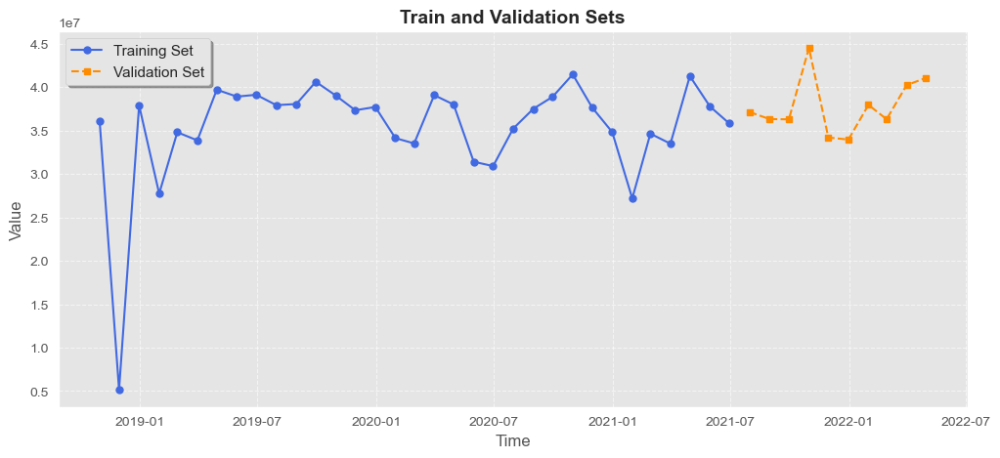

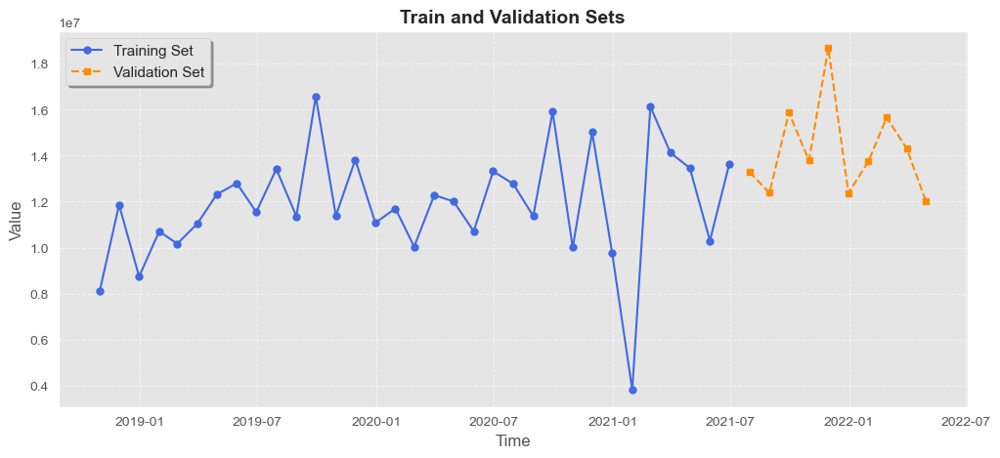

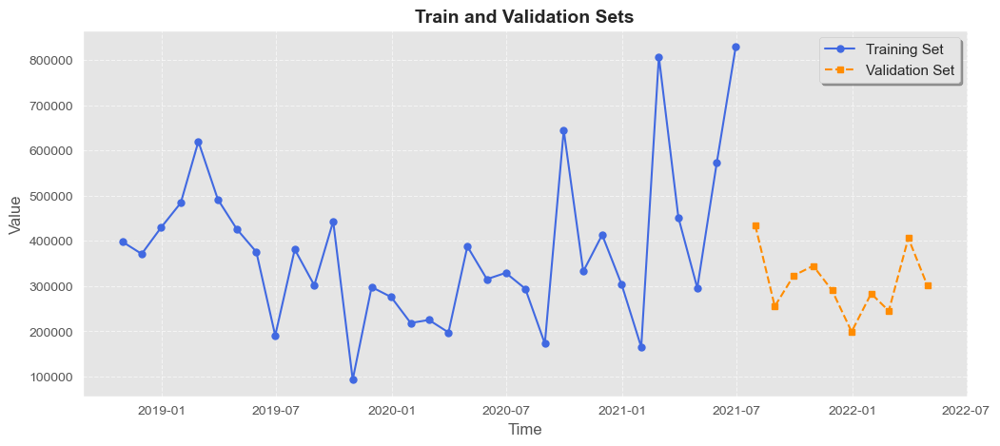

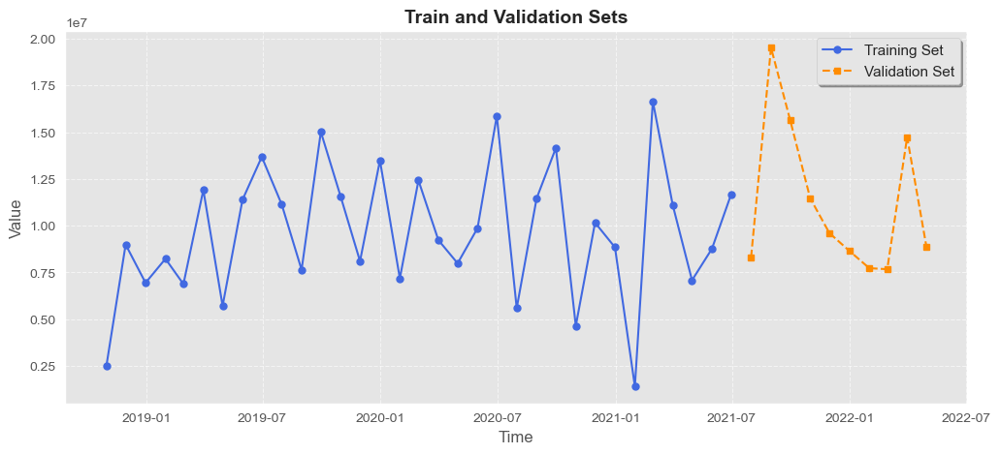

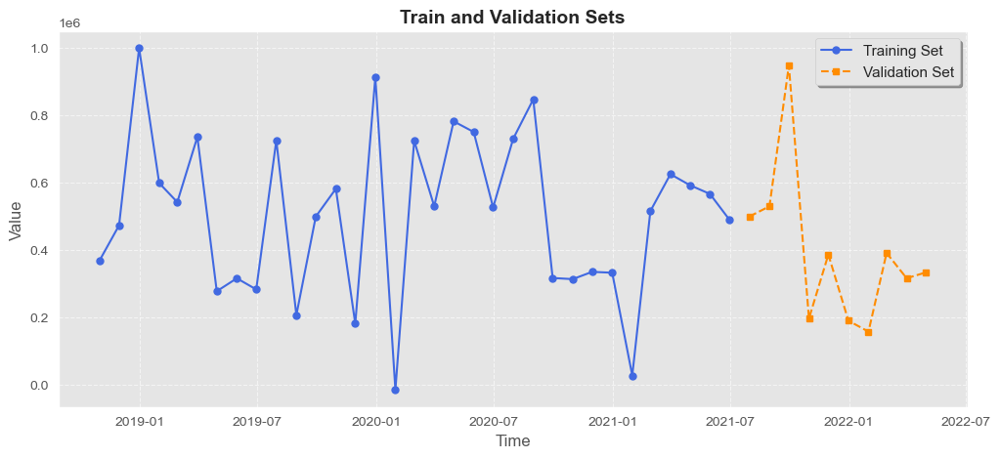

...

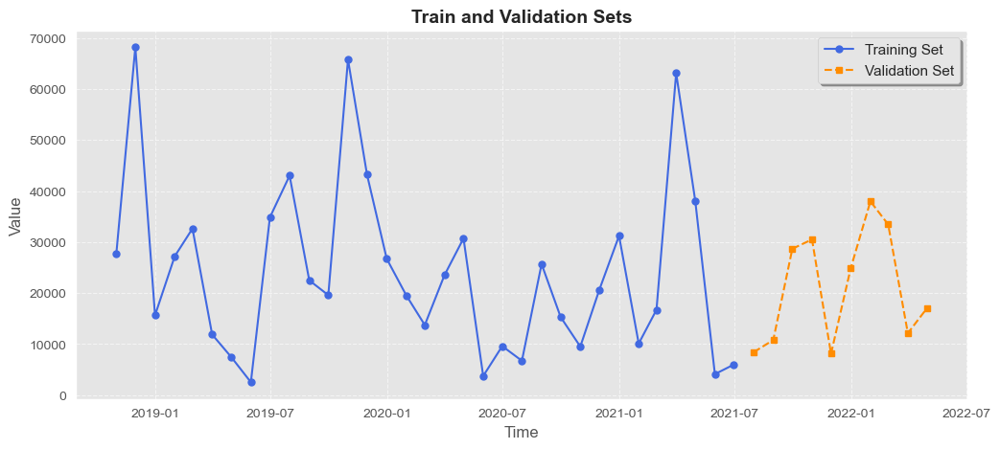

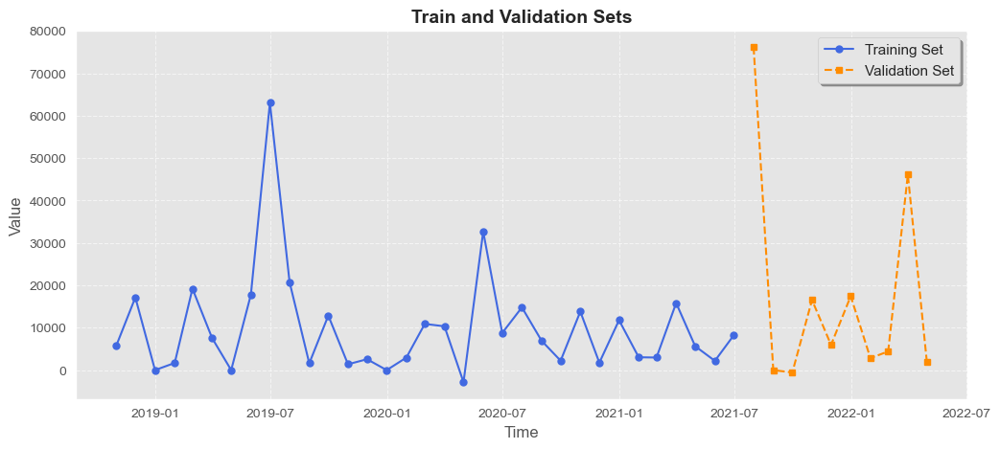

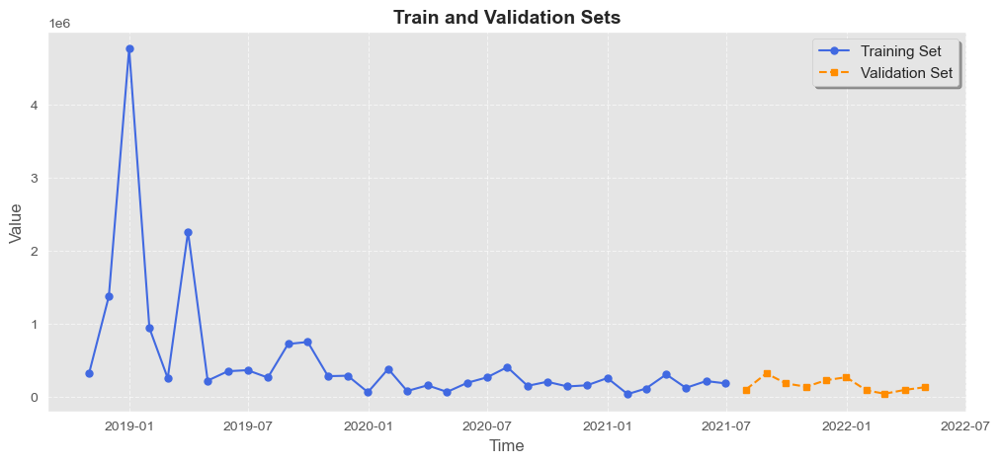

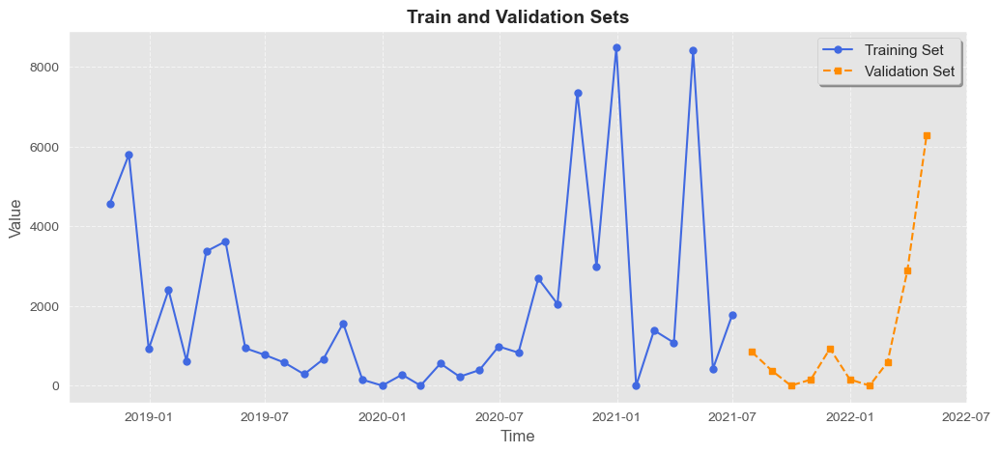

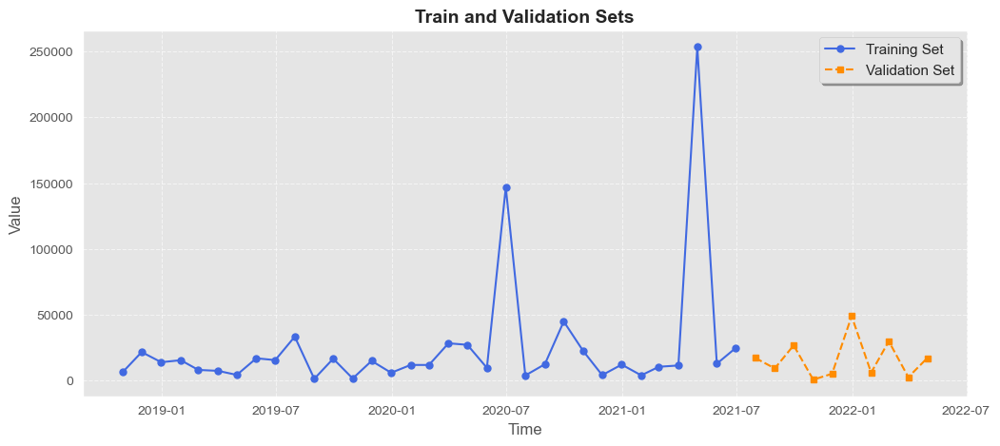

In [154]:
for product in products_models.keys():
    plotTrainValidation(products_dict_train[product]['y'],
                                    y_val=products_dict_val[product]['y'])

In [ ]:

# Create lists of X and y for training and validation sets
X_train_list = list(map(lambda d: d['X'], products_dict_train.values()))
y_train_list = list(map(lambda d: d['y'], products_dict_train.values()))

X_val_list = list(map(lambda d: d['X'], products_dict_val.values()))
y_val_list = list(map(lambda d: d['y'], products_dict_val.values()))

In [ ]:
market_df_lagged

,EUR/USD_World(t-18),Price Of Base Metals_World(t-18),Price Of Copper_World(t-18),"Price Of Crude Oil, Average_World(t-18)",Price Of Energy_World(t-18),Price Of Metals & Minerals_World(t-18),Price Of Natural Gas Index_World(t-18),Producer Prices Electrical Equipment_China(t-18),Producer Prices Electrical Equipment_France(t-18),Producer Prices Electrical Equipment_Germany(t-18),Producer Prices Electrical Equipment_Italy(t-18),Producer Prices Electrical Equipment_United States(t-18),Production Index Electrical Equipment_France(t-18),Production Index Electrical Equipment_Germany(t-18),Production Index Electrical Equipment_Italy(t-18),Production Index Electrical Equipment_Japan(t-18),Production Index Electrical Equipment_Switzerland(t-18),Production Index Electrical Equipment_United Kingdom(t-18),Production Index Electrical Equipment_United States(t-18),Production Index Electrical Equipment_World(t-18),Production Index Machinery & Electricals_China(t-18),Production Index Machinery & Electricals_Europe(t-18),Production Index Machinery & Electricals_France(t-18),Production Index Machinery & Electricals_Germany(t-18),Production Index Machinery & Electricals_Italy(t-18),Production Index Machinery & Electricals_Japan(t-18),Production Index Machinery & Electricals_Switzerland(t-18),Production Index Machinery & Electricals_United Kingdom(t-18),Production Index Machinery & Electricals_United States(t-18),Production Index Machinery And Equipment N.E.C._France(t-18),Production Index Machinery And Equipment N.E.C._Germany(t-18),Production Index Machinery And Equipment N.E.C._Italy(t-18),Production Index Machinery And Equipment N.E.C._Japan(t-18),Production Index Machinery And Equipment N.E.C._Switzerland(t-18),Production Index Machinery And Equipment N.E.C._United Kingdom(t-18),Production Index Machinery And Equipment N.E.C._United States(t-18),Production Index Machinery And Equipment N.E.C._World(t-18),Shipments Index Machinery & Electricals_Europe(t-18),Shipments Index Machinery & Electricals_France(t-18),Shipments Index Machinery & Electricals_Germany(t-18),Shipments Index Machinery & Electricals_Italy(t-18),Shipments Index Machinery & Electricals_Japan(t-18),Shipments Index Machinery & Electricals_Switzerland(t-18),Shipments Index Machinery & Electricals_United States(t-18),EUR/USD_World(t-17),Price Of Base Metals_World(t-17),Price Of Copper_World(t-17),"Price Of Crude Oil, Average_World(t-17)",Price Of Energy_World(t-17),Price Of Metals & Minerals_World(t-17),Price Of Natural Gas Index_World(t-17),Producer Prices Electrical Equipment_China(t-17),Producer Prices Electrical Equipment_France(t-17),Producer Prices Electrical Equipment_Germany(t-17),Producer Prices Electrical Equipment_Italy(t-17),Producer Prices Electrical Equipment_United States(t-17),Production Index Electrical Equipment_France(t-17),Production Index Electrical Equipment_Germany(t-17),Production Index Electrical Equipment_Italy(t-17),Production Index Electrical Equipment_Japan(t-17),Production Index Electrical Equipment_Switzerland(t-17),Production Index Electrical Equipment_United Kingdom(t-17),Production Index Electrical Equipment_United States(t-17),Production Index Electrical Equipment_World(t-17),Production Index Machinery & Electricals_China(t-17),Production Index Machinery & Electricals_Europe(t-17),Production Index Machinery & Electricals_France(t-17),Production Index Machinery & Electricals_Germany(t-17),Production Index Machinery & Electricals_Italy(t-17),Production Index Machinery & Electricals_Japan(t-17),Production Index Machinery & Electricals_Switzerland(t-17),Production Index Machinery & Electricals_United Kingdom(t-17),Production Index Machinery & Electricals_United States(t-17),Production Index Machinery And Equipment N.E.C._France(t-17),Production Index Machinery And Equipment N.E.C._Germany(t-17),Production Index Machinery And Equipment N.E.C._Italy(t-17),Production Index Machinery And Equipment N.E.C._Japan(t-17),Production Index Machinery And Equipme

In [ ]:

estimators=[]

#list with all rmses and models names

for product,models in products_models.items():
    # Split the data into training and validation sets
    X_train = products_dict_train[product]['X']
    y_train = products_dict_train[product]['y']
    X_val = products_dict_val[product]['X']
    y_val = products_dict_val[product]['y']
    
    # Create an empty dictionary to store the forecasts for each model
    forecasts={}
    rmse_list=[]
    
    # Apply statistical models (if specified in `models`)

    if 'mean' in models:
        # Use the mean of the training data as a forecast
        forecasts['mean']= np.full(len(y_val),np.mean(y_train))
        rmse= np.sqrt(metrics.mean_squared_error(y_val, forecasts['mean']))
        rmse_list.append(('mean',rmse))
        
    if 'median' in models:
        # Use the median of the training data as a forecast
        forecasts['median']= np.full(len(y_val),np.median(y_train))
        rmse= np.sqrt(metrics.mean_squared_error(y_val, forecasts['median']))
        rmse_list.append(('median',rmse))
    
    if 'arima' in models:
        # Use Arima to make a forecast
        
        # fitting Arima with training datas
        arima = auto_arima(y_train,start_p=1,start_q=1, trace=False,stationary=True, 
                           steperror_action='ignore', suppress_warnings=True)
        # make prediction for the validation
        forecasts['arima'] = arima.predict(n_periods=10)
        
        rmse= np.sqrt(metrics.mean_squared_error(y_val, forecasts['arima']))
        rmse_list.append(('arima',rmse))
        
    if 'arima_w_reg' in models:
        # Use Arima with exogenous regressors to make a forecast
        
        # Defining external variables. The lags of the product sales are not included.
        regressors_arima = [regressor for regressor in X_train.columns if "GCK" not in regressor]

        # fitting Arima with training data and regressors
        arima_w_reg = auto_arima(y_train, X_train[regressors_arima],start_p=1,start_q=1,stationary=True, trace=False, steperror_action='ignore', suppress_warnings=True)
        # make prediction for the validation
        forecasts['arima_w_reg'] = arima_w_reg.predict(n_periods=10, X=X_val[regressors_arima])
        
        rmse= np.sqrt(metrics.mean_squared_error(y_val, forecasts['arima_w_reg']))
        rmse_list.append(('arima_w_reg',rmse))
        
    # Apply Machine Learning models (if specified in `models`)   
    
    if 'xgboost' in models:
        # Use XGBoost with exogenous regressors to make a forecast

        rmse_list_xgboost = []
        #Testing different parameters (hyperparameter tuning), and retrieving the model with the lowest rmse result on validation
        for n_estimators in [40,50,60,70,80,90,100]:
            for max_depth in [3, 5, 7,9,12]:
                for learning_rate in [0.1,0.2,0.3,0.4,0.5]:
                    # fill null values, since this model uses the sales lag features                    
                    X_train_xgboost= X_train.copy()
                    y_train_xgboost = y_train.loc[X_train_xgboost.index].copy()
                    xgboost_name= "xgboost("+str(n_estimators)+","+\
                        str(max_depth)+","+\
                        str(learning_rate)+")"
                    
                    xgboost=xgb.XGBRegressor(n_estimators=n_estimators,max_depth=max_depth,learning_rate=learning_rate)
                    # fit the model object to the training data
                    _,_,predictions = xgboostModel_predict_months(xgboost,X_train_xgboost,y_train_xgboost,len(X_val))
                    rmse_xgboost= np.sqrt(metrics.mean_squared_error(y_val, predictions))
                    rmse_list_xgboost.append((xgboost_name,xgboost, rmse_xgboost))
        
        # Find the xgboost with the lowest RMSE
        best_xgboost_name,best_xgboost, rmse = min(rmse_list_xgboost, key=lambda x: x[2])
        forecasts[best_xgboost_name] = best_xgboost.predict(X_val)
        
        rmse= np.sqrt(metrics.mean_squared_error(y_val, forecasts[best_xgboost_name]))
        rmse_list.append((best_xgboost_name,rmse))
        
    # Using the average of all models as forecasting method.
    if 'ensemble' in models:
        # List to store the RMSE for each combination of forecasts
        rmse_list_ensemble = []

        # Generate all possible combinations of the forecasts with more than 2 elements
        for i in range(2, len(forecasts.keys()) + 1):
            for combination in itertools.combinations(forecasts.keys(), i):
                ensemble_name= "ensemble["+';'.join(combination)+"]"
                    
                # Calculate the ensemble forecast for the current combination
                ensemble_forecast = sum(forecasts[forecast] for forecast in combination) / len(combination)
                    
                # Calculate the RMSE for the ensemble forecast
                rmse_ensemble = np.sqrt(metrics.mean_squared_error(y_val, ensemble_forecast))  
                # Add the RMSE to the list
                rmse_list_ensemble.append((combination,ensemble_name, rmse_ensemble))
                
        
        # Find the combination with the lowest RMSE
        best_combination,best_ensemble_name, rmse = min(rmse_list_ensemble, key=lambda x: x[2])
        # Calculate the final ensemble forecast using the best combination
        forecasts[best_ensemble_name] = sum(forecasts[forecast] for forecast in best_combination) / len(best_combination)
        
        
        rmse= np.sqrt(metrics.mean_squared_error(y_val, forecasts[best_ensemble_name]))
        rmse_list.append((best_ensemble_name,rmse))

    # Find the model with the lowest RMSE
    best_model_name, lowest_rmse = min(rmse_list, key=lambda x: x[1])
            
    print("Product",product,"best model:")
    print(best_model_name,"|RMSE:",lowest_rmse)
    
    products_dict_val[product]['pred_y']=pd.DataFrame(forecasts[best_model_name],index=y_val.index)
    estimators.append((product,best_model_name))

Product GCK_1 best model:
arima |RMSE: 3947458.879377479
Product GCK_3 best model:
ensemble[arima;arima_w_reg] |RMSE: 1670988.9566354805
Product GCK_4 best model:
ensemble[arima;xgboost(40,3,0.1)] |RMSE: 98539.69329918227
Product GCK_5 best model:
ensemble[arima;arima_w_reg;xgboost(40,12,0.1)] |RMSE: 3502874.9941151747
Product GCK_6 best model:
ensemble[arima;arima_w_reg] |RMSE: 167622.49743993455
Product GCK_8 best model:
arima_w_reg |RMSE: 618870.0743289717
Product GCK_9 best model:
arima |RMSE: 5551.012806754693
Product GCK_11 best model:
arima |RMSE: 1111813.277123434
Product GCK_12 best model:
ensemble[arima;xgboost(40,3,0.1)] |RMSE: 94771.43428737085
Product GCK_13 best model:
arima_w_reg |RMSE: 9995.453184538941
Product GCK_14 best model:
arima_w_reg |RMSE: 23268.030285558107
Product GCK_16 best model:
xgboost(90,3,0.1) |RMSE: 95789.22825951982
Product GCK_20 best model:
arima_w_reg |RMSE: 1274.070196192551
Product GCK_36 best model:
xgboost(40,3,0.1) |RMSE: 14297.677363966144


In [160]:
print("Available keys in products_dict_final:", list(products_dict_final.keys()))

Available keys in products_dict_final: ['GCK_1', 'GCK_3', 'GCK_4', 'GCK_5', 'GCK_6', 'GCK_8', 'GCK_9', 'GCK_11', 'GCK_12', 'GCK_13', 'GCK_14', 'GCK_16', 'GCK_20', 'GCK_36']


In [ ]:
X_train_list=[]
X_test_list=[]
y_train_list=[]
y_test_list=[]
train_dict={}
for product in df.columns:
    columns_sales= [column for column in df_lagged if (product+"(") in column]
    train_dict[product]= df_lagged[columns_sales]
    
    # filter column already chosen in Feature selection
    columns_market= [column for column in products_dict_final[product] if 'GCK' not in column]
    train_dict[product] = train_dict[product].merge(market_df_lagged[columns_market],how="left",on="date")
    train_dict[product].index.name="date"
    X_train= train_dict[product].drop(product+"(t)",axis=1)
    y_train= train_dict[product][[product+"(t)"]]
    X_train,y_train,_ = xgboostModel_predict_months(xgboost,X_train,y_train,10)
    
    X_train.index.name="date"
    y_train.index.name="date"
    X_train_list.append(X_train.iloc[:-10,:])
    X_test_list.append(X_train.iloc[-10:,:])
    y_train_list.append(y_train.iloc[:-10,:])
    y_test_list.append(y_train.iloc[-10:,:])

In [162]:
y_test_list

[              GCK_1(t)
 date                  
 2022-05-30  41053204.0
 2022-06-30  41053204.0
 2022-07-30  41053204.0
 2022-08-30  41053204.0
 2022-09-30  41053204.0
 2022-10-30  41053204.0
 2022-11-30  41053204.0
 2022-12-30  41053204.0
 2023-01-30  41053204.0
 2023-02-28  41053204.0,
               GCK_3(t)
 date                  
 2022-05-30  11999375.0
 2022-06-30  11999375.0
 2022-07-30  11999375.0
 2022-08-30  11999375.0
 2022-09-30  11999375.0
 2022-10-30  11999375.0
 2022-11-30  11999375.0
 2022-12-30  11999375.0
 2023-01-30  11999375.0
 2023-02-28  11999375.0,
                 GCK_4(t)
 date                    
 2022-05-30  302057.03125
 2022-06-30  302057.03125
 2022-07-30  302057.03125
 2022-08-30  302057.03125
 2022-09-30  302057.03125
 2022-10-30  302057.03125
 2022-11-30  302057.03125
 2022-12-30  302057.03125
 2023-01-30  302057.03125
 2023-02-28  302057.03125,
              GCK_5(t)
 date                 
 2022-05-30  8884608.0
 2022-06-30  8884608.0
 2022-07-30  8884

In [210]:
X_test_list

[             GCK_1(t-8)   GCK_1(t-7)   GCK_1(t-6)  GCK_1(t-5)   GCK_1(t-4)  \
 date                                                                         
 2022-05-30  36310817.42  36278886.58  44483013.86  34187395.6  33950069.83   
 2022-06-30  36310817.42  36278886.58  44483013.86  34187395.6  33950069.83   
 2022-07-30  36310817.42  36278886.58  44483013.86  34187395.6  33950069.83   
 2022-08-30  36310817.42  36278886.58  44483013.86  34187395.6  33950069.83   
 2022-09-30  36310817.42  36278886.58  44483013.86  34187395.6  33950069.83   
 2022-10-30  36310817.42  36278886.58  44483013.86  34187395.6  33950069.83   
 2022-11-30  36310817.42  36278886.58  44483013.86  34187395.6  33950069.83   
 2022-12-30  36310817.42  36278886.58  44483013.86  34187395.6  33950069.83   
 2023-01-30  36310817.42  36278886.58  44483013.86  34187395.6  33950069.83   
 2023-02-28  36310817.42  36278886.58  44483013.86  34187395.6  33950069.83   
 
              GCK_1(t-3)   GCK_1(t-2)   GCK_1(t-1)

In [211]:
final_ensemble= ProductsEnsemble(estimators,suez_prophet) 
final_predictions = final_ensemble.fit_predict_all(X_train_list,y_train_list,X_test_list,y_test_list)

In [212]:
print(final_predictions)  # Para ver o formato da previsão

[                       0
2022-05-31  3.591177e+07
2022-06-30  3.591177e+07
2022-07-31  3.591177e+07
2022-08-31  3.591177e+07
2022-09-30  3.591177e+07
2022-10-31  3.591177e+07
2022-11-30  3.591177e+07
2022-12-31  3.591177e+07
2023-01-31  3.591177e+07
2023-02-28  3.591177e+07,                        0
2022-05-31  1.379629e+07
2022-06-30  1.333926e+07
2022-07-31  1.347032e+07
2022-08-31  1.343274e+07
2022-09-30  1.344351e+07
2022-10-31  1.344042e+07
2022-11-30  1.344131e+07
2022-12-31  1.344106e+07
2023-01-31  1.344113e+07
2023-02-28  1.344111e+07,                         0
2022-05-31  325575.310581
2022-06-30  326075.951206
2022-07-31  326196.826206
2022-08-31  326858.919956
2022-09-30  327089.841831
2022-10-31  326789.279331
2022-11-30  326802.857456
2022-12-31  327579.857456
2023-01-31  326510.404331
2023-02-28  327194.185581,                        0
2022-05-31  9.625015e+06
2022-06-30  9.631534e+06
2022-07-31  9.633433e+06
2022-08-31  9.634007e+06
2022-09-30  9.635856e+06
2022-10-31

In [215]:
# Create copies of the original DataFrame for manipulation
test_export = test.copy()
test_manipulation = test.copy()

In [216]:
test_manipulation.head(10)

,Month Year,Mapped_GCK,Sales_EUR
0,Mai 22,#3,NaN
1,Jun 22,#3,NaN
2,Jul 22,#3,NaN
3,Aug 22,#3,NaN
4,Sep 22,#3,NaN
5,Okt 22,#3,NaN
6,Nov 22,#3,NaN
7,Dez 22,#3,NaN
8,Jan 23,#3,NaN
9,Feb 23,#3,NaN


In [ ]:
# Convert 'Month Year' to datetime format
locale.setlocale(locale.LC_TIME, 'de_DE.UTF-8')

test_manipulation['Month Year'] = pd.to_datetime(test_manipulation['Month Year'],format="%b %y")+pd.offsets.MonthEnd(1)

# Map Mapped_GCK values to 'GCK_number', removing any '#' symbols
test_manipulation['Mapped_GCK'] = "GCK_" + test_manipulation['Mapped_GCK'].str.replace('#', '', regex=False)


In [218]:
test_manipulation

,Month Year,Mapped_GCK,Sales_EUR
0,2022-05-31,GCK_3,NaN
1,2022-06-30,GCK_3,NaN
2,2022-07-31,GCK_3,NaN
3,2022-08-31,GCK_3,NaN
4,2022-09-30,GCK_3,NaN
...,...,...,...
135,2022-10-31,GCK_1,NaN
136,2022-11-30,GCK_1,NaN
137,2022-12-31,GCK_1,NaN
138,2023-01-31,GCK_1,NaN


In [ ]:
values_to_input = []
for key, row in test_manipulation.iterrows():
    if row['Mapped_GCK'] in train_dict.keys():
        index = list(train_dict.keys()).index(row['Mapped_GCK'])
        try:
            values_to_input.append(final_predictions[index].loc[row['Month Year'], 0])
        except KeyError:
            
            values_to_input.append(None)
    else:
        values_to_input.append(None)

In [220]:
train_dict.keys()

dict_keys(['GCK_1', 'GCK_3', 'GCK_4', 'GCK_5', 'GCK_6', 'GCK_8', 'GCK_9', 'GCK_11', 'GCK_12', 'GCK_13', 'GCK_14', 'GCK_16', 'GCK_20', 'GCK_36'])

In [221]:
test_export['Sales_EUR']=values_to_input


In [222]:
test_export.to_csv('Case2_Test Set.csv',sep=";",)

In [ ]:
products_dict_val[product]['y']

,GCK_36(t)
date,
2021-07-31,17159.27
2021-08-31,9233.40
2021-09-30,26729.61
2021-10-31,674.00
2021-11-30,5139.48
2021-12-31,48933.50
2022-01-31,6014.39
2022-02-28,29869.50
2022-03-31,2564.85


<hr>
<a class="anchor" id="Evaluation">
    
# Evaluation
    
</a>

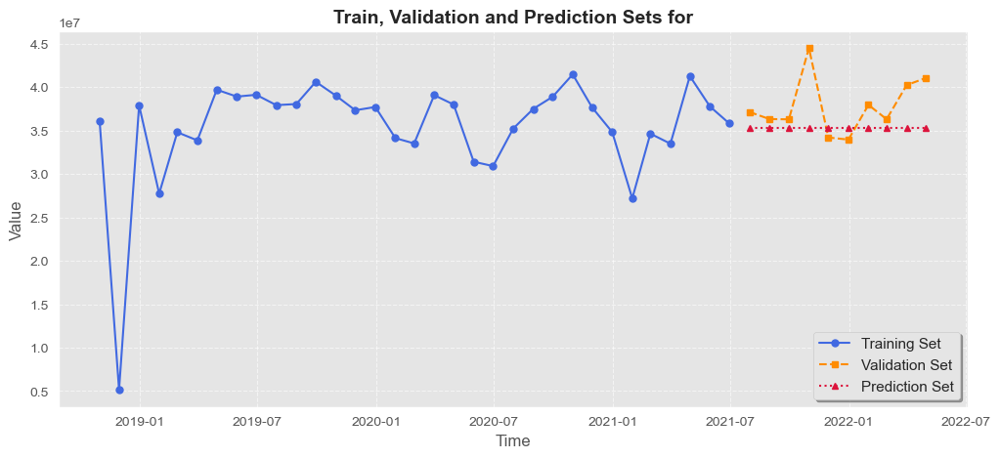

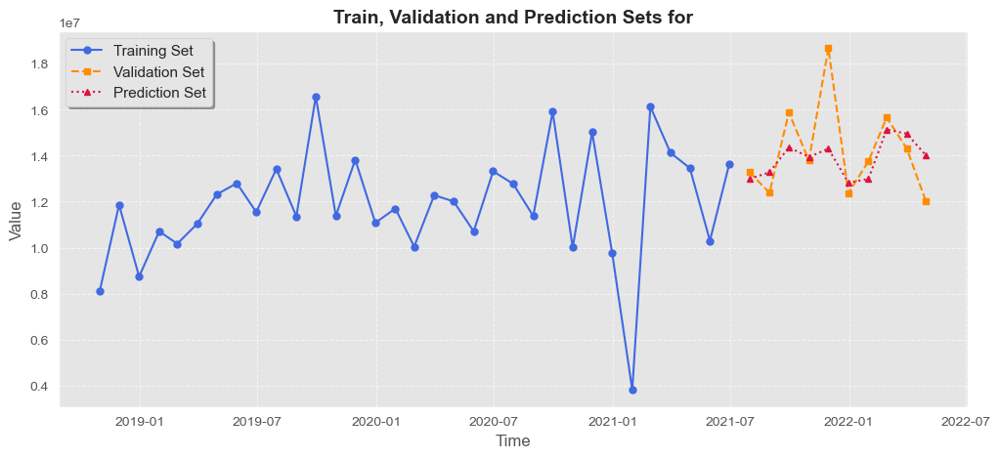

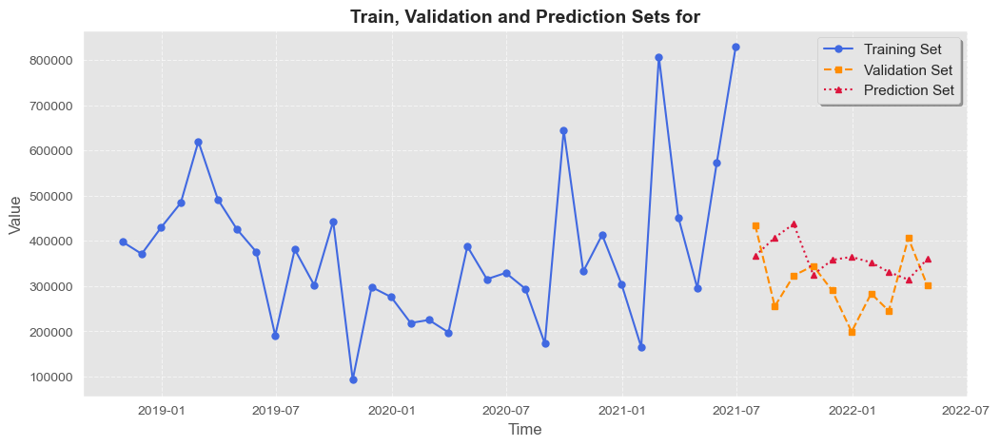

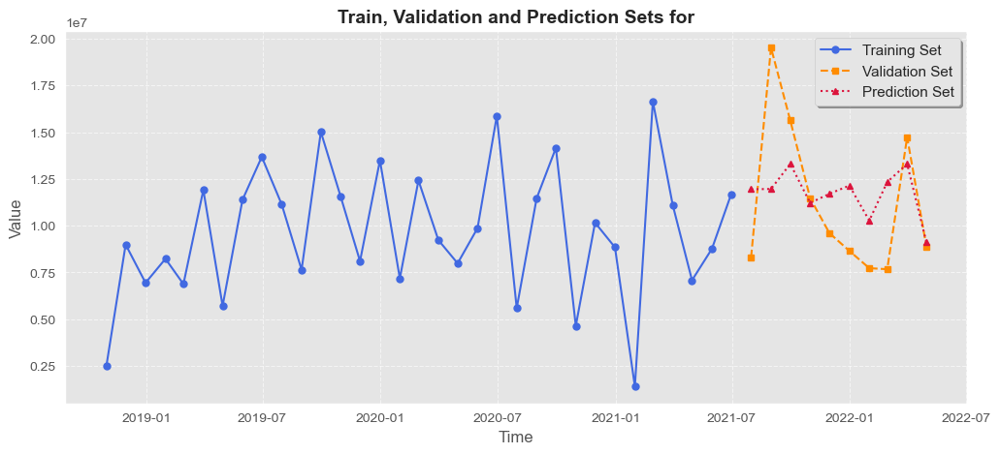

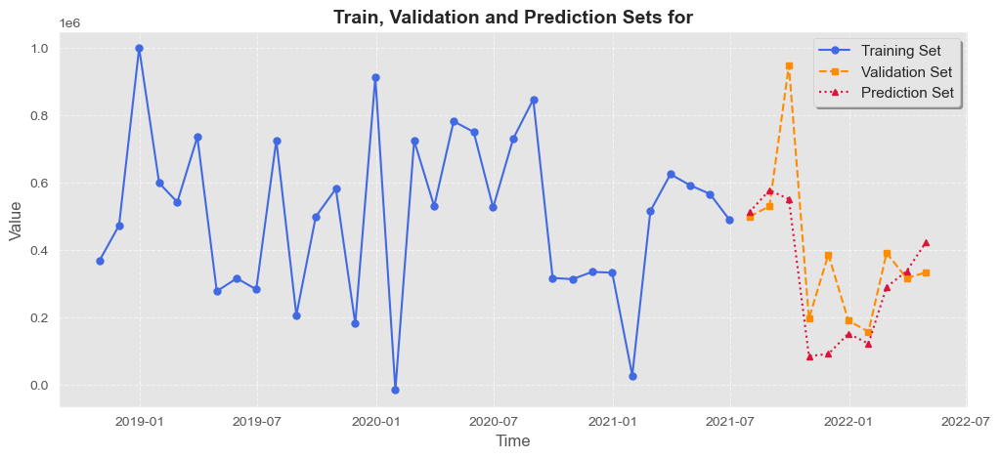

...

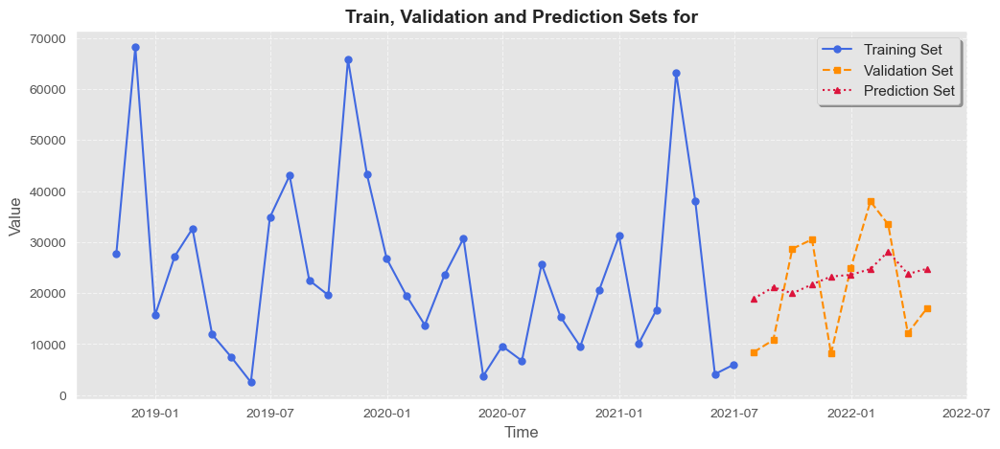

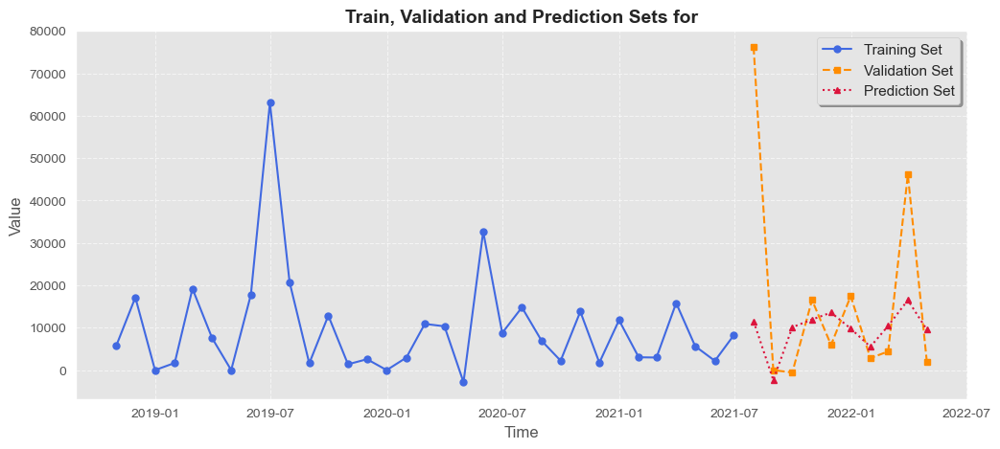

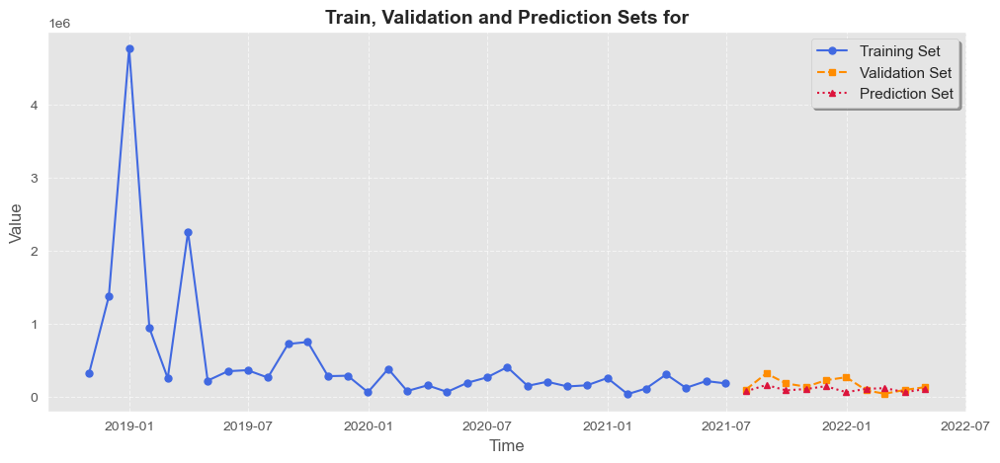

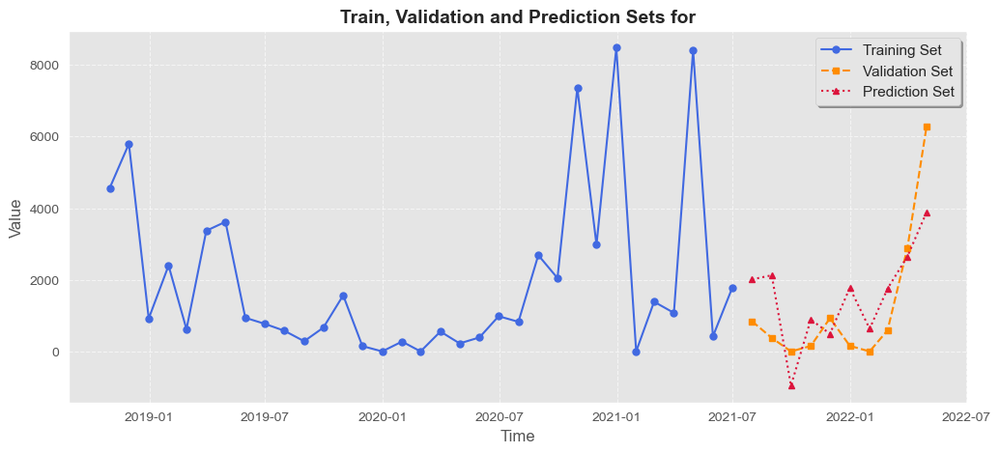

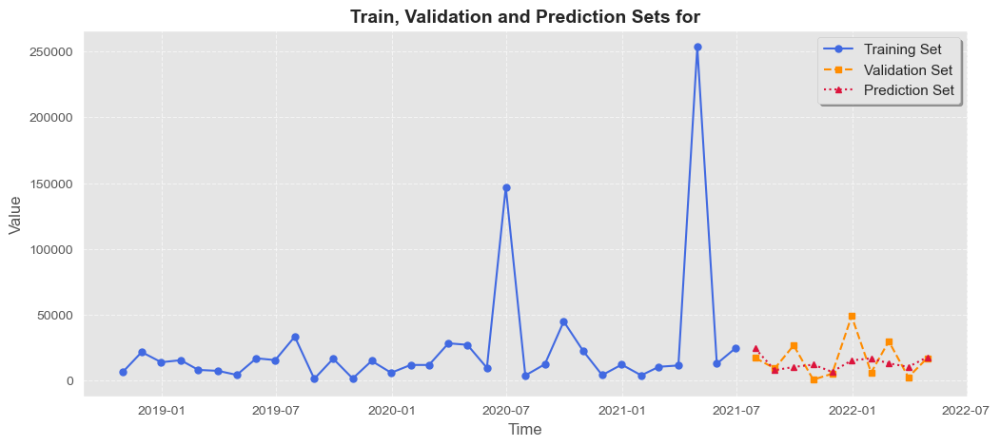

In [255]:
products_to_evaluate = ['GCK_1','GCK_3','GCK_4','GCK_5','GCK_6','GCK_8','GCK_9',
                        'GCK_11','GCK_12','GCK_13','GCK_14','GCK_16','GCK_20','GCK_36']

for product in products_to_evaluate:
    if product in products_dict_val and 'pred_y' in products_dict_val[product]:
        y_pred = products_dict_val[product]['pred_y']
        
        # Ensure the index is aligned with your test_export DataFrame
        y_pred.index = pd.to_datetime(y_pred.index)  # Ensure datetime format
        
        # Align test_export['Sales_EUR'] with your predictions if necessary
        test_export.index = pd.to_datetime(test_export.index)
        
        # Now plot using the properly aligned y_pred
        plotTrainprediction(products_dict_train[product]['y'],
                            y_val=products_dict_val[product]['y'],
                            y_pred=y_pred
                            )
    else:
        print(f"Prediction data not found for {product}")
             

In [256]:

product = 'GCK_1'
metricstable (metrics,
                                    yTest=products_dict_val[product]['y'], 
                                    yPredTest=products_dict_val[product]['pred_y'])


,Measure,Test
0,MAE,2951012.505
1,RMSE,3947458.879
2,R^2,-0.619
3,MAPE (%),0.074
4,MAX Error,9138887.172


In [257]:

product= 'GCK_3'

metricstable (metrics,
                                    yTest=products_dict_val[product]['y'], 
                                    yPredTest=products_dict_val[product]['pred_y'])


,Measure,Test
0,MAE,1162741.515
1,RMSE,1670988.957
2,R^2,0.260
3,MAPE (%),0.077
4,MAX Error,4381455.783


In [258]:

product= 'GCK_4'

metricstable (metrics,
                                    yTest=products_dict_val[product]['y'], 
                                    yPredTest=products_dict_val[product]['pred_y'])


,Measure,Test
0,MAE,89168.677
1,RMSE,98539.693
2,R^2,-1.075
3,MAPE (%),0.324
4,MAX Error,165647.374


In [259]:

product= 'GCK_5'

metricstable (metrics,
                                    yTest=products_dict_val[product]['y'], 
                                    yPredTest=products_dict_val[product]['pred_y'])


,Measure,Test
0,MAE,2822383.689
1,RMSE,3502874.994
2,R^2,0.174
3,MAPE (%),0.268
4,MAX Error,7558188.167


In [260]:

product= 'GCK_6'

metricstable (metrics,
                                    yTest=products_dict_val[product]['y'], 
                                    yPredTest=products_dict_val[product]['pred_y'])


,Measure,Test
0,MAE,114965.391
1,RMSE,167622.497
2,R^2,0.418
3,MAPE (%),0.289
4,MAX Error,397014.258


In [261]:

product= 'GCK_8'

metricstable (metrics,
                                    yTest=products_dict_val[product]['y'], 
                                    yPredTest=products_dict_val[product]['pred_y'])


,Measure,Test
0,MAE,403006.682
1,RMSE,618870.074
2,R^2,-0.077
3,MAPE (%),0.400
4,MAX Error,1459216.022


In [262]:

product= 'GCK_9'

metricstable (metrics,
                                    yTest=products_dict_val[product]['y'], 
                                    yPredTest=products_dict_val[product]['pred_y'])


,Measure,Test
0,MAE,5241.337
1,RMSE,5551.013
2,R^2,-0.060
3,MAPE (%),3.667
4,MAX Error,7454.959


In [263]:
product= 'GCK_11'

metricstable (metrics,
                                    yTest=products_dict_val[product]['y'], 
                                    yPredTest=products_dict_val[product]['pred_y'])


,Measure,Test
0,MAE,935623.840
1,RMSE,1111813.277
2,R^2,-0.205
3,MAPE (%),1.083
4,MAX Error,2369490.172


In [264]:
product= 'GCK_12'

metricstable (metrics,
                                    yTest=products_dict_val[product]['y'], 
                                    yPredTest=products_dict_val[product]['pred_y'])


,Measure,Test
0,MAE,78657.242
1,RMSE,94771.434
2,R^2,0.156
3,MAPE (%),0.347
4,MAX Error,162443.486


In [265]:
product= 'GCK_13'

metricstable (metrics,
                                    yTest=products_dict_val[product]['y'], 
                                    yPredTest=products_dict_val[product]['pred_y'])


,Measure,Test
0,MAE,9267.019
1,RMSE,9995.453
2,R^2,0.115
3,MAPE (%),0.662
4,MAX Error,15114.689


In [266]:
product= 'GCK_14'

metricstable (metrics,
                                    yTest=products_dict_val[product]['y'], 
                                    yPredTest=products_dict_val[product]['pred_y'])


,Measure,Test
0,MAE,1.434912e+04
1,RMSE,2.326803e+04
2,R^2,4.300000e-02
3,MAPE (%),1.050933e+18
4,MAX Error,6.464307e+04


In [267]:
product= 'GCK_16'

metricstable (metrics,
                                    yTest=products_dict_val[product]['y'], 
                                    yPredTest=products_dict_val[product]['pred_y'])


,Measure,Test
0,MAE,74901.578
1,RMSE,95789.228
2,R^2,-0.303
3,MAPE (%),0.498
4,MAX Error,204195.023


In [268]:
product= 'GCK_20'

metricstable (metrics,
                                    yTest=products_dict_val[product]['y'], 
                                    yPredTest=products_dict_val[product]['pred_y'])


,Measure,Test
0,MAE,1.109006e+03
1,RMSE,1.274070e+03
2,R^2,5.360000e-01
3,MAPE (%),7.149366e+17
4,MAX Error,2.394031e+03


In [269]:
product= 'GCK_36'

metricstable (metrics,
                                    yTest=products_dict_val[product]['y'], 
                                    yPredTest=products_dict_val[product]['pred_y'])


,Measure,Test
0,MAE,10751.487
1,RMSE,14297.677
2,R^2,0.014
3,MAPE (%),2.448
4,MAX Error,33611.182
